### Load packages

In [1]:
import os
import fnmatch
import json
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)
import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
# !pip install -q adjustText
# from adjustText import adjust_text # not quite useful
import random


def find_dirs(target_name, root_path):
    match_files = []
    for root, dirs, files in os.walk(root_path):
        for dir_name in dirs:
            if target_name == dir_name:
                match_files.append(os.path.join(root, dir_name))
    return match_files

def find_files(pattern, root_path, recursive=False):
    match_files = []
    if recursive:
        for root, dirs, files in os.walk(root_path):
            for file_name in files:
                if fnmatch.fnmatch(file_name, pattern):
                    match_files.append(os.path.join(root_path, file_name))
    else:
        # list all subfiles
        for file_name in os.listdir(root_path):
            if fnmatch.fnmatch(file_name, pattern):
                match_files.append(os.path.join(root_path, file_name))

    return match_files

def load_eval_results(eval_file_dict, previous_eval_dict_list=[]):
    '''
    Load eval results from json files and return a dict with averaged scores.
    input eval_file_dict is a dict in which key is a dir path and value is a list of eval files.
    '''
    eval_dict_list = previous_eval_dict_list
    loaded_evals_set = set(eval_dict['path'] for eval_dict in previous_eval_dict_list)
    new_evals_set = set()
    
    exp_set =set()
    for eval_dir_name, eval_file_list in tqdm.tqdm(eval_file_dict.items(), desc='Processing eval dir'):
        for eval_file in tqdm.tqdm(eval_file_list, desc='Processing eval dir %s' % eval_dir_name, miniters=100):
    #         print(eval_file)
            new_evals_set.add(eval_file)
            if eval_file in loaded_evals_set:
                continue
                
            name_fields = eval_file.split('/')

            eval_dict = {}
            

            eval_dict['path'] = eval_file
            eval_dict['exp_group'] = name_fields[-5]

            eval_dict['exp_name'] = name_fields[-1][: name_fields[-1].rfind('_step')]
            exp_fields = name_fields[-1][: name_fields[-1].rfind('.')].split('-')
            
#             if eval_dict['exp_name'] in exp_set:
#                 continue
#             exp_set.add(eval_dict['exp_name'])

#             for i, k in enumerate(name_fields):
#                 print('%d: %s' % (i, k))

#             for i, k in enumerate(exp_fields):
#                 print('%d: %s' % (i, k))

            if '-v3' in eval_file:
                eval_dict['test_name'] = name_fields[-1][name_fields[-1].rfind('step'): name_fields[-1].rfind('.')]
                eval_dict['tokenization'], eval_dict['train_mode'], _ = name_fields[-4].split('-')

                eval_dict['model_base'] = exp_fields[4]
                eval_dict['order'] = exp_fields[3]
                eval_dict['train_dataset'] = exp_fields[2]
                eval_dict['step'] = int(eval_dict['test_name'][eval_dict['test_name'].find('_')+1: eval_dict['test_name'].find('-')])

                eval_dict['test_dataset'] = exp_fields[-2]
                eval_dict['decoding_method'] = eval_dict['test_name'].split('-')[-1]
                eval_dict['decoding_terminate'] = name_fields[-4].split('-')[-1]
                eval_dict['beam_width'] = name_fields[-3].split('-')[-2][4:]
                eval_dict['max_length'] = name_fields[-3].split('-')[-1][6:]
            else:
                eval_dict['test_name'] = name_fields[-1][name_fields[-1].rfind('step'): name_fields[-1].rfind('.')]
                eval_dict['tokenization'], eval_dict['train_mode'], _ = name_fields[-4].split('-')

                eval_dict['model_base'] = exp_fields[3]
                eval_dict['order'] = exp_fields[2]
                eval_dict['train_dataset'] = exp_fields[0]
                eval_dict['step'] = int(eval_dict['test_name'][eval_dict['test_name'].find('_')+1: eval_dict['test_name'].find('-')])

                eval_dict['test_dataset'] = exp_fields[-2]
                eval_dict['decoding_method'] = eval_dict['test_name'].split('-')[-1]
                eval_dict['decoding_terminate'] = name_fields[-4].split('-')[-1]
                eval_dict['beam_width'] = name_fields[-3].split('-')[-2][4:]
                eval_dict['max_length'] = name_fields[-3].split('-')[-1][6:]

            eval_full_dict = json.load(open(eval_file, 'r'))
            eval_avg_dict = {k: np.average(v) for k,v in eval_full_dict.items()}

            
#             for k,v in eval_dict.items():
#                 print('\t%s : %s' % (k,v))

            for k, v in eval_avg_dict.items():
                if k.endswith('_num'):
                    eval_dict[k] = v
            eval_dict.update(eval_avg_dict)

            #             print(eval_dict)
            
            eval_dict_list.append(eval_dict)

#             break
#         continue
    
    # some results are actually removed from disk.
    eval_dict_list = [eval_dict for eval_dict in eval_dict_list if eval_dict['path'] in new_evals_set]
            
    return eval_dict_list



def peak_index(group, x_index, y_index):
    max_x, max_y = 0, -1

    for id_label, _ in group.iterrows():
        if group.at[id_label , y_index] > max_y:
            max_y = group.at[id_label , y_index]
            max_x = group.at[id_label , x_index]
            
    return max_x, max_y


def get_max_change(group, y_index, skip_first=5):
    max_change = 0.0
    max_change_rate = 0.0

    for idx, (id_label, _) in enumerate(group.iterrows()):
        if idx < skip_first:
            continue
        if idx == skip_first:
            prev_id_label = id_label
            continue
        if abs(group.at[id_label, y_index] - group.at[prev_id_label, y_index]) > max_change:
            max_change = abs(group.at[id_label, y_index] - group.at[prev_id_label, y_index])
            max_change_rate = max_change / group.at[prev_id_label, y_index]
            
    return max_change, max_change_rate


def plot_testing_curve(df, y_index, title='', plot_valid_peak=True):
    fig, ax = plt.subplots(figsize=(16,5))

    if plot_valid_peak:
        valid_peak_x, valid_peak_y = peak_index(df[df.test_dataset.str.endswith('kp20k_valid2k')], x_index='step', y_index=y_index)
    #     print(valid_peak_x, valid_peak_y)
        valid_box_props = dict(facecolor='w', alpha=0.5)
    
    peak_box_props = dict(boxstyle="round", fc="w", ec="0.5", alpha=0.8)
    
    for key, grp in df.groupby(['test_dataset']):
#         print(key)
#         print(grp.shape)
#         display(grp)
        if key.endswith('kp20k_valid2k'):
            ax = grp.plot(ax=ax, title=title, kind='line', x='step', y=y_index, label=key, style='-o', linestyle='dashed', markersize=8.0, linewidth=4)
        else:
            ax = grp.plot(ax=ax, title=title, kind='line', x='step', y=y_index, label=key, style='-o', markersize=8.0, linewidth=4)

        peak_x, peak_y = peak_index(grp, x_index='step', y_index=y_index)
        variance = grp[y_index].var()
        max_change, max_change_rate = get_max_change(grp, y_index=y_index)

        if not plot_valid_peak or peak_x == valid_peak_x:
            ax.annotate('%s peak=%.3f (@step=%d)' % (key, peak_y, peak_x), xy=(peak_x, peak_y), textcoords='data', size=8, bbox=peak_box_props)
#             ax.annotate('peak=%.3f (@step=%d), var=%.3f, ckpt\u2195=%.3f(%.1f%%)' % (peak_y, peak_x, variance, max_change, max_change_rate * 100), xy=(peak_x, peak_y), textcoords='data', size=8, bbox=peak_box_props)
        else:
            valid_peak_y = grp[grp.step == valid_peak_x][y_index].item()
            ax.annotate('%s peak=%.3f (@step=%d), valid\u2193=%.3f(%.1f%%), ' % (key, peak_y, peak_x, valid_peak_y, (peak_y-valid_peak_y)/valid_peak_y * 100), xy=(peak_x, peak_y), textcoords='data', size=8, bbox=peak_box_props)
#             ax.annotate('peak=%.3f (@step=%d), var=%.3f, ckpt\u2195=%.3f(%.1f%%), valid\u2193=%.3f(%.1f%%), ' % (peak_y, peak_x, variance, max_change, max_change_rate * 100, valid_peak_y, (peak_y-valid_peak_y)/valid_peak_y * 100), xy=(peak_x, peak_y), textcoords='data', size=8, bbox=peak_box_props)

    if plot_valid_peak:
        plt.axvline(x=valid_peak_x, color='k', linestyle='--')
    plt.legend(loc='best')
    plt.show()

    
def brief_eval_results(df, base_metric, metrics='all', ignore_valid=False):
    '''
    Given complete results of a set of training experiments (performance of all ckpts on each dataset),
    return best-test/best-valid/last-ckpt score of each dataset
    '''
    assert base_metric is not None, "base metric must be given!"
    if isinstance(metrics, str):
        if metrics == 'present':
            metrics = ['present_exact_precision@5', 'present_exact_recall@5', 'present_exact_f_score@5', 'present_exact_precision_hard@5', 'present_exact_f_score_hard@5', 'present_exact_precision@10', 'present_exact_recall@10', 'present_exact_f_score@10', 'present_exact_precision_hard@10', 'present_exact_f_score_hard@10', 'present_exact_precision@k', 'present_exact_recall@k', 'present_exact_f_score@k', 'present_exact_precision_hard@k', 'present_exact_f_score_hard@k', 'present_exact_precision@M', 'present_exact_recall@M', 'present_exact_f_score@M', 'present_exact_precision_hard@M', 'present_exact_f_score_hard@M', 'present_exact_advanced_auc', 'present_exact_advanced_ap', 'present_exact_advanced_mrr', 'present_exact_advanced_sadr', 'present_exact_advanced_ndcg', 'present_exact_advanced_alpha_ndcg@5', 'present_exact_advanced_alpha_ndcg@10']
        elif metrics == 'absent':
            metrics = ['absent_exact_precision@10', 'absent_exact_recall@10', 'absent_exact_f_score@10', 'absent_exact_precision_hard@10', 'absent_exact_f_score_hard@10', 'absent_exact_precision@50', 'absent_exact_recall@50', 'absent_exact_f_score@50', 'absent_exact_precision_hard@50', 'absent_exact_f_score_hard@50', 'absent_exact_precision@M', 'absent_exact_recall@M', 'absent_exact_f_score@M', 'absent_exact_precision_hard@M', 'absent_exact_f_score_hard@M', 'absent_exact_advanced_auc', 'absent_exact_advanced_ap', 'absent_exact_advanced_mrr', 'absent_exact_advanced_sadr', 'absent_exact_advanced_ndcg', 'absent_exact_advanced_alpha_ndcg@5', 'absent_exact_advanced_alpha_ndcg@10']
        else:
            metrics = ['present_exact_precision@5', 'present_exact_recall@5', 'present_exact_f_score@5', 'present_exact_precision_hard@5', 'present_exact_f_score_hard@5', 'present_exact_precision@10', 'present_exact_recall@10', 'present_exact_f_score@10', 'present_exact_precision_hard@10', 'present_exact_f_score_hard@10', 'present_exact_precision@k', 'present_exact_recall@k', 'present_exact_f_score@k', 'present_exact_precision_hard@k', 'present_exact_f_score_hard@k', 'present_exact_precision@M', 'present_exact_recall@M', 'present_exact_f_score@M', 'present_exact_precision_hard@M', 'present_exact_f_score_hard@M', 'present_exact_advanced_auc', 'present_exact_advanced_ap', 'present_exact_advanced_mrr', 'present_exact_advanced_sadr', 'present_exact_advanced_ndcg', 'present_exact_advanced_alpha_ndcg@5', 'present_exact_advanced_alpha_ndcg@10', 'absent_exact_precision@10', 'absent_exact_recall@10', 'absent_exact_f_score@10', 'absent_exact_precision_hard@10', 'absent_exact_f_score_hard@10', 'absent_exact_precision@50', 'absent_exact_recall@50', 'absent_exact_f_score@50', 'absent_exact_precision_hard@50', 'absent_exact_f_score_hard@50', 'absent_exact_precision@M', 'absent_exact_recall@M', 'absent_exact_f_score@M', 'absent_exact_precision_hard@M', 'absent_exact_f_score_hard@M', 'absent_exact_advanced_auc', 'absent_exact_advanced_ap', 'absent_exact_advanced_mrr', 'absent_exact_advanced_sadr', 'absent_exact_advanced_ndcg', 'absent_exact_advanced_alpha_ndcg@5', 'absent_exact_advanced_alpha_ndcg@10']
    else:
        assert isinstance(metrics, list)

    str_rows = []
    self_peak_df = pd.DataFrame()
    valid_peak_df = pd.DataFrame()
    last_ckpt_df = pd.DataFrame()
    
    # group rows by those values and return the ones with best valid scores
    for exp_name, exp_grp in df.groupby(['exp_name', 'beam_width', 'decoding_method', 'decoding_terminate']):
#         print(exp_name)
        exp_grp = exp_grp.sort_values(by='test_dataset', ascending=True)
        
        if not ignore_valid:
            valid_peak_step, _ = peak_index(exp_grp[exp_grp.test_dataset.str.endswith('kp20k_valid2k')], x_index='step', y_index=base_metric)

        for testset, testset_grp in exp_grp.groupby(['test_dataset']):            
            self_peak_step, _ = peak_index(testset_grp, x_index='step', y_index=base_metric)
            last_step = testset_grp['step'].max()
            
            try:
                train_mode = testset_grp.loc[testset_grp.step == self_peak_step, 'train_mode'].values[0]
            except Exception as e:
                print('Error while locating best test score!')
                print('self_peak_step=%s' % self_peak_step)
                print(testset_grp.iloc[0]['path'])
                print(testset_grp.shape)
                display(testset_grp)
                raise e

            order = testset_grp[testset_grp.step==self_peak_step].order.values[0]
            decoding_terminate = testset_grp[testset_grp.step==self_peak_step].decoding_terminate.values[0]
            str_row = {'exp_name': exp_name, 'train_mode': train_mode, 'test_dataset': testset, 'order': order, 'decoding_terminate': decoding_terminate, 'self_peak_step': self_peak_step}
#             self_peak_row = {'exp_name': exp_name, 'train_mode': train_mode, 'test_dataset': testset, 'order': order, 'decoding_terminate': decoding_terminate, 'self_peak_step': self_peak_step, 'valid_peak_step': valid_peak_step}
#             valid_peak_row = {'exp_name': exp_name, 'train_mode': train_mode, 'test_dataset': testset, 'order': order, 'decoding_terminate': decoding_terminate, 'self_peak_step': self_peak_step, 'valid_peak_step': valid_peak_step}
            if not ignore_valid:
                str_row['valid_peak_step'] = valid_peak_step

            for metric in metrics:
                self_peak_value = testset_grp[testset_grp.step==self_peak_step][metric].values[0]

                if not ignore_valid:
                    try:
                        valid_peak_value = testset_grp[testset_grp.step==valid_peak_step][metric].values[0]
                    except Exception:
                        print('Error while locating best valid score!')
                        print('metric=', metric)
                        print('valid_peak_step=', valid_peak_step)
                        print('len(testset_grp)=', len(testset_grp))
                        print(next(iter(testset_grp.path), 'no match'))
                        display(testset_grp)
                        display(testset_grp[testset_grp.step==valid_peak_step])
                        display(testset_grp[testset_grp.step==valid_peak_step][metric])
                        return
                else: 
                    valid_peak_value = 0.0

                str_row[metric] = '%.4f (%.4f)' % (self_peak_value, valid_peak_value)
#                 print('%s@%s - %s = %.4f' % (testset, self_peak_step, metric, testset_grp[testset_grp.step==self_peak_step][metric].item()))
#                 display(testset_grp[testset_grp.step==self_peak_step][metric])
            self_peak_row = testset_grp[testset_grp.step==self_peak_step]
            valid_peak_row = testset_grp[testset_grp.step==valid_peak_step] if not ignore_valid else self_peak_row
            last_step_row = testset_grp[testset_grp.step==last_step]
            
            str_rows.append(str_row)
            self_peak_df = self_peak_df.append(self_peak_row)
            last_ckpt_df = last_ckpt_df.append(last_step_row)
            if not ignore_valid:
                valid_peak_df = valid_peak_df.append(valid_peak_row)
    
    str_summary_df = pd.DataFrame(str_rows).sort_values(by=['test_dataset', 'exp_name'])
    self_peak_df = self_peak_df.sort_values(by=['test_dataset', 'exp_name'])
    last_ckpt_df = last_ckpt_df.sort_values(by=['test_dataset', 'exp_name'])
    
    if not ignore_valid:
        valid_peak_df = valid_peak_df.sort_values(by=['test_dataset', 'exp_name'])
  
    return str_summary_df, self_peak_df, valid_peak_df, last_ckpt_df
    

### Scan all pred and eval files

In [2]:
output_base_dir = '/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/'
eval_dirs = find_dirs('eval', output_base_dir)

# only return all direct .eval subfiles, since we have previous evals that don't want to include, 
#     such as /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k/meng17-one2seq-topbeamends/meng17-one2seq-beam1-maxlen40/eval/selfterminating
eval_file_dict = {eval_dir[: eval_dir.rfind('/')]: find_files('*.json', eval_dir) for eval_dir in eval_dirs}
pred_file_dict = {eval_dir[: eval_dir.rfind('/')]: find_files('*.pred', eval_dir[: eval_dir.rfind('/')]+'/pred', recursive=True) for eval_dir in eval_dirs}

print('Total pred = %d' % (sum([len(v) for v in pred_file_dict.values()]))) # 32157
print('Total eval = %d' % (sum([len(v) for v in eval_file_dict.values()]))) # 36929
for dir_id, (dir_name, file_list) in enumerate(eval_file_dict.items()):
    print('[%d]%s\n\t#(pred)=%d, #(eval)=%d' % (dir_id, dir_name, len(pred_file_dict[dir_name]) if dir_name in pred_file_dict else 0, len(file_list)))
    
# Total pred = 34611
# Total eval = 41129

Total pred = 43845
Total eval = 70285
[0]/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v2/meng17-one2seq-fullbeam/meng17-one2seq-beam10-maxlen40
	#(pred)=2351, #(eval)=4661
[1]/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v2/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40
	#(pred)=2338, #(eval)=4648
[2]/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v2/meng17-one2seq-fullbeam/meng17-one2seq-beam25-maxlen40
	#(pred)=2351, #(eval)=4661
[3]/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v2/meng17-one2seq-fullbeam/meng17-one2seq-beam1-maxlen40
	#(pred)=2322, #(eval)=4632
[4]/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-topmodels/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40
	#(pred)=852, #(eval)=1680
[5]/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/outp

In [3]:
# remove stackexchange and beam1
kp20k_eval_file_dict = {}
print(len(eval_dirs))
for k, v in eval_file_dict.items():
    if 'stackexchange' in k: # or '-beam1-' in k:
        continue
#     if 'kp20k-v3' not in k:
#         continue
    kp20k_eval_file_dict[k] = v
    print('%s - %d' % (k, len(v)))

print(len(kp20k_eval_file_dict))


30
/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v2/meng17-one2seq-fullbeam/meng17-one2seq-beam10-maxlen40 - 4661
/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v2/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40 - 4648
/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v2/meng17-one2seq-fullbeam/meng17-one2seq-beam25-maxlen40 - 4661
/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v2/meng17-one2seq-fullbeam/meng17-one2seq-beam1-maxlen40 - 4632
/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-topmodels/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40 - 1680
/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-topmodels/meng17-one2seq-fullbeam/meng17-one2seq-beam10-maxlen40 - 1680
/zfs1/pbrusilovsky/rum20/kp/OpenNMT-

### Load EVAL information from each eval json file

In [4]:
# load individual eval from *.eval.json files (it takes 57:26 to finish)

# reload all_eval_result_dicts
%store -r all_eval_result_dicts
# print(len(all_eval_result_dicts)) # 56879
# incrementally load new evals
all_eval_result_dicts = load_eval_results(kp20k_eval_file_dict, previous_eval_dict_list=all_eval_result_dicts)
print(len(all_eval_result_dicts)) # 56894

# save it to disk
%store all_eval_result_dicts

Processing eval dir:   0%|          | 0/28 [00:00<?, ?it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v2/meng17-one2seq-fullbeam/meng17-one2seq-beam10-maxlen40: 100%|██████████| 4661/4661 [00:00<00:00, 1183464.55it/s]

Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v2/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40: 100%|██████████| 4648/4648 [00:00<00:00, 1171582.03it/s]

Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v2/meng17-one2seq-fullbeam/meng17-one2seq-beam25-maxlen40: 100%|██████████| 4661/4661 [00:00<00:00, 1170988.38it/s]

Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v2/meng17-one2seq-fullbeam/meng17-one2seq-beam1-maxlen40: 100%|██████████| 4632/4632 [00:00<00:00, 1177955.26it/s]

Processing eval dir /

Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40:   4%|▍         | 400/10510 [00:03<01:37, 103.37it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40:   5%|▍         | 500/10510 [00:04<01:38, 101.24it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40:   6%|▌         | 600/10510 [00:06<01:54, 86.92it/s] 
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40:   7%|▋         | 700/10510 [00:07<02:04, 78.74it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-on

Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40:  38%|███▊      | 4024/10510 [00:41<01:17, 83.34it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40:  39%|███▉      | 4124/10510 [00:41<01:03, 101.03it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40:  40%|████      | 4224/10510 [00:44<01:32, 68.26it/s] 
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40:  41%|████      | 4324/10510 [00:45<01:13, 84.55it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17

Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40:  72%|███████▏  | 7596/10510 [01:21<00:39, 73.08it/s] 
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40:  73%|███████▎  | 7696/10510 [01:22<00:35, 78.27it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40:  74%|███████▍  | 7796/10510 [01:23<00:32, 84.35it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40:  75%|███████▌  | 7896/10510 [01:24<00:30, 86.60it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-

Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam25-maxlen40:  13%|█▎        | 500/3936 [00:12<01:26, 39.77it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam25-maxlen40:  15%|█▌        | 600/3936 [00:15<01:22, 40.27it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam25-maxlen40:  18%|█▊        | 700/3936 [00:19<01:35, 33.97it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam25-maxlen40:  20%|██        | 800/3936 [00:22<01:33, 33.37it/s]
Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-k

Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2one/meng17-one2one-kp20k-v2/meng17-one2one-fullbeam/meng17-one2one-beam32-maxlen6: 100%|██████████| 280/280 [00:00<00:00, 730351.44it/s]

Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2one/meng17-one2one-kp20k-v2/meng17-one2one-fullbeam/meng17-one2one-beam8-maxlen6: 100%|██████████| 280/280 [00:00<00:00, 614550.04it/s]

Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2one/meng17-one2one-kp20k-v2/meng17-one2one-fullbeam/meng17-one2one-beam64-maxlen6: 100%|██████████| 280/280 [00:00<00:00, 614550.04it/s]

Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2one/meng17-one2one-kp20k-v2/meng17-one2one-fullbeam/meng17-one2one-beam200-maxlen6: 100%|██████████| 1896/1896 [00:00<00:00, 748390.78it/s]

Processing eval dir /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2one/me

70224
Stored 'all_eval_result_dicts' (list)


### Convert to Pandas DataFrames
 - previous steps are loading eval dicts from disk
 
 
meng17-one2seq-kp20k-v3    5744
meng17-one2one-kp20k-v3    1680

In [5]:
%store -r all_eval_result_dicts
all_eval_df = pd.DataFrame(all_eval_result_dicts, columns=all_eval_result_dicts[0].keys())

# correct some wrong information in evals
for index_label, row_series in all_eval_df.iterrows():
    all_eval_df.at[index_label , 'exp_group'] = all_eval_df.at[index_label , 'path'].split('/')[9]
    
    # correct the wrong information in One2One evals
    if all_eval_df.at[index_label , 'test_dataset'].startswith('IF1'):
        _, test_name = all_eval_df.at[index_label , 'test_name'].split('-')
        all_eval_df.at[index_label , 'test_dataset'] = test_name
        all_eval_df.at[index_label , 'decoding_method'] = 'exhaustive'
    if all_eval_df.at[index_label , 'model_base'] == 'BS128':
        all_eval_df.at[index_label , 'model_base'] = 'rnn'
    all_eval_df.at[index_label , 'exp_group'] = all_eval_df.at[index_label , 'path'].split('/')[9]

all_eval_df = all_eval_df[all_eval_df.beam_num.notnull()]
print(all_eval_df.shape)
all_eval_df[:5]
print(all_eval_df.exp_group.value_counts())
print(all_eval_df.test_dataset.value_counts())



# correct the wrong information in evals
for exp_name, exp_group in all_eval_df.groupby('exp_name'):
    max_step = len(exp_group.step.unique())
    print('%s = %d' % (exp_name, max_step))

    

(67058, 121)
meng17-one2seq-kp20k-v3           26262
meng17-one2seq-kp20k-v2           18602
meng17-one2one-kp20k-v3            8400
meng17-one2seq-kp20k-topmodels     6720
meng17-one2one-kp20k               3252
meng17-one2one-kp20k-v2            3016
meng17-one2one-kp20k-topmodels      806
Name: exp_group, dtype: int64
semeval          9775
nus              9611
kp20k_valid2k    9553
duc              9538
inspec           9535
krapivin         9531
kp20k            9515
Name: test_dataset, dtype: int64
kp20k-meng17-alphabetical-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1 = 20
kp20k-meng17-length-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1 = 20
kp20k-meng17-no_sort-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1 = 20
kp20k-meng17-one2one-BS128-LR0.05-L1-D150-E100-DO0.0-Copyfalse-Covfalse = 40
kp20k-meng17-one2one-BS128-LR0.05-L1-H8-D51

In [6]:
one2one_eval_df = all_eval_df.loc[all_eval_df['train_mode'] == 'one2one']
print(one2one_eval_df.shape)
print(one2one_eval_df.exp_name.value_counts())
print(one2one_eval_df.exp_group.value_counts())

(15474, 121)
kpgen-meng17-magkp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue         2100
kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse          2100
kpgen-meng17-magkp-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue            2100
kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue            2100
kp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue                                        1400
kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1                   911
kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.25-Copytrue-Covtrue-Contboth-IF1                  351
kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covfalse-Contboth-IF1                  313
kp20k-meng1

In [7]:
one2seq_eval_df = all_eval_df.loc[all_eval_df['train_mode'] == 'one2seq']

print(one2seq_eval_df.shape)
print(one2seq_eval_df.exp_group.value_counts())

(51584, 121)
meng17-one2seq-kp20k-v3           26262
meng17-one2seq-kp20k-v2           18602
meng17-one2seq-kp20k-topmodels     6720
Name: exp_group, dtype: int64


In [8]:
for col_name in all_eval_df.columns:
    print("'%s,'" % col_name)
all_eval_df.loc[all_eval_df['exp_group'].str.startswith('meng17-one2seq-kp20k')].exp_name.value_counts()

'path,'
'exp_group,'
'exp_name,'
'test_name,'
'tokenization,'
'train_mode,'
'model_base,'
'order,'
'train_dataset,'
'step,'
'test_dataset,'
'decoding_method,'
'decoding_terminate,'
'beam_width,'
'max_length,'
'present_tgt_num,'
'absent_tgt_num,'
'present_pred_num,'
'absent_pred_num,'
'unique_pred_num,'
'dup_pred_num,'
'beam_num,'
'beamstep_num,'
'present_exact_correct@5,'
'present_exact_precision@5,'
'present_exact_recall@5,'
'present_exact_f_score@5,'
'present_exact_precision_hard@5,'
'present_exact_f_score_hard@5,'
'present_exact_correct@10,'
'present_exact_precision@10,'
'present_exact_recall@10,'
'present_exact_f_score@10,'
'present_exact_precision_hard@10,'
'present_exact_f_score_hard@10,'
'present_exact_correct@k,'
'present_exact_precision@k,'
'present_exact_recall@k,'
'present_exact_f_score@k,'
'present_exact_precision_hard@k,'
'present_exact_f_score_hard@k,'
'present_exact_correct@M,'
'present_exact_precision@M,'
'present_exact_recall@M,'
'present_exact_f_score@M,'
'present_exa

magkp-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue                                      1680
magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue                           1680
magkp-meng17-verbatim_append-transformer-BS4096-LR0.05-L4-H8-Dim512-Emb512-Dropout0.1-Copytrue                                      1680
magkp-meng17-verbatim_append-transformer-BS4096-LR0.05-L2-H4-Dim128-Emb128-Dropout0.1-Copytrue                                      1680
kp20k-meng17-random-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1                 1120
kp20k-meng17-verbatim_prepend-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1       1120
kp20k-meng17-alphabetical-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1           1120
magkp-meng17-verbatim_append-rnn-BS64-OPT

#### Dump all previous intermediate outputs into disk for later Colab use

In [8]:
import pickle
with open('_eval_analysis.pkl', 'wb') as tmp_pkl:
    pickle.dump([eval_dirs, eval_file_dict, pred_file_dict, kp20k_eval_file_dict, all_eval_result_dicts,
                    one2one_eval_df, one2seq_eval_df, all_eval_df], tmp_pkl)

## Start from here @Eric @Tong

In [9]:
# SAVE pred/eval paths and dataframes
%store eval_dirs
%store eval_file_dict
%store pred_file_dict
%store kp20k_eval_file_dict
%store all_eval_result_dicts
%store one2one_eval_df
%store one2seq_eval_df
%store all_eval_df

# LOAD using store magic (doesn't work on Colab)
%store -r eval_dirs
%store -r eval_file_dict
%store -r pred_file_dict
%store -r kp20k_eval_file_dict
%store -r all_eval_result_dicts
%store -r one2one_eval_df
%store -r one2seq_eval_df
%store -r all_eval_df

Stored 'eval_dirs' (list)
Stored 'eval_file_dict' (dict)
Stored 'pred_file_dict' (dict)
Stored 'kp20k_eval_file_dict' (dict)
Stored 'all_eval_result_dicts' (list)
Stored 'one2one_eval_df' (DataFrame)
Stored 'one2seq_eval_df' (DataFrame)
Stored 'all_eval_df' (DataFrame)


In [10]:
import pickle
# load from pickle
with open('_eval_analysis.pkl', 'rb') as tmp_pkl:
    eval_dirs, eval_file_dict, pred_file_dict, kp20k_eval_file_dict, all_eval_result_dicts, one2one_eval_df, one2seq_eval_df, all_eval_df = pickle.load(tmp_pkl)
#     data = []
#     while True:
#         packet = tmp_pkl.recv(4096)
#         if not packet: break
#         data.append(packet)
#     eval_dirs, eval_file_dict, pred_file_dict, kp20k_eval_file_dict, all_eval_result_dicts, one2one_eval_df, one2seq_eval_df, all_eval_df = pickle.loads(b"".join(data))

print(len(eval_dirs))
print(len(eval_file_dict))
print(len(pred_file_dict))
print(len(kp20k_eval_file_dict))
print(len(all_eval_result_dicts))
print(one2one_eval_df.shape)
print(one2seq_eval_df.shape)
print(all_eval_df.shape)


30
30
30
28
70224
(15474, 121)
(51584, 121)
(67058, 121)


## #1 Plot the testing curve
Models to plot:
 - One2one: kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1
 - One2seq: 
     - kp20k-meng17-random-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1
     - kp20k-meng17-length-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1
     - kp20k-meng17-no_sort-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1
     - kp20k-meng17-alphabetical-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1
     - kp20k-meng17-verbatim_prepend-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1
     - kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1
     
Messages:
 - One2one converges much faster than One2seq
 - If we check the testing curve close
     - The optimal time-step on transfered datasets is very different from train/valid dataset, which can lead to huge gap between valid-peak with real-peak (up to 16.6% for one2one, 7.2% for one2seq).
     - One2seq is less rough than one2one. Which means for the top 10 results, the one2seq is more stable with respect to ranking, partly because it takes into account the correlation between phrases in a sequence.
     - The more distance between the training and testing dataset, the larger the performance gap between real/valid peak. A few-shot learning might be useful for this domain adaptation.
     
TODO:
 - Run pred&eval of step=5000 for seq2seq

### Plot One2One

/ihome/hdaqing/rum20/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: FutureWarning: `item` has been deprecated and will be removed in a future version


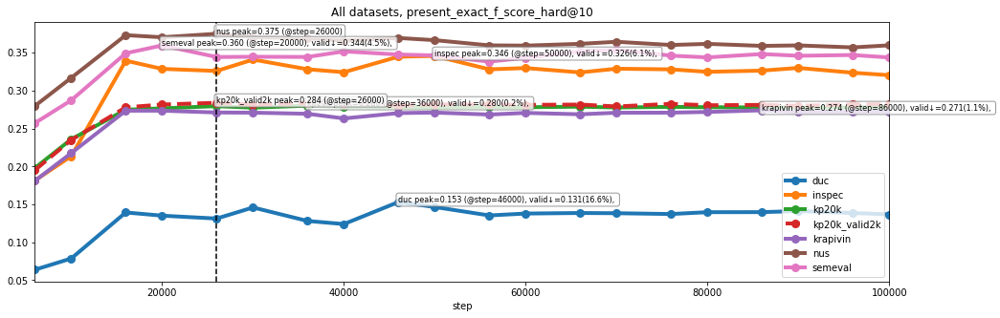

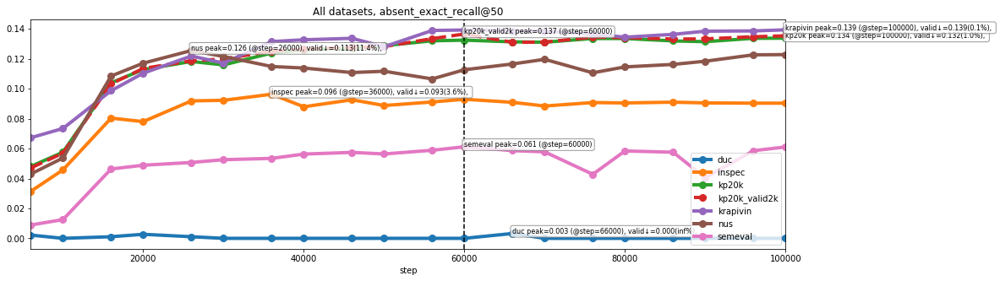

/ihome/hdaqing/rum20/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in double_scalars
/ihome/hdaqing/rum20/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: divide by zero encountered in double_scalars


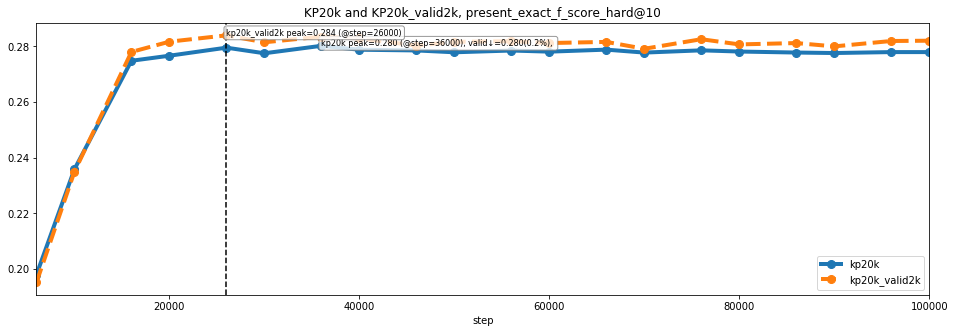

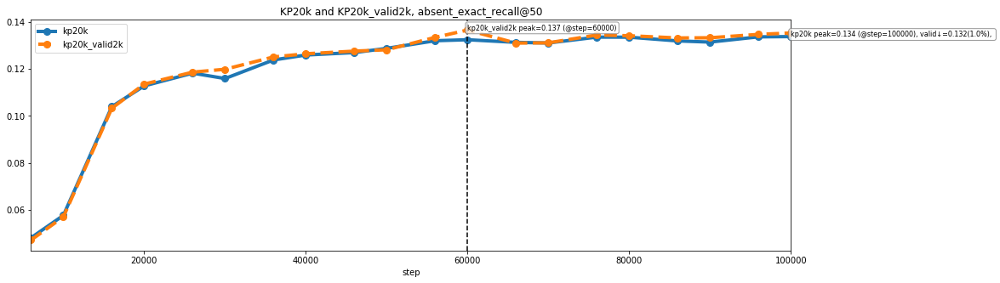

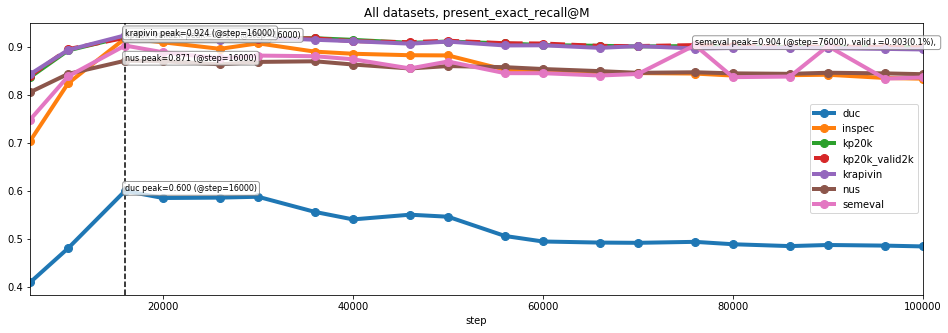

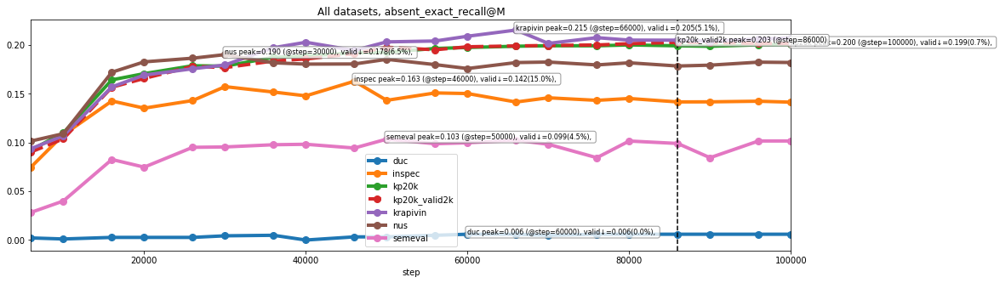

In [10]:
exp_eval_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1']
# exp_eval_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-BS128-LR0.05-L1-D150-E100-DO0.0-Copyfalse-Covfalse']

exp_eval_df = exp_eval_df.sort_values(by='step', ascending=True)
exp_eval_df = exp_eval_df.loc[exp_eval_df.beam_width == '200']
# print(exp_eval_df.step.value_counts())
# print(exp_eval_df.step.value_counts())

# exp_eval_df = exp_eval_df.loc[exp_eval_df.step % 5000 == 0] # keep % 10000
exp_eval_df = exp_eval_df.loc[(exp_eval_df.step % 10000 == 6000) | (exp_eval_df.step % 5000 == 0)] # keep % 10000 and 5000

# display(exp_eval_df)
# plot 7 datasets
plot_testing_curve(exp_eval_df, y_index='present_exact_f_score_hard@10', title='All datasets, present_exact_f_score_hard@10')
# plot_testing_curve(exp_eval_df, y_index='present_exact_precision_hard@10', title='All datasets, present_exact_precision_hard@10')
# plot_testing_curve(exp_eval_df, y_index='present_exact_recall@10', title='All datasets, present_exact_recall@10')
plot_testing_curve(exp_eval_df, y_index='absent_exact_recall@50', title='All datasets, absent_exact_recall@50')

# plot kp20k and kp20k_valid2k
kp20k_eval_df = exp_eval_df[exp_eval_df.test_dataset.str.startswith('kp20k')]
plot_testing_curve(kp20k_eval_df, y_index='present_exact_f_score_hard@10', title='KP20k and KP20k_valid2k, present_exact_f_score_hard@10')
plot_testing_curve(kp20k_eval_df, y_index='absent_exact_recall@50', title='KP20k and KP20k_valid2k, absent_exact_recall@50')

# plot recall@M
plot_testing_curve(exp_eval_df, y_index='present_exact_recall@M', title='All datasets, present_exact_recall@M')
plot_testing_curve(exp_eval_df, y_index='absent_exact_recall@M', title='All datasets, absent_exact_recall@M')
# plot_testing_curve(exp_eval_df, y_index='unique_pred_num', title='All datasets, unique_pred_num')


# plot_testing_curve(exp_eval_df, y_index='present_exact_advanced_sadr', title='All datasets, present_exact_advanced_sadr')
# plot_testing_curve(exp_eval_df, y_index='absent_exact_advanced_sadr', title='All datasets, absent_exact_advanced_sadr')
# plot_testing_curve(exp_eval_df, y_index='present_exact_advanced_auc', title='All datasets, present_exact_advanced_auc')
# plot_testing_curve(exp_eval_df, y_index='absent_exact_advanced_auc', title='All datasets, absent_exact_advanced_auc')



### Plot One2Seq (beam_width=50) hard metrics

/ihome/hdaqing/rum20/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: FutureWarning: `item` has been deprecated and will be removed in a future version


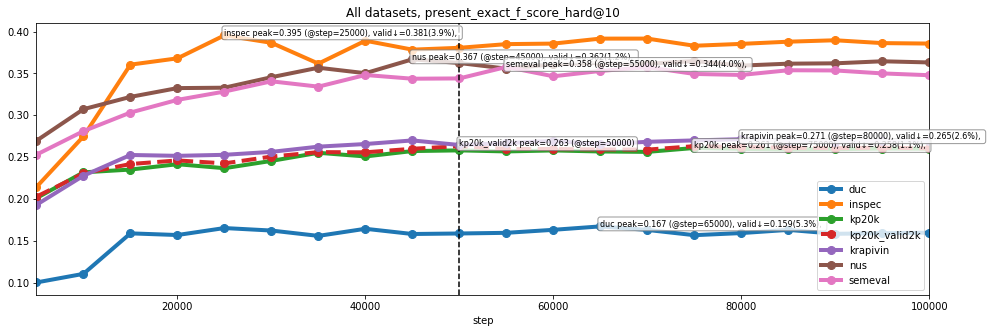

/ihome/hdaqing/rum20/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in double_scalars
/ihome/hdaqing/rum20/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:57: RuntimeWarning: divide by zero encountered in double_scalars


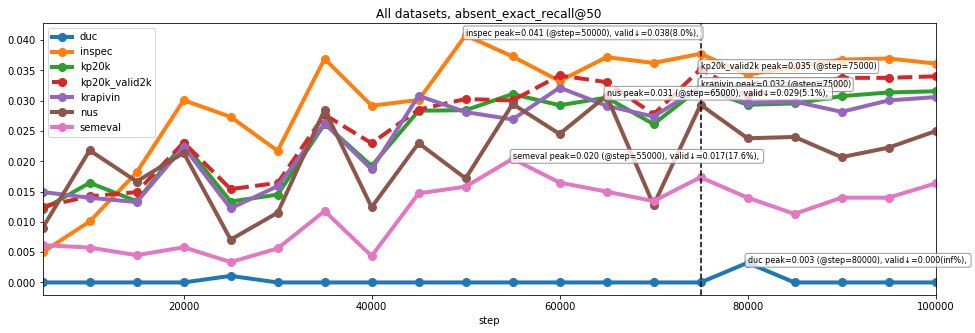

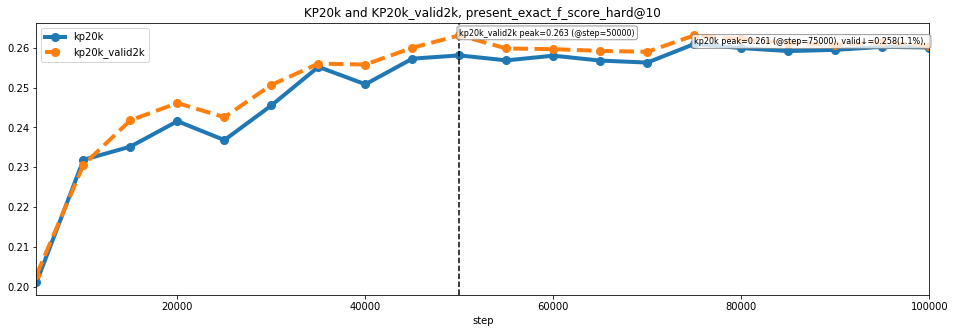

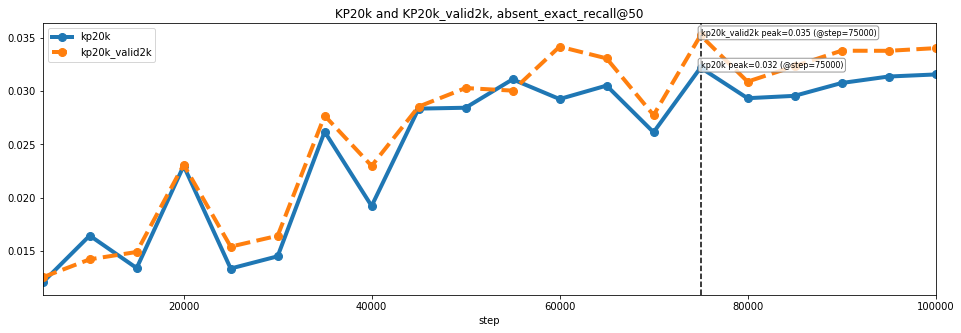

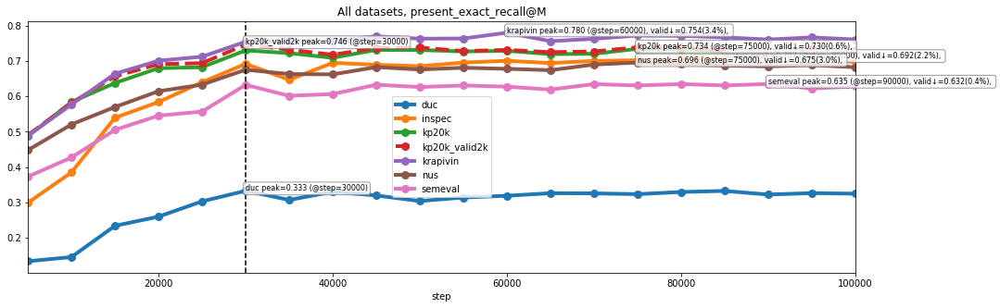

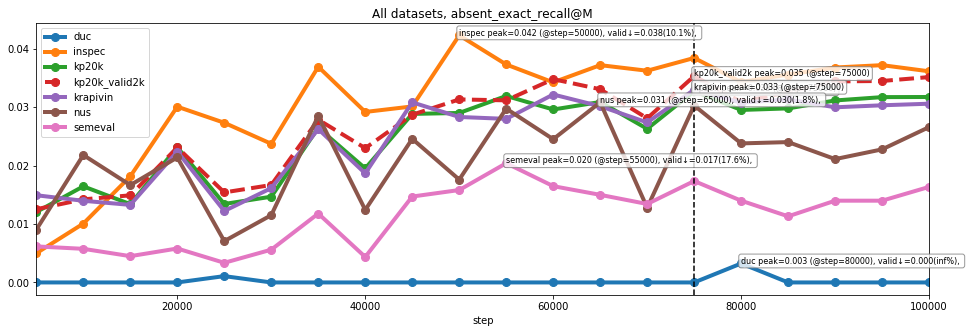

In [11]:
exp_eval_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']
# exp_eval_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copyfalse']

# print(exp_eval_df.shape)
# print(exp_eval_df.test_dataset.value_counts())
# print(exp_eval_df.step.value_counts())

exp_eval_df = exp_eval_df.sort_values(by='step', ascending=True)
exp_eval_df = exp_eval_df.loc[exp_eval_df.beam_width == '50']
exp_eval_df = exp_eval_df.loc[exp_eval_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
exp_eval_df = exp_eval_df.loc[exp_eval_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating


# print(exp_eval_df.decoding_terminate.value_counts())
# print(exp_eval_df.shape)
# display(exp_eval_df)
# print(exp_eval_df.path.unique())
# exp_eval_df = exp_eval_df.loc[exp_eval_df.step % 10000 == 0] # keep % 10000
# exp_eval_df = exp_eval_df.loc[(exp_eval_df.step % 10000 == 4000) | (exp_eval_df.step % 5000 == 0)] # keep % 10000 and 5000

# plot 7 datasets
plot_testing_curve(exp_eval_df, y_index='present_exact_f_score_hard@10', title='All datasets, present_exact_f_score_hard@10')
# plot_testing_curve(exp_eval_df, y_index='present_exact_precision_hard@10', title='All datasets, present_exact_precision_hard@10')
# plot_testing_curve(exp_eval_df, y_index='present_exact_recall@10', title='All datasets, present_exact_recall@10')
plot_testing_curve(exp_eval_df, y_index='absent_exact_recall@50', title='All datasets, absent_exact_recall@50')

# plot kp20k and kp20k_valid2k
kp20k_eval_df = exp_eval_df[exp_eval_df.test_dataset.str.startswith('kp20k')]
plot_testing_curve(kp20k_eval_df, y_index='present_exact_f_score_hard@10', title='KP20k and KP20k_valid2k, present_exact_f_score_hard@10')
plot_testing_curve(kp20k_eval_df, y_index='absent_exact_recall@50', title='KP20k and KP20k_valid2k, absent_exact_recall@50')

# plot recall@M
plot_testing_curve(exp_eval_df, y_index='present_exact_recall@M', title='All datasets, present_exact_recall@M')
plot_testing_curve(exp_eval_df, y_index='absent_exact_recall@M', title='All datasets, absent_exact_recall@M')
# plot_testing_curve(exp_eval_df, y_index='unique_pred_num', title='All datasets, unique_pred_num')



# plot_testing_curve(exp_eval_df, y_index='present_exact_advanced_sadr', title='All datasets, present_exact_advanced_sadr')
# plot_testing_curve(exp_eval_df, y_index='absent_exact_advanced_sadr', title='All datasets, absent_exact_advanced_sadr')
# plot_testing_curve(exp_eval_df, y_index='present_exact_advanced_auc', title='All datasets, present_exact_advanced_auc')
# plot_testing_curve(exp_eval_df, y_index='absent_exact_advanced_auc', title='All datasets, absent_exact_advanced_auc')



### Plot MagKP exps

In [ ]:
'''
One2One
- V2
magkp20k-meng17-one2one-BS128-LR0.05-L1-D512-E128-DO0.1-Copytrue
magkp20k-meng17-one2one-BS128-LR0.05-L1-H-D150-E100-DO0.0-Copytrue
magkp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue

- V3

One2Seq
- V2
magkp-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue
magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue

- V3
'kpgen-meng17-MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'kpgen-meng17-MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'kpgen-meng17-MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'kpgen-meng17-magkp-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
'kpgen-meng17-kp20k+MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
'kpgen-meng17-kp20k+MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'kpgen-meng17-kp20k+MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',

- V3 + KP20k fine-tune
'kpgen-meng17-MagKP_LN+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'kpgen-meng17-MagKP_Nlarge+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'kpgen-meng17-MagKP_Nsmall+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'kpgen-meng17-magkp+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'kpgen-meng17-magkp20k+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue'
'''

#### Plot curves

(140, 121)


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:187: FutureWarning: `item` has been deprecated and will be removed in a future version


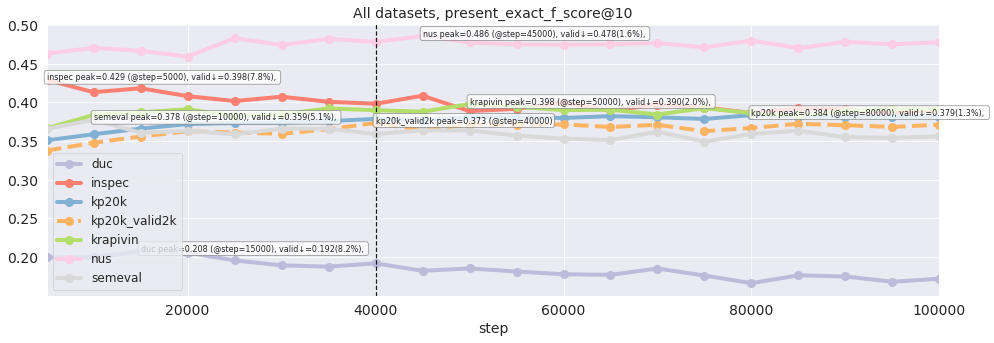

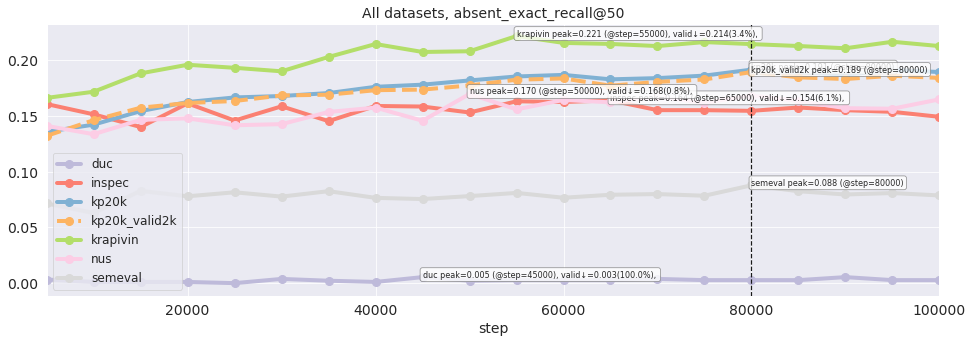

nus
0.4633748852793502
0.47788649089015295
kp20k
0.35101416081356307
0.3815645475895672
semeval
0.3658028499278499
0.3562085137085137
inspec
0.429311717298083
0.3910899485993763
krapivin
0.36650551796172
0.3910339346288834
kp20k_valid2k
0.33763650831913017
0.37125271223106043
duc
0.1995196632371957
0.17192841429854416


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:60: FutureWarning: `item` has been deprecated and will be removed in a future version
/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:61: FutureWarning: `item` has been deprecated and will be removed in a future version


In [358]:
exp_eval_df = all_eval_df.loc[all_eval_df['exp_name'] == 
# 'magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue'
# 'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue'
                              
# 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
# 'kpgen-meng17-kp20k+MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
# 'kpgen-meng17-kp20k+MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'kpgen-meng17-kp20k+MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   

# 'kpgen-meng17-MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'kpgen-meng17-MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'kpgen-meng17-MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'kpgen-meng17-magkp-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
                              
# 'kpgen-meng17-magkp+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'kpgen-meng17-MagKP_Nlarge+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'kpgen-meng17-magkp20k+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
                              
# 'magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue'
]

exp_eval_df = exp_eval_df.sort_values(by='step', ascending=True)
exp_eval_df = exp_eval_df.loc[exp_eval_df.beam_width == '50']
exp_eval_df = exp_eval_df.loc[exp_eval_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
exp_eval_df = exp_eval_df.loc[exp_eval_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating


# print(exp_eval_df.decoding_terminate.value_counts())
print(exp_eval_df.shape)
# display(exp_eval_df)
# print(exp_eval_df.path.unique())
# exp_eval_df = exp_eval_df.loc[exp_eval_df.step % 10000 == 0] # keep % 10000
# exp_eval_df = exp_eval_df.loc[(exp_eval_df.step % 10000 == 4000) | (exp_eval_df.step % 5000 == 0)] # keep % 10000 and 5000

# plot 7 datasets
plot_testing_curve(exp_eval_df, y_index='present_exact_f_score@k', title='All datasets, present_exact_f_score@10')
# plot_testing_curve(exp_eval_df, y_index='present_exact_precision_hard@10', title='All datasets, present_exact_precision_hard@10')
# plot_testing_curve(exp_eval_df, y_index='present_exact_recall@10', title='All datasets, present_exact_recall@10')
plot_testing_curve(exp_eval_df, y_index='absent_exact_recall@50', title='All datasets, absent_exact_recall@50')

# plot kp20k and kp20k_valid2k
kp20k_eval_df = exp_eval_df[exp_eval_df.test_dataset.str.startswith('kp20k')]
# plot_testing_curve(kp20k_eval_df, y_index='present_exact_f_score@10', title='KP20k and KP20k_valid2k, present_exact_f_score_hard@10')
# plot_testing_curve(kp20k_eval_df, y_index='absent_exact_recall@50', title='KP20k and KP20k_valid2k, absent_exact_recall@50')

# plot recall@M
# plot_testing_curve(exp_eval_df, y_index='present_exact_recall@M', title='All datasets, present_exact_recall@M')
# plot_testing_curve(exp_eval_df, y_index='absent_exact_recall@M', title='All datasets, absent_exact_recall@M')
# plot_testing_curve(exp_eval_df, y_index='unique_pred_num', title='All datasets, unique_pred_num')


# plot_testing_curve(exp_eval_df, y_index='present_exact_advanced_sadr', title='All datasets, present_exact_advanced_sadr')
# plot_testing_curve(exp_eval_df, y_index='absent_exact_advanced_sadr', title='All datasets, absent_exact_advanced_sadr')
# plot_testing_curve(exp_eval_df, y_index='present_exact_advanced_auc', title='All datasets, present_exact_advanced_auc')
# plot_testing_curve(exp_eval_df, y_index='absent_exact_advanced_auc', title='All datasets, absent_exact_advanced_auc')

for test_dataset in exp_eval_df.test_dataset.unique():
    test_df = exp_eval_df.loc[exp_eval_df.test_dataset == test_dataset]
    print(test_dataset)
    print(test_df.loc[exp_eval_df.step == 5000]['present_exact_f_score@k'].item())
    print(test_df.loc[exp_eval_df.step == 100000]['present_exact_f_score@k'].item())


#### Compare valid scores

All data
(2130, 121)
present valid_kp_df
(70, 121)
All data
(2130, 121)
absent valid_kp_df


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


(70, 121)


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


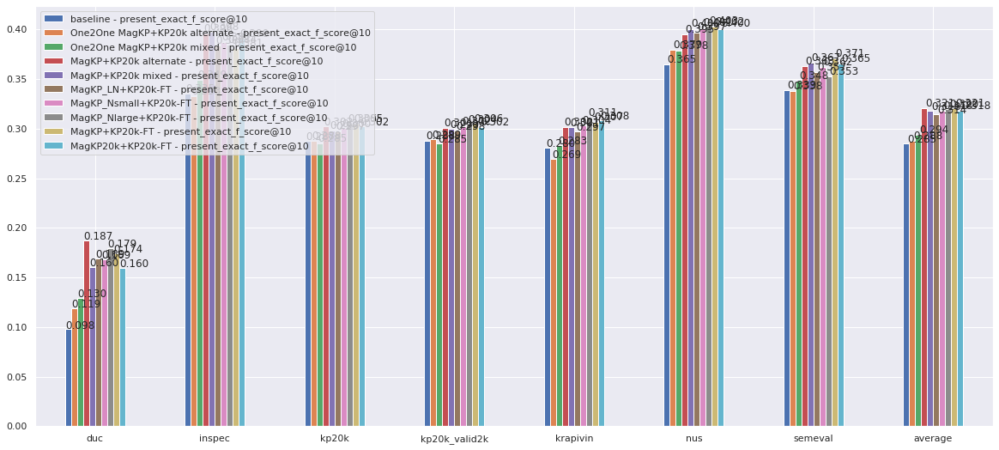

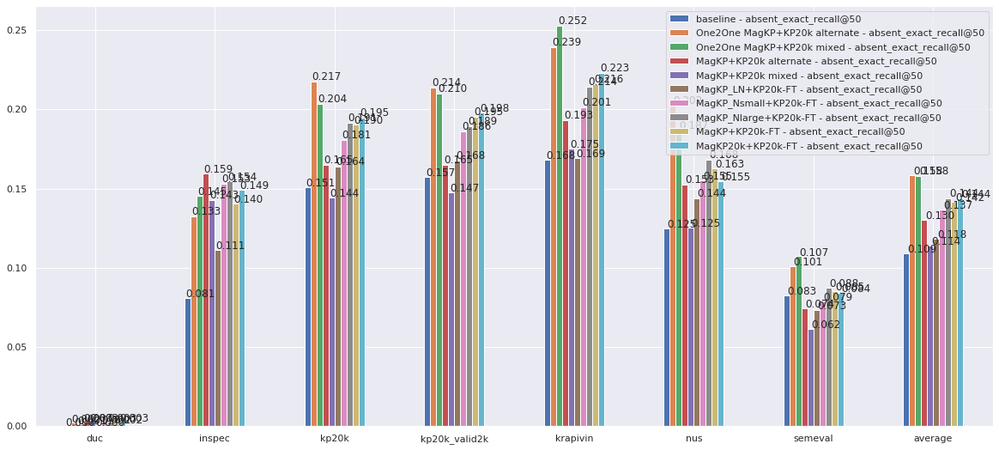

In [107]:
# 2. Compare different architecture variants
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
# pd.options.display.max_colwidth = 100


plot_avg_only = False
kp_exps = {
    'Baseline': 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
    'One2One MagKP+KP20k alternate': 'magkp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue',
    'One2One MagKP+KP20k mixed': 'kpgen-meng17-magkp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'kpgen-meng17-MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'kpgen-meng17-MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'kpgen-meng17-MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'kpgen-meng17-magkp-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

#     'MagKP_LN+KP20k mixed': 'kpgen-meng17-kp20k+MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
#     'MagKP_Nsmall+KP20k mixed': 'kpgen-meng17-kp20k+MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'MagKP_Nlage+KP20k mixed': 'kpgen-meng17-kp20k+MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   

    'MagKP+KP20k alternate': 'magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'MagKP+KP20k mixed': 'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'MagKP+KP20k mixed, no-copy': 'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',

    'MagKP_LN+KP20k-FT': 'kpgen-meng17-MagKP_LN+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'MagKP_Nsmall+KP20k-FT': 'kpgen-meng17-MagKP_Nsmall+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'MagKP_Nlarge+KP20k-FT': 'kpgen-meng17-MagKP_Nlarge+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'MagKP+KP20k-FT': 'kpgen-meng17-magkp+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'MagKP20k+KP20k-FT': 'kpgen-meng17-magkp20k+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue'
} 

long2short = {long: short for short, long in kp_exps.items()}

# prepare one2seq data
kp_df = all_eval_df.loc[all_eval_df['exp_name'].isin(long2short)]
kp_df = kp_df.sort_values(by='step', ascending=True)
kp_df = kp_df.loc[(kp_df.beam_width == '50') | (kp_df.beam_width == '200')]
kp_df = kp_df.loc[(kp_df.step % 5000 == 0) | (kp_df.step % 6000 == 0)]
kp_df = kp_df.loc[kp_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
kp_df = kp_df.loc[kp_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

print('All data')
print(kp_df.shape)

for index_label, row_series in kp_df.iterrows():
    expname = kp_df.at[index_label, 'exp_name']
    kp_df.at[index_label, 'exp_name'] = long2short[expname]

print('present valid_kp_df')
_, _, valid_kp_df = brief_eval_results(kp_df, base_metric='present_exact_f_score@10')
print(valid_kp_df.shape)
# display(valid_kp_df)


metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
metric_names = ['present_exact_advanced_sadr']
metric_names = ['present_exact_f_score@10']

datasets = valid_kp_df.test_dataset.unique()
exp_names = kp_exps.keys()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

if plot_avg_only:
    for k,v in bar_values.items():
        bar_values[k] = v[-1]
    datasets = [datasets[-1]]
        
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
    

pd.options.display.float_format = '{:,.1f}'.format
with pd.option_context('display.max_colwidth', -1, 'display.max_rows', None):
    value_cols = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
    tmp_df = valid_kp_df[['exp_name', 'model_base', 'train_dataset', 'test_dataset'] + value_cols]
    for col in value_cols:
        tmp_df[col] = tmp_df[col].map(lambda v: v * 100.0)

#     tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
#     display(tmp_df)
    df_list = []
    for exp in kp_exps:
        for i in ordered_datasets:
            df_list.append(tmp_df[(tmp_df['exp_name']==exp) & (tmp_df['test_dataset']==i)])
    ordered_df = pd.concat(df_list)
    tmp_df = ordered_df[value_cols]
    
#     display(ordered_df)
#     print(tmp_df.to_latex(index=False))
    

############## absent
print('All data')
print(kp_df.shape)
print('absent valid_kp_df')
_, _, valid_kp_df = brief_eval_results(kp_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
print(valid_kp_df.shape)
# display(valid_kp_df)

# metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50', 'absent_exact_advanced_sadr']
metric_names = ['absent_exact_recall@50']


datasets = valid_kp_df.test_dataset.unique()
exp_names = kp_exps.keys()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_kp_df.iterrows():
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

if plot_avg_only:
    for k,v in bar_values.items():
        bar_values[k] = v[-1]
    datasets = [datasets[-1]]
        
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
# display(df.transpose())

    
pd.options.display.float_format = '{:,.1f}'.format
with pd.option_context('display.max_colwidth', -1, 'display.max_rows', None):
    value_cols = ['absent_exact_recall@10', 'absent_exact_recall@50']
    tmp_df = valid_kp_df[['exp_name', 'model_base', 'train_dataset', 'test_dataset'] + value_cols]
    for col in value_cols:
        tmp_df[col] = tmp_df[col].map(lambda v: v * 100.0)

#     tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
    df_list = []
    for exp in kp_exps:
        for i in ordered_datasets:
            df_list.append(tmp_df[(tmp_df['exp_name']==exp) & (tmp_df['test_dataset']==i)])
    ordered_df = pd.concat(df_list)
    tmp_df = ordered_df[value_cols]

#     display(ordered_df)
#     print(tmp_df.to_latex(index=False))


#### Compare peak scores

All data
(2130, 121)
present peak_kp_df
(70, 121)
All data
(2130, 121)
absent peak_kp_df
(70, 121)


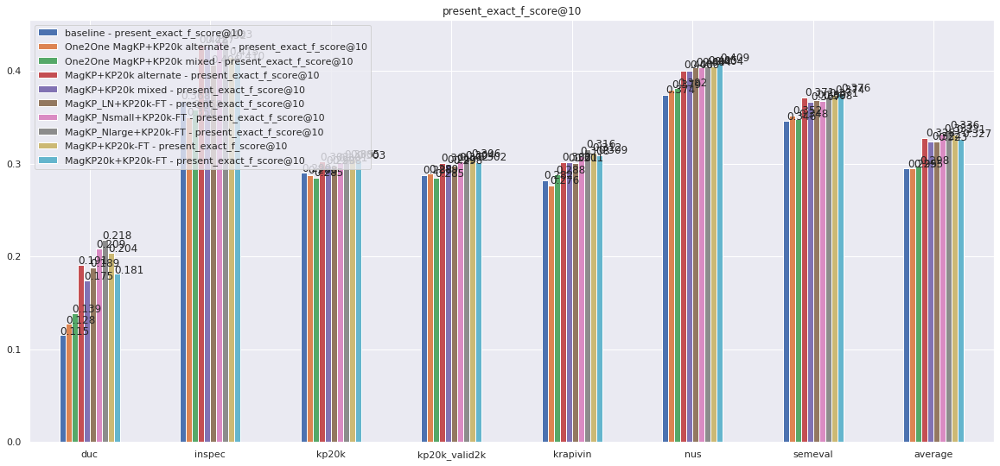

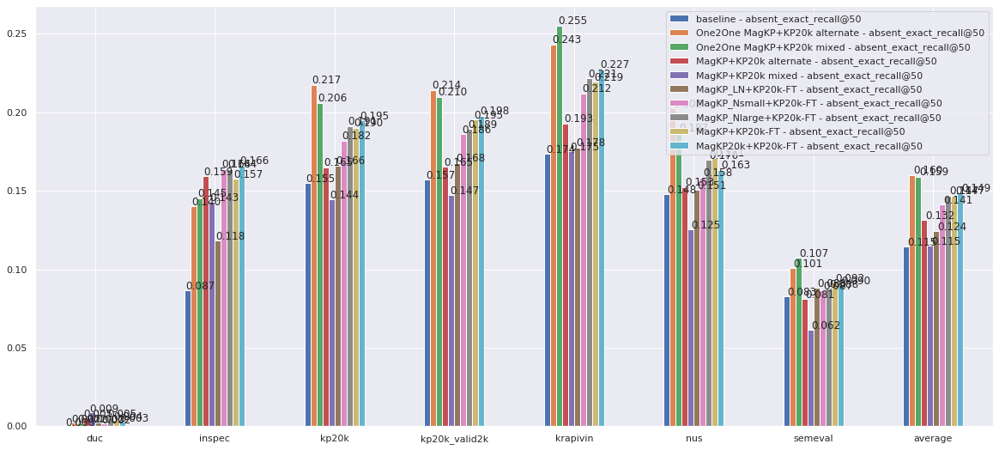

In [108]:
# 2. Compare different architecture variants
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
# pd.options.display.max_colwidth = 100

plot_avg_only = False
kp_exps = {
    'Baseline': 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
    'One2One MagKP+KP20k alternate': 'magkp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue',
    'One2One MagKP+KP20k mixed': 'kpgen-meng17-magkp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'kpgen-meng17-MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'kpgen-meng17-MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'kpgen-meng17-MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'kpgen-meng17-magkp-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

#     'MagKP_LN+KP20k mixed': 'kpgen-meng17-kp20k+MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
#     'MagKP_Nsmall+KP20k mixed': 'kpgen-meng17-kp20k+MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'MagKP_Nlage+KP20k mixed': 'kpgen-meng17-kp20k+MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   

    'MagKP+KP20k alternate': 'magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'MagKP+KP20k mixed': 'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'MagKP+KP20k mixed, no-copy': 'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',
    
    'MagKP_LN+KP20k-FT': 'kpgen-meng17-MagKP_LN+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'MagKP_Nsmall+KP20k-FT': 'kpgen-meng17-MagKP_Nsmall+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'MagKP_Nlarge+KP20k-FT': 'kpgen-meng17-MagKP_Nlarge+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'MagKP+KP20k-FT': 'kpgen-meng17-magkp+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'MagKP20k+KP20k-FT': 'kpgen-meng17-magkp20k+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue'
} 

long2short = {long: short for short, long in kp_exps.items()}

# prepare one2seq data
kp_df = all_eval_df.loc[all_eval_df['exp_name'].isin(long2short)]
kp_df = kp_df.sort_values(by='step', ascending=True)
kp_df = kp_df.loc[(kp_df.beam_width == '50') | (kp_df.beam_width == '200')]
kp_df = kp_df.loc[(kp_df.step % 5000 == 0) | (kp_df.step % 6000 == 0)]
kp_df = kp_df.loc[kp_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
kp_df = kp_df.loc[kp_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

print('All data')
print(kp_df.shape)

for index_label, row_series in kp_df.iterrows():
    expname = kp_df.at[index_label, 'exp_name']
    kp_df.at[index_label, 'exp_name'] = long2short[expname]

print('present peak_kp_df')
_, peak_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@10')
print(peak_kp_df.shape)
# display(peak_kp_df)


# metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k', 'present_exact_f_score@M']
# metric_names = ['present_exact_advanced_sadr']
metric_names = ['present_exact_f_score@10']

datasets = peak_kp_df.test_dataset.unique()
exp_names = kp_exps.keys()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}
for index_label, row_series in peak_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

if plot_avg_only:
    for k,v in bar_values.items():
        bar_values[k] = v[-1]
    datasets = [datasets[-1]]
        
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='present_exact_f_score@10')

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
    

    

############## absent
print('All data')
print(kp_df.shape)
print('absent peak_kp_df')
_, peak_kp_df, _ = brief_eval_results(kp_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
print(peak_kp_df.shape)
# display(peak_kp_df)

# metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50', 'absent_exact_advanced_sadr']
metric_names = ['absent_exact_recall@50']


datasets = peak_kp_df.test_dataset.unique()
exp_names = kp_exps.keys()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in peak_kp_df.iterrows():
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

if plot_avg_only:
    for k,v in bar_values.items():
        bar_values[k] = v[-1]
    datasets = [datasets[-1]]


df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
# display(df.transpose())


### Summary (used in paper Table 1)

#### Present  

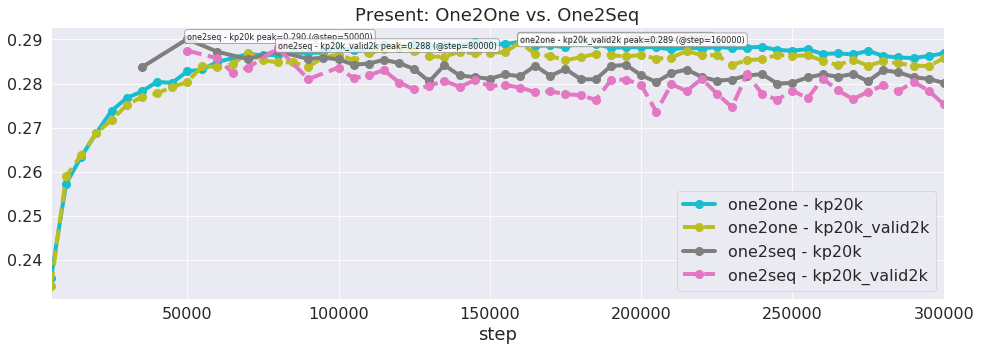

In [321]:
y_index='present_exact_f_score@10'


# prepare for one2one data
# BaseRNN-one2one
# one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1']
# Transformer-one2one
one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue']
# Transformer-one2one, MagKP20k
# one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kpgen-meng17-magkp-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue']
# BigRNN-one2one
# one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-BS128-LR0.05-L1-H8-D512-E128-DO0.1-Copytrue']

# prepare one2seq data
# BaseRNN-one2seq
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']
# Transformer-one2seq
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue']
# Transformer-one2seq, MagKP20k
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue']
# BigRNN-one2seq
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue']


one2one_df = one2one_df.sort_values(by='step', ascending=True)
one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000
one2one_df = one2one_df.loc[one2one_df.beam_width == '200']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating
kp20k_one2one_df = one2one_df[one2one_df.test_dataset.str.startswith('kp20k')]

for index_label, row_series in kp20k_one2one_df.iterrows():
     kp20k_one2one_df.at[index_label, 'test_dataset'] = 'one2one - ' + kp20k_one2one_df.at[index_label, 'test_dataset']
    

one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating
kp20k_one2seq_df = one2seq_df[one2seq_df.test_dataset.str.startswith('kp20k')]

for index_label, row_series in kp20k_one2seq_df.iterrows():
     kp20k_one2seq_df.at[index_label, 'test_dataset'] = 'one2seq - ' + kp20k_one2seq_df.at[index_label, 'test_dataset']

# combine both and plot
combined_kp20k_df = kp20k_one2one_df.append(kp20k_one2seq_df, ignore_index=True)
combined_df = one2one_df.append(one2seq_df, ignore_index=True)

plot_testing_curve(combined_kp20k_df, y_index=y_index, plot_valid_peak=False, title='Present: One2One vs. One2Seq')


#### Absent

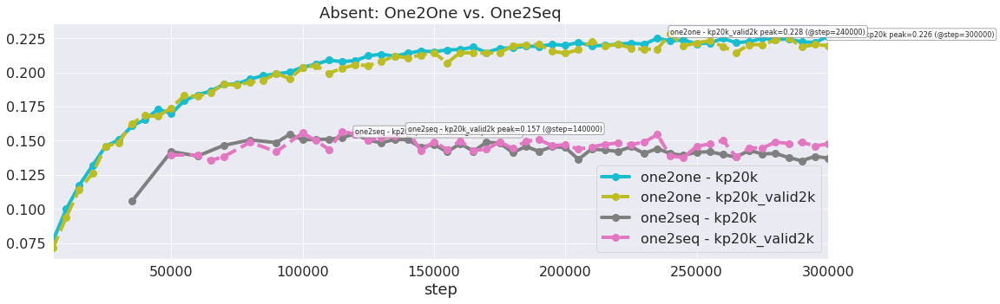

In [322]:
y_index='absent_exact_recall@50'

plot_testing_curve(combined_kp20k_df, y_index=y_index, plot_valid_peak=False, title='Absent: One2One vs. One2Seq')


#### Valid-peak

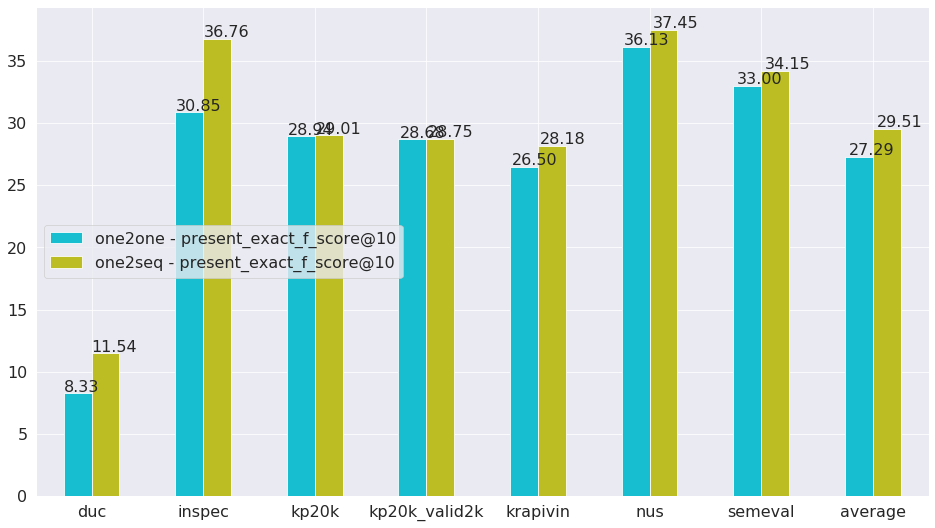

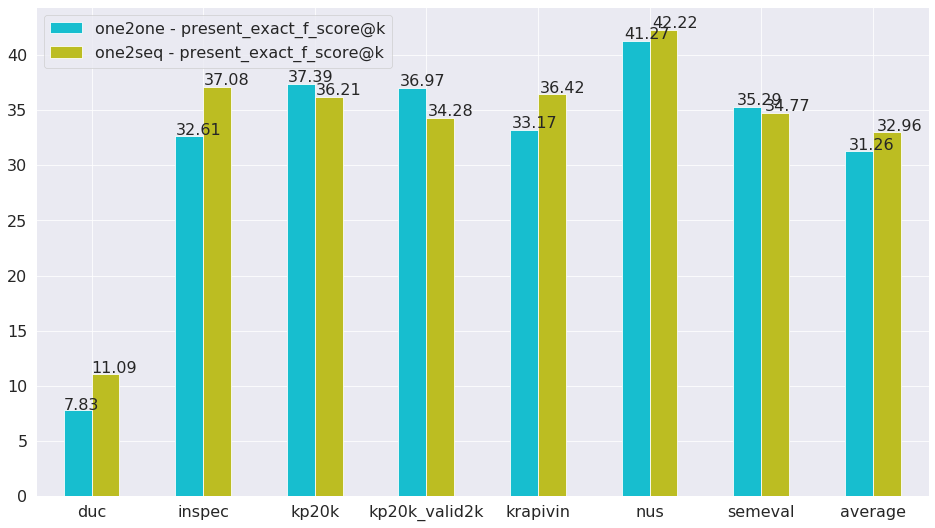

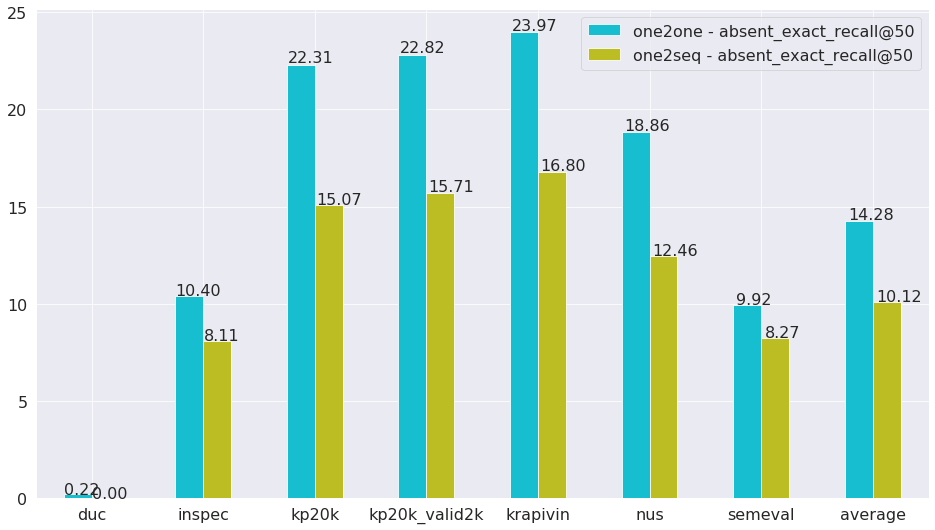

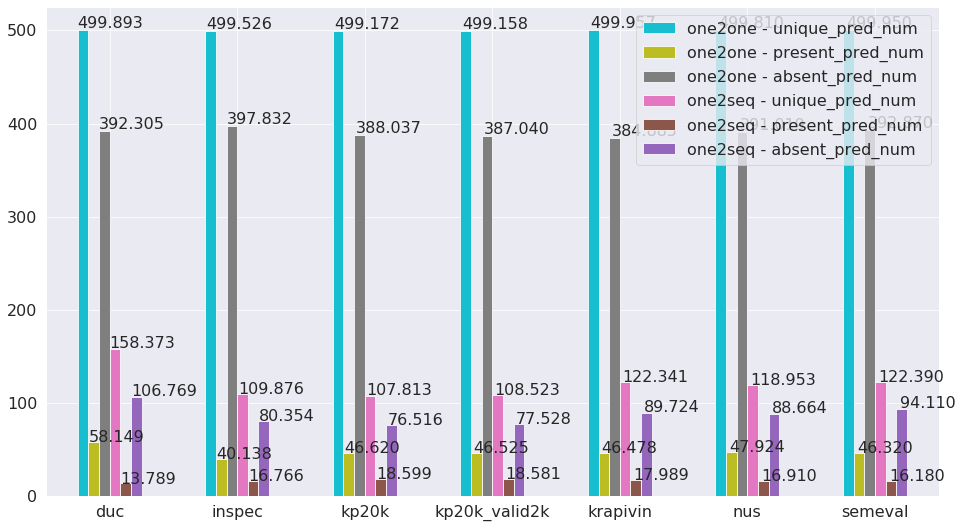

In [325]:
# Present F-score@10
# change to use F@O as anchor metric for present KPG
_, _, valid_peak_summary_df, _ = brief_eval_results(combined_df, base_metric='present_exact_f_score@k')
# metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k', 'present_exact_f_score@M']
metric_names = ['present_exact_f_score@10']

datasets = valid_peak_summary_df.test_dataset.unique()
modes = valid_peak_summary_df.train_mode.unique()
bar_values = {'%s - %s' % (mode, metric_name): [] for mode in modes for metric_name in metric_names}

for index_label, row_series in valid_peak_summary_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.train_mode, metric_name)].append(float(bar_value))

        kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets) * 100.0
ax = df.plot.bar(figsize=(16,9), rot=0)
ax.legend(loc='center left')

for p in ax.patches:
    ax.annotate('%.2f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    

    
# Present F-score@O
metric_name = 'present_exact_f_score@k'
_, _, valid_peak_summary_df, _ = brief_eval_results(combined_df, base_metric=metric_name)
metric_names = [metric_name]

datasets = valid_peak_summary_df.test_dataset.unique()
modes = valid_peak_summary_df.train_mode.unique()
bar_values = {'%s - %s' % (mode, metric_name): [] for mode in modes for metric_name in metric_names}

for index_label, row_series in valid_peak_summary_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.train_mode, metric_name)].append(float(bar_value))

        kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets) * 100.0
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.2f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    
     
    

# Absent results
metric_name = 'absent_exact_recall@50'
_, _, valid_peak_summary_df, _ = brief_eval_results(combined_df, base_metric=metric_name)
metric_names = [metric_name]

datasets = valid_peak_summary_df.test_dataset.unique()
modes = valid_peak_summary_df.train_mode.unique()
bar_values = {'%s - %s' % (mode, metric_name): [] for mode in modes for metric_name in metric_names}

for index_label, row_series in valid_peak_summary_df.iterrows():
    train_mode = row_series.train_mode
    
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (train_mode, metric_name)].append(float(bar_value))

        kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets) * 100.0
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.2f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    
    
    
    
    
    
    
# Phrase number

_, _, valid_peak_summary_df, _ = brief_eval_results(combined_df, base_metric='present_exact_f_score_hard@10')
metric_names = ['unique_pred_num', 'present_pred_num', 'absent_pred_num']

datasets = valid_peak_summary_df.test_dataset.unique()
modes = valid_peak_summary_df.train_mode.unique()
bar_values = {'%s - %s' % (mode, metric_name): [] for mode in modes for metric_name in metric_names}

# metric_name = 'present_exact_f_score_hard@10'

for index_label, row_series in valid_peak_summary_df.iterrows():
    train_mode = row_series.train_mode
    
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (train_mode, metric_name)].append(float(bar_value))

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


#### Self-peak

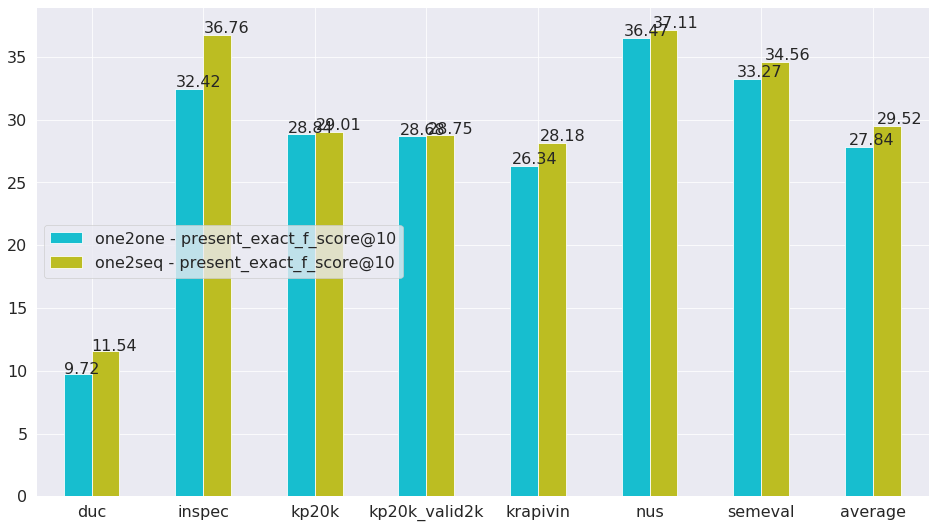

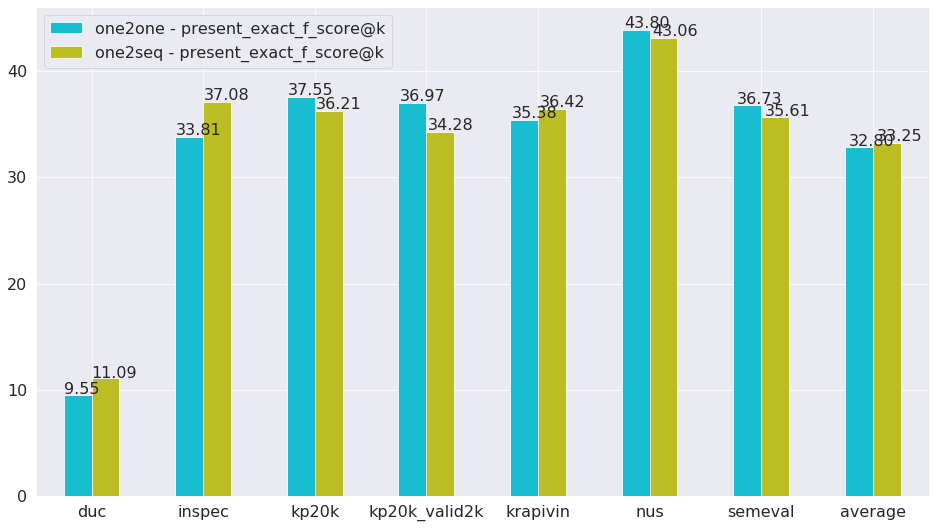

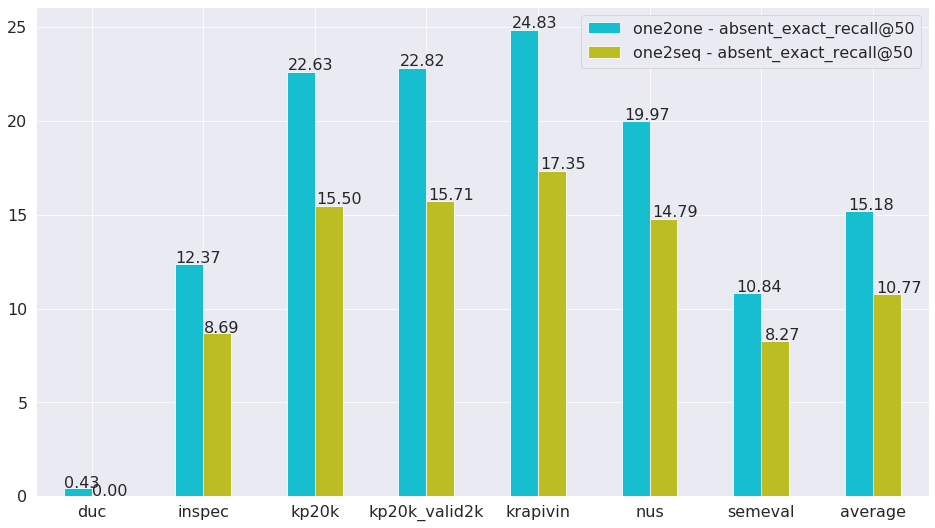

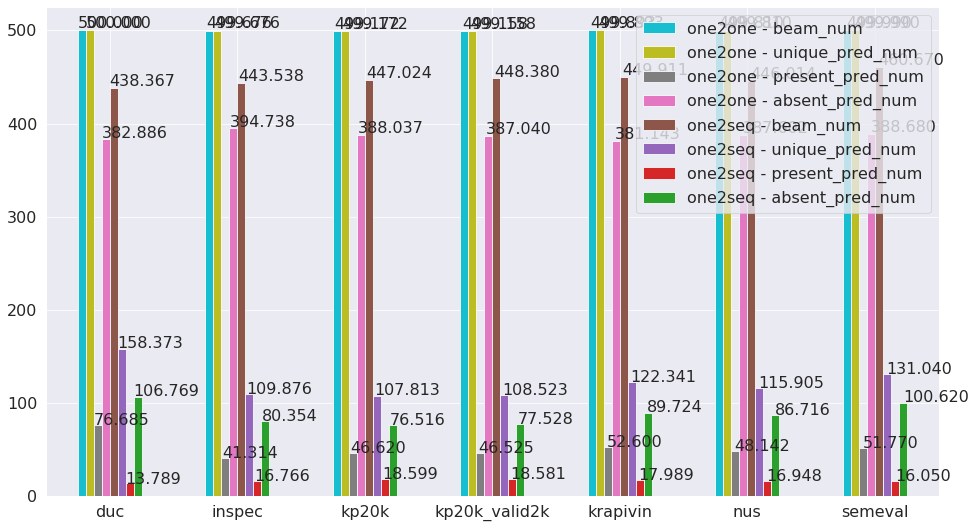

In [327]:
# Present F-score@10
# change to use F@O as anchor metric for present KPG
_, self_peak_summary_df, _, _ = brief_eval_results(combined_df, base_metric='present_exact_f_score@k')
# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_advanced_sadr', 'present_exact_advanced_auc']
metric_names = ['present_exact_f_score@10']

datasets = self_peak_summary_df.test_dataset.unique()
modes = self_peak_summary_df.train_mode.unique()
bar_values = {'%s - %s' % (mode, metric_name): [] for mode in modes for metric_name in metric_names}

for index_label, row_series in self_peak_summary_df.iterrows():
    train_mode = row_series.train_mode
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (train_mode, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets) * 100.0
ax = df.plot.bar(figsize=(16,9), rot=0)
ax.legend(loc='center left')
for p in ax.patches:
    ax.annotate('%.2f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
     
    
    
# Present F-score@O
metric_name = 'present_exact_f_score@k'
_, self_peak_summary_df, _, _ = brief_eval_results(combined_df, base_metric=metric_name)
metric_names = [metric_name]

datasets = self_peak_summary_df.test_dataset.unique()
modes = self_peak_summary_df.train_mode.unique()
bar_values = {'%s - %s' % (mode, metric_name): [] for mode in modes for metric_name in metric_names}

for index_label, row_series in self_peak_summary_df.iterrows():
    train_mode = row_series.train_mode
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (train_mode, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets) * 100.0
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.2f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
     
    
    
    
# absent   
metric_name = 'absent_exact_recall@50'
_, self_peak_summary_df, _, _ = brief_eval_results(combined_df, base_metric=metric_name)
metric_names = [metric_name]

datasets = self_peak_summary_df.test_dataset.unique()
modes = self_peak_summary_df.train_mode.unique()
bar_values = {'%s - %s' % (mode, metric_name): [] for mode in modes for metric_name in metric_names}

# metric_name = 'present_exact_f_score_hard@10'

for index_label, row_series in self_peak_summary_df.iterrows():
    train_mode = row_series.train_mode
    
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (train_mode, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
    
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets) * 100.0
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.2f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    

      
# number of phrases   
_, self_peak_summary_df, valid_peak_summary_df, _ = brief_eval_results(combined_df, base_metric='present_exact_f_score_hard@10')
metric_names = ['beam_num', 'unique_pred_num', 'present_pred_num', 'absent_pred_num']

datasets = self_peak_summary_df.test_dataset.unique()
modes = self_peak_summary_df.train_mode.unique()
bar_values = {'%s - %s' % (mode, metric_name): [] for mode in modes for metric_name in metric_names}

# metric_name = 'present_exact_f_score_hard@10'

for index_label, row_series in self_peak_summary_df.iterrows():
    train_mode = row_series.train_mode
    
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (train_mode, metric_name)].append(float(bar_value))

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    

### Compute Statistic Significance between One2One and One2Seq

duc
T-test on testset duc:
308
DescribeResult(nobs=308, minmax=(0.0, 0.5714285714285715), mean=0.1367563608170575, variance=0.014993705810133684, skewness=0.7445382035367543, kurtosis=0.05828938637050385)

308
DescribeResult(nobs=308, minmax=(0.0, 0.625), mean=0.15902501063018462, variance=0.015268666695762056, skewness=0.5943168508580654, kurtosis=0.07485535073359628)
Ttest_relResult(statistic=-3.3529164665694124, pvalue=0.0008997911753705149)
inspec
T-test on testset inspec:
500
DescribeResult(nobs=500, minmax=(0.0, 0.7499999999999999), mean=0.3203698818737471, variance=0.027663875105232976, skewness=0.20025285080462765, kurtosis=-0.38264981429972256)

500
DescribeResult(nobs=500, minmax=(0.0, 0.8571428571428571), mean=0.381651447837591, variance=0.02742971895343227, skewness=0.16078165532565022, kurtosis=-0.25092602622627114)
Ttest_relResult(statistic=-9.957505049922169, pvalue=1.9965851328919563e-21)
kp20k
T-test on testset kp20k:
19987
DescribeResult(nobs=19987, minmax=(0.0, 0.823

,path,exp_group,exp_name,test_name,tokenization,train_mode,model_base,order,train_dataset,step,test_dataset,decoding_method,decoding_terminate,beam_width,max_length,present_tgt_num,absent_tgt_num,present_pred_num,absent_pred_num,unique_pred_num,dup_pred_num,beam_num,beamstep_num,present_exact_correct@5,present_exact_precision@5,present_exact_recall@5,present_exact_f_score@5,present_exact_precision_hard@5,present_exact_f_score_hard@5,present_exact_correct@10,present_exact_precision@10,present_exact_recall@10,present_exact_f_score@10,present_exact_precision_hard@10,present_exact_f_score_hard@10,present_exact_correct@k,present_exact_precision@k,present_exact_recall@k,present_exact_f_score@k,present_exact_precision_hard@k,present_exact_f_score_hard@k,present_exact_correct@M,present_exact_precision@M,present_exact_recall@M,present_exact_f_score@M,present_exact_precision_hard@M,present_exact_f_score_hard@M,absent_exact_correct@10,absent_exact_precision@10,absent_exact_recall@10,absent_exact_f_score@10,absent_exact_precision_hard@10,absent_exact_f_score_hard@10,absent_exact_correct@50,absent_exact_precision@50,absent_exact_recall@50,absent_exact_f_score@50,absent_exact_precision_hard@50,absent_exact_f_score_hard@50,absent_exact_correct@M,absent_exact_precision@M,absent_exact_recall@M,absent_exact_f_score@M,absent_exact_precision_hard@M,absent_exact_f_score_hard@M,present_partial_correct@5,present_partial_precision@5,present_partial_recall@5,present_partial_f_score@5,present_partial_precision_hard@5,present_partial_f_score_hard@5,present_partial_correct@10,present_partial_precision@10,present_partial_recall@10,present_partial_f_score@10,present_partial_precision_hard@10,present_partial_f_score_hard@10,present_partial_correct@k,present_partial_precision@k,present_partial_recall@k,present_partial_f_score@k,present_partial_precision_hard@k,present_partial_f_score_hard@k,present_partial_correct@M,present_partial_precision@M,present_partial_recall@M,present_partial_f_score@M,present_partial_precision_hard@M,present_partial_f_score_hard@M,absent_partial_correct@10,absent_partial_precision@10,absent_partial_recall@10,absent_partial_f_score@10,absent_partial_precision_hard@10,absent_partial_f_score_hard@10,absent_partial_correct@50,absent_partial_precision@50,absent_partial_recall@50,absent_partial_f_score@50,absent_partial_precision_hard@50,absent_partial_f_score_hard@50,absent_partial_correct@M,absent_partial_precision@M,absent_partial_recall@M,absent_partial_f_score@M,absent_partial_precision_hard@M,absent_partial_f_score_hard@M,present_exact_advanced_auc,present_exact_advanced_ap,present_exact_advanced_mrr,present_exact_advanced_sadr,present_exact_advanced_ndcg,present_exact_advanced_alpha_ndcg@5,present_exact_advanced_alpha_ndcg@10,absent_exact_advanced_auc,absent_exact_advanced_ap,absent_exact_advanced_mrr,absent_exact_advanced_sadr,absent_exact_advanced_ndcg,absent_exact_advanced_alpha_ndcg@5,absent_exact_advanced_alpha_ndcg@10
8,/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...,meng17-one2one-kp20k,kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-D...,step_100000-duc-exhaustive,meng17,one2one,rnn,one2one,kp20k,100000,duc,exhaustive,fullbeam,200,6,7.860390,0.204545,69.805195,331.642857,0.000000,0.000000,0.000000,0.000000,0.727273,0.145455,0.100601,0.115919,0.145455,0.115919,1.207792,0.120779,0.166011,0.136756,0.120779,0.136756,1.025974,0.132831,0.132831,0.132831,0.132831,0.132831,3.691558,0.055446,0.484908,0.098701,0.055446,0.098701,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.009740,0.000031,0.005952,0.000062,0.000031,0.000062,0.834416,0.240233,0.163032,0.189772,0.240233,0.189772,1.506494,0.193492,0.259036,0.217046,0.193492,0.217046,1.295455,0.217284,0.217284,0.217284,0.217284,0.217284,4.337662,0.071434,0.621703,0.127106,0.071434,0.127106,0.000000,0.001838,0.011788,0.003088,0.001838,0.003088,0.000000,0.000554,0.017822,0.001066,0.000554,0.001066,0.012987,0.000124,0.025324,0.0

' \n'

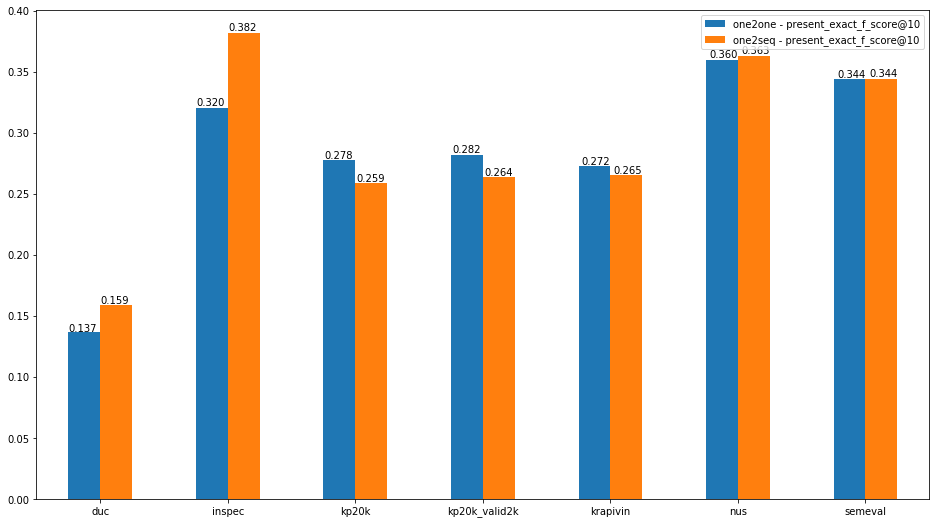

In [9]:
from scipy import stats
y_index='present_exact_f_score@10'
sample_freq = 50000

# prepare for one2one data
one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1']
# one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-BS128-LR0.05-L1-H8-D512-E128-DO0.1-Copytrue']
# one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue']
# one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'magkp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue']
one2one_df = one2one_df.sort_values(by='step', ascending=True)
if sample_freq == 5000:
    one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000
else:
    one2one_df = one2one_df.loc[(one2one_df.step % sample_freq == 0)] # keep % 10k, 20k, 50k

one2one_df = one2one_df.loc[one2one_df.beam_width == '200']
kp20k_one2one_df = one2one_df[one2one_df.test_dataset.str.startswith('kp20k')]

for index_label, row_series in kp20k_one2one_df.iterrows():
     kp20k_one2one_df.at[index_label, 'test_dataset'] = 'one2one - ' + kp20k_one2one_df.at[index_label, 'test_dataset']
    
# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue']
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue']
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue']

one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
if sample_freq == 5000:
    one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
else:
    one2seq_df = one2seq_df.loc[(one2seq_df.step % sample_freq == 0)] # keep % 10k, 20k, 50k

one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating
kp20k_one2seq_df = one2seq_df[one2seq_df.test_dataset.str.startswith('kp20k')]

for index_label, row_series in kp20k_one2seq_df.iterrows():
     kp20k_one2seq_df.at[index_label, 'test_dataset'] = 'one2seq - ' + kp20k_one2seq_df.at[index_label, 'test_dataset']

# combine both and plot
combined_kp20k_df = kp20k_one2one_df.append(kp20k_one2seq_df, ignore_index=True)
combined_df = one2one_df.append(one2seq_df, ignore_index=True)

# obtain the test scores by best valid performance
str_summary_df, self_peak_summary_df, valid_peak_summary_df = brief_eval_results(combined_df, base_metric='present_exact_f_score@10')

one2one_outofdistribution, one2seq_outofdistribution = [], []
for test_dataset, exp_group in valid_peak_summary_df.groupby('test_dataset'):
    print(test_dataset)
    one2one_row = exp_group.loc[exp_group['train_mode'] == 'one2one']
    one2seq_row = exp_group.loc[exp_group['train_mode'] == 'one2seq']
    
    with open(one2one_row['path'].values[0], 'r') as one2one_eval_file:
        one2one_eval = json.load(one2one_eval_file)
    with open(one2seq_row['path'].values[0], 'r') as one2seq_eval_file:
        one2seq_eval = json.load(one2seq_eval_file)
        
    # run T-test for individual testset
    print('T-test on testset %s:' % test_dataset)
    print(len(one2one_eval['present_exact_f_score@10']))
    print(stats.describe(one2one_eval['present_exact_f_score@10']))
    
    print('')
    print(len(one2seq_eval['present_exact_f_score@10']))
    print(stats.describe(one2seq_eval['present_exact_f_score@10']))
    ttest = stats.ttest_rel(one2one_eval['present_exact_f_score@10'], one2seq_eval['present_exact_f_score@10'])
    print(ttest)
    print('=' * 50)
    
    if not test_dataset.startswith('kp20k'):
        one2one_outofdistribution.extend(one2one_eval['present_exact_f_score@10'])
        one2seq_outofdistribution.extend(one2seq_eval['present_exact_f_score@10'])

# run T-test on five testsets
print('Stats of One2One, freq=%d' % sample_freq)
print(len(one2one_outofdistribution))
print(stats.describe(one2one_outofdistribution))
print('')
print('Stats of One2Seq, freq=%d' % sample_freq)
print(len(one2seq_outofdistribution))
print(stats.describe(one2seq_outofdistribution))
print('T-test on five testsets:')
ttest = stats.ttest_rel(one2one_outofdistribution, one2seq_outofdistribution)
print(ttest)



display(valid_peak_summary_df)

# Present results
metric_names = ['present_exact_f_score@10']

datasets = valid_peak_summary_df.test_dataset.unique()
modes = valid_peak_summary_df.train_mode.unique()
bar_values = {'%s - %s' % (mode, metric_name): [] for mode in modes for metric_name in metric_names}

for index_label, row_series in valid_peak_summary_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.train_mode, metric_name)].append(float(bar_value))

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
''' 
'''
    

### Compute Gap Significance for One2One models (gap=Score_max_among_all_samples-Score_min_among_all_samples)

duc
T-test on testset duc:
308
DescribeResult(nobs=308, minmax=(0.0, 0.5714285714285715), mean=0.1240018880821837, variance=0.014013153757859649, skewness=0.8280140209754177, kurtosis=0.18949299840948264)

308
DescribeResult(nobs=308, minmax=(0.0, 0.5714285714285715), mean=0.1367563608170575, variance=0.014993705810133684, skewness=0.7445382035367543, kurtosis=0.05828938637050385)
Ttest_relResult(statistic=-3.001338004385848, pvalue=0.0029085132408209614)
inspec
T-test on testset inspec:
500
DescribeResult(nobs=500, minmax=(0.0, 0.8421052631578948), mean=0.32429694315801766, variance=0.026105377185854553, skewness=0.25360223613675537, kurtosis=-0.25263831936896075)

500
DescribeResult(nobs=500, minmax=(0.0, 0.7499999999999999), mean=0.3203698818737471, variance=0.027663875105232976, skewness=0.20025285080462765, kurtosis=-0.38264981429972256)
Ttest_relResult(statistic=1.001874320808005, pvalue=0.3168898719133819)
kp20k
T-test on testset kp20k:
19987
DescribeResult(nobs=19987, minmax=(0

,path,exp_group,exp_name,test_name,tokenization,train_mode,model_base,order,train_dataset,step,test_dataset,decoding_method,decoding_terminate,beam_width,max_length,present_tgt_num,absent_tgt_num,present_pred_num,absent_pred_num,unique_pred_num,dup_pred_num,beam_num,beamstep_num,present_exact_correct@5,present_exact_precision@5,present_exact_recall@5,present_exact_f_score@5,present_exact_precision_hard@5,present_exact_f_score_hard@5,present_exact_correct@10,present_exact_precision@10,present_exact_recall@10,present_exact_f_score@10,present_exact_precision_hard@10,present_exact_f_score_hard@10,present_exact_correct@k,present_exact_precision@k,present_exact_recall@k,present_exact_f_score@k,present_exact_precision_hard@k,present_exact_f_score_hard@k,present_exact_correct@M,present_exact_precision@M,present_exact_recall@M,present_exact_f_score@M,present_exact_precision_hard@M,present_exact_f_score_hard@M,absent_exact_correct@10,absent_exact_precision@10,absent_exact_recall@10,absent_exact_f_score@10,absent_exact_precision_hard@10,absent_exact_f_score_hard@10,absent_exact_correct@50,absent_exact_precision@50,absent_exact_recall@50,absent_exact_f_score@50,absent_exact_precision_hard@50,absent_exact_f_score_hard@50,absent_exact_correct@M,absent_exact_precision@M,absent_exact_recall@M,absent_exact_f_score@M,absent_exact_precision_hard@M,absent_exact_f_score_hard@M,present_partial_correct@5,present_partial_precision@5,present_partial_recall@5,present_partial_f_score@5,present_partial_precision_hard@5,present_partial_f_score_hard@5,present_partial_correct@10,present_partial_precision@10,present_partial_recall@10,present_partial_f_score@10,present_partial_precision_hard@10,present_partial_f_score_hard@10,present_partial_correct@k,present_partial_precision@k,present_partial_recall@k,present_partial_f_score@k,present_partial_precision_hard@k,present_partial_f_score_hard@k,present_partial_correct@M,present_partial_precision@M,present_partial_recall@M,present_partial_f_score@M,present_partial_precision_hard@M,present_partial_f_score_hard@M,absent_partial_correct@10,absent_partial_precision@10,absent_partial_recall@10,absent_partial_f_score@10,absent_partial_precision_hard@10,absent_partial_f_score_hard@10,absent_partial_correct@50,absent_partial_precision@50,absent_partial_recall@50,absent_partial_f_score@50,absent_partial_precision_hard@50,absent_partial_f_score_hard@50,absent_partial_correct@M,absent_partial_precision@M,absent_partial_recall@M,absent_partial_f_score@M,absent_partial_precision_hard@M,absent_partial_f_score_hard@M,present_exact_advanced_auc,present_exact_advanced_ap,present_exact_advanced_mrr,present_exact_advanced_sadr,present_exact_advanced_ndcg,present_exact_advanced_alpha_ndcg@5,present_exact_advanced_alpha_ndcg@10,absent_exact_advanced_auc,absent_exact_advanced_ap,absent_exact_advanced_mrr,absent_exact_advanced_sadr,absent_exact_advanced_ndcg,absent_exact_advanced_alpha_ndcg@5,absent_exact_advanced_alpha_ndcg@10
26,/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...,meng17-one2one-kp20k,kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-D...,step_40000-duc-exhaustive,meng17,one2one,rnn,one2one,kp20k,40000,duc,exhaustive,fullbeam,200,6,7.860390,0.204545,85.720779,299.870130,0.000000,0.000000,0.000000,0.000000,0.694805,0.138961,0.098413,0.111953,0.138961,0.111953,1.090909,0.109091,0.151873,0.124002,0.109091,0.124002,0.915584,0.119022,0.119022,0.119022,0.119022,0.119022,4.126623,0.049967,0.541126,0.090996,0.049967,0.090996,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.795455,0.236934,0.162384,0.188140,0.236934,0.188140,1.428571,0.185839,0.250347,0.208878,0.185839,0.208878,1.198052,0.206885,0.206885,0.206885,0.206885,0.206885,4.727273,0.062171,0.669677,0.113168,0.062171,0.113168,0.000000,0.001653,0.010749,0.002766,0.001653,0.002766,0.003247,0.000558,0.017396,0.001073,0.000558,0.001073,0.003247,0.000115,0.021213,0.00

'\n'

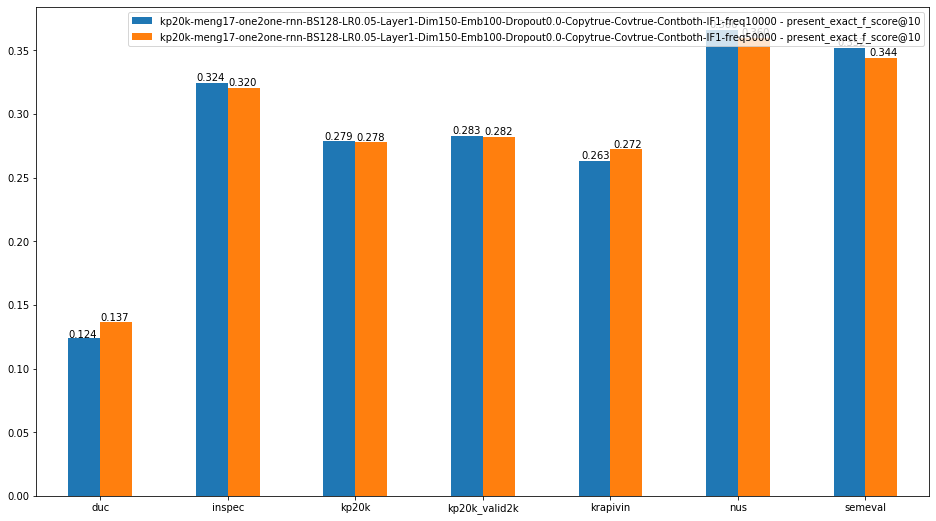

In [12]:
from scipy import stats
y_index='present_exact_f_score@10'
sample_freq_1 = 10000
sample_freq_2 = 50000

# prepare for one2one data
one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1']
# one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-BS128-LR0.05-L1-H8-D512-E128-DO0.1-Copytrue']
# one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue']
# one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'magkp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue']
one2one_df = one2one_df.sort_values(by='step', ascending=True)
if sample_freq_1 == 5000:
    one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep %5000
else:
    one2one_df = one2one_df.loc[(one2one_df.step % sample_freq_1 == 0)] # keep %10k, 20k, 50k
one2one_df_1 = one2one_df.loc[one2one_df.beam_width == '200']
for index_label, row_series in one2one_df_1.iterrows():
     one2one_df_1.at[index_label, 'exp_name'] = one2one_df_1.at[index_label, 'exp_name'] + '-freq%d' % sample_freq_1
    

one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1']
one2one_df = one2one_df.sort_values(by='step', ascending=True)
if sample_freq_2 == 5000:
    one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep %5000
else:
    one2one_df = one2one_df.loc[(one2one_df.step % sample_freq_2 == 0)] # keep %10k, 20k, 50k

one2one_df_2 = one2one_df.loc[one2one_df.beam_width == '200']
for index_label, row_series in one2one_df_2.iterrows():
     one2one_df_2.at[index_label, 'exp_name'] = one2one_df_2.at[index_label, 'exp_name'] + '-freq%d' % sample_freq_2
        
# combine both and plot
combined_df = one2one_df_1.append(one2one_df_2, ignore_index=True)


# obtain the test scores by best valid performance
str_summary_df, self_peak_summary_df, valid_peak_summary_df = brief_eval_results(combined_df, base_metric='present_exact_f_score@10')
# display(valid_peak_summary_df)


one2one_freq1, one2one_freq2 = [], []
for test_dataset, exp_group in valid_peak_summary_df.groupby('test_dataset'):
    print(test_dataset)
    freq1_row = exp_group.loc[exp_group['exp_name'].str.endswith('freq%d' % sample_freq_1)]
    freq2_row = exp_group.loc[exp_group['exp_name'].str.endswith('freq%d' % sample_freq_2)]
    
    with open(freq1_row['path'].values[0], 'r') as one2one_freq1_eval_file:
        one2one_freq1_eval = json.load(one2one_freq1_eval_file)
    with open(freq2_row['path'].values[0], 'r') as one2one_freq2_eval_file:
        one2one_freq2_eval = json.load(one2one_freq2_eval_file)
        
    # run T-test for individual testset
    print('T-test on testset %s:' % test_dataset)
    print(len(one2one_freq1_eval['present_exact_f_score@10']))
    print(stats.describe(one2one_freq1_eval['present_exact_f_score@10']))
    
    print('')
    print(len(one2one_freq2_eval['present_exact_f_score@10']))
    print(stats.describe(one2one_freq2_eval['present_exact_f_score@10']))
    ttest = stats.ttest_rel(one2one_freq1_eval['present_exact_f_score@10'], one2one_freq2_eval['present_exact_f_score@10'])
    print(ttest)
    print('=' * 50)
    
    if not test_dataset.startswith('kp20k'):
        one2one_freq1.extend(one2one_freq1_eval['present_exact_f_score@10'])
        one2one_freq2.extend(one2one_freq2_eval['present_exact_f_score@10'])

# run T-test on five testsets
print('Stats of One2One-freq%d' % sample_freq_1)
print(len(one2one_freq1))
print(stats.describe(one2one_freq1))
print('')
print('Stats of One2One-freq%d' % sample_freq_2)
print(len(one2one_freq2))
print(stats.describe(one2one_freq2))
print('T-test on five testsets:')
ttest = stats.ttest_rel(one2one_freq1, one2one_freq2)
print(ttest)


display(valid_peak_summary_df)

# Present results
metric_names = ['present_exact_f_score@10']

datasets = valid_peak_summary_df.test_dataset.unique()
groups = valid_peak_summary_df.exp_name.unique()
bar_values = {'%s - %s' % (group, metric_name): [] for group in groups for metric_name in metric_names}

for index_label, row_series in valid_peak_summary_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   

'''
''' 
    

### Compute Gap Significance for One2Seq models (gap=Score_max_among_all_samples-Score_min_among_all_samples)

duc
T-test on testset duc:
308
DescribeResult(nobs=308, minmax=(0.0, 0.625), mean=0.15684752915477584, variance=0.014647897712379286, skewness=0.7126967947493295, kurtosis=0.4842528943604565)

308
DescribeResult(nobs=308, minmax=(0.0, 0.625), mean=0.15902501063018462, variance=0.015268666695762056, skewness=0.5943168508580654, kurtosis=0.07485535073359628)
Ttest_relResult(statistic=-0.5316171278181215, pvalue=0.5953756515793138)
inspec
T-test on testset inspec:
500
DescribeResult(nobs=500, minmax=(0.0, 0.8421052631578948), mean=0.38417682744394344, variance=0.027810654015699533, skewness=-0.06570811676582702, kurtosis=-0.19534418235489914)

500
DescribeResult(nobs=500, minmax=(0.0, 0.8571428571428571), mean=0.381651447837591, variance=0.02742971895343227, skewness=0.16078165532565022, kurtosis=-0.25092602622627114)
Ttest_relResult(statistic=0.7251653967286315, pvalue=0.4686904855894354)
kp20k
T-test on testset kp20k:
19987
DescribeResult(nobs=19987, minmax=(0.0, 1.0), mean=0.2615817258

,path,exp_group,exp_name,test_name,tokenization,train_mode,model_base,order,train_dataset,step,test_dataset,decoding_method,decoding_terminate,beam_width,max_length,present_tgt_num,absent_tgt_num,present_pred_num,absent_pred_num,unique_pred_num,dup_pred_num,beam_num,beamstep_num,present_exact_correct@5,present_exact_precision@5,present_exact_recall@5,present_exact_f_score@5,present_exact_precision_hard@5,present_exact_f_score_hard@5,present_exact_correct@10,present_exact_precision@10,present_exact_recall@10,present_exact_f_score@10,present_exact_precision_hard@10,present_exact_f_score_hard@10,present_exact_correct@k,present_exact_precision@k,present_exact_recall@k,present_exact_f_score@k,present_exact_precision_hard@k,present_exact_f_score_hard@k,present_exact_correct@M,present_exact_precision@M,present_exact_recall@M,present_exact_f_score@M,present_exact_precision_hard@M,present_exact_f_score_hard@M,absent_exact_correct@10,absent_exact_precision@10,absent_exact_recall@10,absent_exact_f_score@10,absent_exact_precision_hard@10,absent_exact_f_score_hard@10,absent_exact_correct@50,absent_exact_precision@50,absent_exact_recall@50,absent_exact_f_score@50,absent_exact_precision_hard@50,absent_exact_f_score_hard@50,absent_exact_correct@M,absent_exact_precision@M,absent_exact_recall@M,absent_exact_f_score@M,absent_exact_precision_hard@M,absent_exact_f_score_hard@M,present_partial_correct@5,present_partial_precision@5,present_partial_recall@5,present_partial_f_score@5,present_partial_precision_hard@5,present_partial_f_score_hard@5,present_partial_correct@10,present_partial_precision@10,present_partial_recall@10,present_partial_f_score@10,present_partial_precision_hard@10,present_partial_f_score_hard@10,present_partial_correct@k,present_partial_precision@k,present_partial_recall@k,present_partial_f_score@k,present_partial_precision_hard@k,present_partial_f_score_hard@k,present_partial_correct@M,present_partial_precision@M,present_partial_recall@M,present_partial_f_score@M,present_partial_precision_hard@M,present_partial_f_score_hard@M,absent_partial_correct@10,absent_partial_precision@10,absent_partial_recall@10,absent_partial_f_score@10,absent_partial_precision_hard@10,absent_partial_f_score_hard@10,absent_partial_correct@50,absent_partial_precision@50,absent_partial_recall@50,absent_partial_f_score@50,absent_partial_precision_hard@50,absent_partial_f_score_hard@50,absent_partial_correct@M,absent_partial_precision@M,absent_partial_recall@M,absent_partial_f_score@M,absent_partial_precision_hard@M,absent_partial_f_score_hard@M,present_exact_advanced_auc,present_exact_advanced_ap,present_exact_advanced_mrr,present_exact_advanced_sadr,present_exact_advanced_ndcg,present_exact_advanced_alpha_ndcg@5,present_exact_advanced_alpha_ndcg@10,absent_exact_advanced_auc,absent_exact_advanced_ap,absent_exact_advanced_mrr,absent_exact_advanced_sadr,absent_exact_advanced_ndcg,absent_exact_advanced_alpha_ndcg@5,absent_exact_advanced_alpha_ndcg@10
99,/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...,meng17-one2seq-kp20k-topmodels,kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-L...,step_75000-duc-exhaustive,meng17,one2seq,rnn,verbatim_append,kp20k,75000,duc,exhaustive,fullbeam,50,40,7.860390,0.204545,26.983766,38.652597,113.103896,2877.782468,397.006494,11338.480519,0.720779,0.144156,0.100478,0.115804,0.144156,0.115804,1.389610,0.138961,0.189414,0.156848,0.138961,0.156848,1.146104,0.145175,0.145175,0.145175,0.145175,0.145175,2.425325,0.095782,0.323610,0.143397,0.095782,0.143397,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.827922,0.240267,0.163123,0.190207,0.240267,0.190207,1.642857,0.205093,0.274161,0.229839,0.205093,0.229839,1.360390,0.221199,0.221199,0.221199,0.221199,0.221199,2.818182,0.128951,0.426914,0.192010,0.128951,0.192010,0.000000,0.001933,0.011709,0.002999,0.001559,0.002704,0.000000,0.001015,0.012578,0.001492,0.000342,0.000663,0.0

'\n'

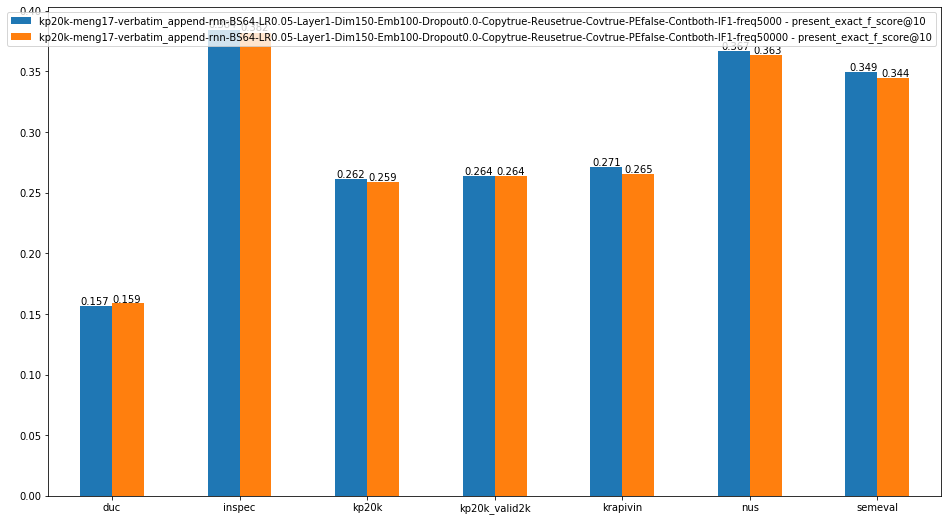

In [14]:
from scipy import stats
y_index='present_exact_f_score@10'
sample_freq_1 = 5000
sample_freq_2 = 20000

# prepare for one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue']
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue']
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue']

one2seq_df = one2seq_df.loc[(one2seq_df.step % sample_freq_1 == 0)]

one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

one2seq_df_1 = one2seq_df
for index_label, row_series in one2seq_df_1.iterrows():
     one2seq_df_1.at[index_label, 'exp_name'] = one2seq_df_1.at[index_label, 'exp_name'] + '-freq%d' % sample_freq_1 


one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']
one2seq_df = one2seq_df.loc[(one2seq_df.step % sample_freq_2 == 0)]

one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

one2seq_df_2 = one2seq_df
for index_label, row_series in one2seq_df_2.iterrows():
     one2seq_df_2.at[index_label, 'exp_name'] = one2seq_df_2.at[index_label, 'exp_name'] + '-freq%d' % sample_freq_2
        
# combine both and plot
combined_df = one2seq_df_1.append(one2seq_df_2, ignore_index=True)
# display(combined_df)

# obtain the test scores by best valid performance
str_summary_df, self_peak_summary_df, valid_peak_summary_df = brief_eval_results(combined_df, base_metric='present_exact_f_score@10')
# display(valid_peak_summary_df)


one2seq_freq1, one2seq_freq2 = [], []
for test_dataset, exp_group in valid_peak_summary_df.groupby('test_dataset'):
    print(test_dataset)
    freq1_row = exp_group.loc[exp_group['exp_name'].str.endswith('freq%d' % sample_freq_1)]
    freq2_row = exp_group.loc[exp_group['exp_name'].str.endswith('freq%d' % sample_freq_2)]
    
    with open(freq1_row['path'].values[0], 'r') as one2seq_freq1_eval_file:
        one2seq_freq1_eval = json.load(one2seq_freq1_eval_file)
    with open(freq2_row['path'].values[0], 'r') as one2seq_freq2_eval_file:
        one2seq_freq2_eval = json.load(one2seq_freq2_eval_file)
        
    # run T-test for individual testset
    print('T-test on testset %s:' % test_dataset)
    print(len(one2seq_freq1_eval['present_exact_f_score@10']))
    print(stats.describe(one2seq_freq1_eval['present_exact_f_score@10']))
    
    print('')
    print(len(one2seq_freq2_eval['present_exact_f_score@10']))
    print(stats.describe(one2seq_freq2_eval['present_exact_f_score@10']))
    ttest = stats.ttest_rel(one2seq_freq1_eval['present_exact_f_score@10'], one2seq_freq2_eval['present_exact_f_score@10'])
    print(ttest)
    print('=' * 50)
    
    if not test_dataset.startswith('kp20k'):
        one2seq_freq1.extend(one2seq_freq1_eval['present_exact_f_score@10'])
        one2seq_freq2.extend(one2seq_freq2_eval['present_exact_f_score@10'])

# run T-test on five testsets
print('Stats of one2seq-freq%d' % sample_freq_1)
print(len(one2seq_freq1))
print(stats.describe(one2seq_freq1))
print('')
print('Stats of one2seq-freq%d' % sample_freq_2)
print(len(one2seq_freq2))
print(stats.describe(one2seq_freq2))
print('T-test on five testsets:')
ttest = stats.ttest_rel(one2seq_freq1, one2seq_freq2)
print(ttest)


display(valid_peak_summary_df)

# Present results
metric_names = ['present_exact_f_score@10']

datasets = valid_peak_summary_df.test_dataset.unique()
groups = valid_peak_summary_df.exp_name.unique()
bar_values = {'%s - %s' % (group, metric_name): [] for group in groups for metric_name in metric_names}

for index_label, row_series in valid_peak_summary_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   

'''
''' 
    

## Effect of Copy

### RNN models

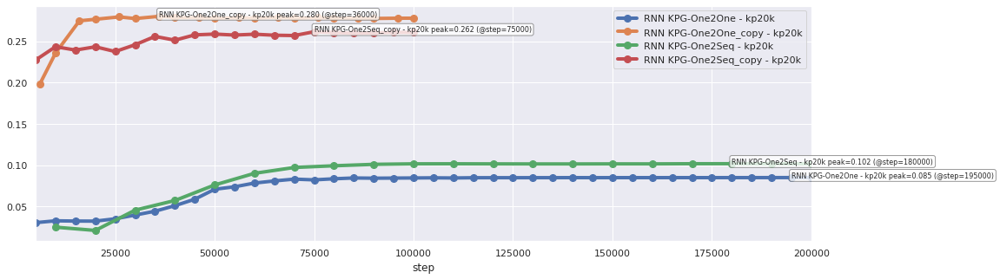

In [10]:
y_index='present_exact_f_score@10'

# prepare for one2one data
one2one_exps = [
                'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1',
                'kp20k-meng17-one2one-BS128-LR0.05-L1-D150-E100-DO0.0-Copyfalse-Covfalse',
                ]

one2one_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2one_exps)]
# one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue']
one2one_df = one2one_df.sort_values(by='step', ascending=True)
one2one_df = one2one_df.loc[((one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0))] # keep % 10000 and 5000
one2one_df = one2one_df.loc[one2one_df.beam_width == '200']
# kp20k_one2one_df = one2one_df[one2one_df.test_dataset.str.startswith('kp20k')]
kp20k_one2one_df = one2one_df[one2one_df.test_dataset == 'kp20k']

for index_label, row_series in kp20k_one2one_df.iterrows():
    expname = 'RNN KPG-One2One'
    expname += '_copy' if kp20k_one2one_df.at[index_label, 'exp_name'].find('Copytrue') > 0 else ''
    rename = expname + ' - ' + kp20k_one2one_df.at[index_label, 'test_dataset']

    kp20k_one2one_df.at[index_label, 'exp_name'] = expname
    kp20k_one2one_df.at[index_label, 'test_dataset'] = rename
    
# # prepare one2seq data
one2seq_exps = ['kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1',
                'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copyfalse',
               ]

one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue']
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[(one2seq_df.step % 5000 == 0)] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating
# kp20k_one2seq_df = one2seq_df[one2seq_df.test_dataset.str.startswith('kp20k')]
kp20k_one2seq_df = one2seq_df[one2seq_df.test_dataset == 'kp20k']

for index_label, row_series in kp20k_one2seq_df.iterrows():    
    expname = 'RNN KPG-One2Seq'
    expname += '_copy' if kp20k_one2seq_df.at[index_label, 'exp_name'].find('Copytrue') > 0 else ''
    rename = expname + ' - ' + kp20k_one2seq_df.at[index_label, 'test_dataset']

    kp20k_one2seq_df.at[index_label, 'exp_name'] = expname
    kp20k_one2seq_df.at[index_label, 'test_dataset'] = rename

# combine both and plot
combined_kp20k_df = kp20k_one2one_df.append(kp20k_one2seq_df, ignore_index=True)
# combined_df = one2one_df.append(one2seq_df, ignore_index=True)


# display(combined_kp20k_df)
plot_testing_curve(combined_kp20k_df, y_index=y_index, plot_valid_peak=False)


All data
(900, 121)
['one2one' 'one2seq+copy+cov' 'one2one+copy' 'one2one+copy+cov'
 'one2seq+copy' 'one2seq']
present valid_kp_df
(42, 121)
All data
(900, 121)
absent valid_kp_df
present_exact_precision@5
10
/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2one/meng17-one2one-kp20k-topmodels/meng17-one2one-fullbeam/meng17-one2one-beam200-maxlen6/eval/kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covfalse-Contboth-IF1_step_80000-kp20k-exhaustive.json


,path,exp_group,exp_name,test_name,tokenization,train_mode,model_base,order,train_dataset,step,test_dataset,decoding_method,decoding_terminate,beam_width,max_length,present_tgt_num,absent_tgt_num,present_pred_num,absent_pred_num,unique_pred_num,dup_pred_num,beam_num,beamstep_num,present_exact_correct@5,present_exact_precision@5,present_exact_recall@5,present_exact_f_score@5,present_exact_precision_hard@5,present_exact_f_score_hard@5,present_exact_correct@10,present_exact_precision@10,present_exact_recall@10,present_exact_f_score@10,present_exact_precision_hard@10,present_exact_f_score_hard@10,present_exact_correct@k,present_exact_precision@k,present_exact_recall@k,present_exact_f_score@k,present_exact_precision_hard@k,present_exact_f_score_hard@k,present_exact_correct@M,present_exact_precision@M,present_exact_recall@M,present_exact_f_score@M,present_exact_precision_hard@M,present_exact_f_score_hard@M,absent_exact_correct@10,absent_exact_precision@10,absent_exact_recall@10,absent_exact_f_score@10,absent_exact_precision_hard@10,absent_exact_f_score_hard@10,absent_exact_correct@50,absent_exact_precision@50,absent_exact_recall@50,absent_exact_f_score@50,absent_exact_precision_hard@50,absent_exact_f_score_hard@50,absent_exact_correct@M,absent_exact_precision@M,absent_exact_recall@M,absent_exact_f_score@M,absent_exact_precision_hard@M,absent_exact_f_score_hard@M,present_partial_correct@5,present_partial_precision@5,present_partial_recall@5,present_partial_f_score@5,present_partial_precision_hard@5,present_partial_f_score_hard@5,present_partial_correct@10,present_partial_precision@10,present_partial_recall@10,present_partial_f_score@10,present_partial_precision_hard@10,present_partial_f_score_hard@10,present_partial_correct@k,present_partial_precision@k,present_partial_recall@k,present_partial_f_score@k,present_partial_precision_hard@k,present_partial_f_score_hard@k,present_partial_correct@M,present_partial_precision@M,present_partial_recall@M,present_partial_f_score@M,present_partial_precision_hard@M,present_partial_f_score_hard@M,absent_partial_correct@10,absent_partial_precision@10,absent_partial_recall@10,absent_partial_f_score@10,absent_partial_precision_hard@10,absent_partial_f_score_hard@10,absent_partial_correct@50,absent_partial_precision@50,absent_partial_recall@50,absent_partial_f_score@50,absent_partial_precision_hard@50,absent_partial_f_score_hard@50,absent_partial_correct@M,absent_partial_precision@M,absent_partial_recall@M,absent_partial_f_score@M,absent_partial_precision_hard@M,absent_partial_f_score_hard@M,present_exact_advanced_auc,present_exact_advanced_ap,present_exact_advanced_mrr,present_exact_advanced_sadr,present_exact_advanced_ndcg,present_exact_advanced_alpha_ndcg@5,present_exact_advanced_alpha_ndcg@10,absent_exact_advanced_auc,absent_exact_advanced_ap,absent_exact_advanced_mrr,absent_exact_advanced_sadr,absent_exact_advanced_ndcg,absent_exact_advanced_alpha_ndcg@5,absent_exact_advanced_alpha_ndcg@10
65019,/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2one/meng17-one2one-kp20k-topmodels/meng17-one2one-fullbeam/meng17-one2one-beam200-maxlen6/eval/kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covfalse-Contboth-IF1_step_80000-kp20k-exhaustive.json,meng17-one2one-kp20k-topmodels,one2one+copy,step_80000-kp20k-exhaustive,meng17,one2one,rnn,one2one,kp20k,80000,kp20k,exhaustive,fullbeam,200,6,3.331916,1.930555,64.303097,383.164857,499.718767,499.718767,499.718767,2198.695452,1.405664,0.281133,0.493077,0.334212,0.281133,0.334212,1.934357,0.193436,0.651547,0.280349,0.193436,0.280349,1.322209,0.358082,0.358082,0.358082,0.358082,0.358082,3.125632,0.051071,0.921608,0.092751,0.051071,0.092751,0.116526,0.011653,0.055430,0.018413,0.011653,0.018413,0.237705,0.004754,0.109618,0.008993,0.004754,0.008993,0.370341,0.000970,0.168707,0.001926,0.000970,0.001926,1.432731,0.323188,0.563621,0.382964,0.323188,0.382964,1.970831,0.214266,0.714967,0.309202,0.214266,0.309202,1.363436,0.

,path,exp_group,exp_name,test_name,tokenization,train_mode,model_base,order,train_dataset,step,test_dataset,decoding_method,decoding_terminate,beam_width,max_length,present_tgt_num,absent_tgt_num,present_pred_num,absent_pred_num,unique_pred_num,dup_pred_num,beam_num,beamstep_num,present_exact_correct@5,present_exact_precision@5,present_exact_recall@5,present_exact_f_score@5,present_exact_precision_hard@5,present_exact_f_score_hard@5,present_exact_correct@10,present_exact_precision@10,present_exact_recall@10,present_exact_f_score@10,present_exact_precision_hard@10,present_exact_f_score_hard@10,present_exact_correct@k,present_exact_precision@k,present_exact_recall@k,present_exact_f_score@k,present_exact_precision_hard@k,present_exact_f_score_hard@k,present_exact_correct@M,present_exact_precision@M,present_exact_recall@M,present_exact_f_score@M,present_exact_precision_hard@M,present_exact_f_score_hard@M,absent_exact_correct@10,absent_exact_precision@10,absent_exact_recall@10,absent_exact_f_score@10,absent_exact_precision_hard@10,absent_exact_f_score_hard@10,absent_exact_correct@50,absent_exact_precision@50,absent_exact_recall@50,absent_exact_f_score@50,absent_exact_precision_hard@50,absent_exact_f_score_hard@50,absent_exact_correct@M,absent_exact_precision@M,absent_exact_recall@M,absent_exact_f_score@M,absent_exact_precision_hard@M,absent_exact_f_score_hard@M,present_partial_correct@5,present_partial_precision@5,present_partial_recall@5,present_partial_f_score@5,present_partial_precision_hard@5,present_partial_f_score_hard@5,present_partial_correct@10,present_partial_precision@10,present_partial_recall@10,present_partial_f_score@10,present_partial_precision_hard@10,present_partial_f_score_hard@10,present_partial_correct@k,present_partial_precision@k,present_partial_recall@k,present_partial_f_score@k,present_partial_precision_hard@k,present_partial_f_score_hard@k,present_partial_correct@M,present_partial_precision@M,present_partial_recall@M,present_partial_f_score@M,present_partial_precision_hard@M,present_partial_f_score_hard@M,absent_partial_correct@10,absent_partial_precision@10,absent_partial_recall@10,absent_partial_f_score@10,absent_partial_precision_hard@10,absent_partial_f_score_hard@10,absent_partial_correct@50,absent_partial_precision@50,absent_partial_recall@50,absent_partial_f_score@50,absent_partial_precision_hard@50,absent_partial_f_score_hard@50,absent_partial_correct@M,absent_partial_precision@M,absent_partial_recall@M,absent_partial_f_score@M,absent_partial_precision_hard@M,absent_partial_f_score_hard@M,present_exact_advanced_auc,present_exact_advanced_ap,present_exact_advanced_mrr,present_exact_advanced_sadr,present_exact_advanced_ndcg,present_exact_advanced_alpha_ndcg@5,present_exact_advanced_alpha_ndcg@10,absent_exact_advanced_auc,absent_exact_advanced_ap,absent_exact_advanced_mrr,absent_exact_advanced_sadr,absent_exact_advanced_ndcg,absent_exact_advanced_alpha_ndcg@5,absent_exact_advanced_alpha_ndcg@10


Series([], Name: present_exact_precision@5, dtype: float64)

TypeError: cannot unpack non-iterable NoneType object

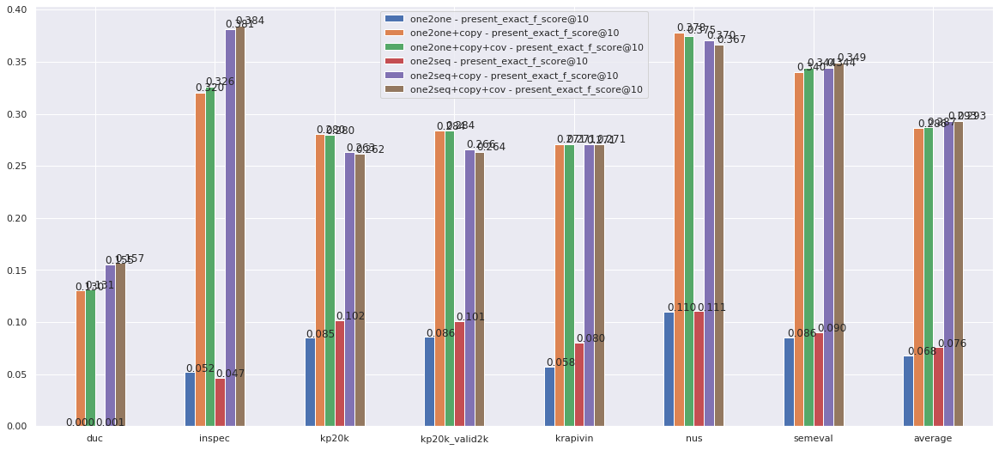

In [13]:
# 2. Compare different architecture variants
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

ordered_datasets = ['kp20k', 'inspec', 'krapivin', 'nus', 'semeval', 'duc', 'average']

kp_exps = {     
        'one2one': 'kp20k-meng17-one2one-BS128-LR0.05-L1-D150-E100-DO0.0-Copyfalse-Covfalse',
        'one2one+copy+cov': 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1',
        'one2one+copy': 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covfalse-Contboth-IF1',
        'one2seq': 'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copyfalse',
        'one2seq+copy+cov': 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1',
        'one2seq+copy': 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covfalse'
    
}
long2short = {long: short for short, long in kp_exps.items()}

# prepare data
kp_df = all_eval_df.loc[all_eval_df['exp_name'].isin(kp_exps.values())]
kp_df = kp_df.loc[(kp_df.step % 10000 == 6000) | (kp_df.step % 5000 == 0)] # keep % 10000
kp_df = kp_df.sort_values(by='step', ascending=True)
kp_df = kp_df.loc[(kp_df.beam_width == '50') | (kp_df.beam_width == '200')]
kp_df = kp_df.loc[kp_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
kp_df = kp_df.loc[kp_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating


for index_label, row_series in kp_df.iterrows():
    expname = kp_df.at[index_label, 'exp_name']
    kp_df.at[index_label, 'exp_name'] = long2short[expname]

print('All data')
print(kp_df.shape)
print(kp_df.exp_name.unique())

print('present valid_kp_df')
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@10')
print(valid_kp_df.shape)
# display(valid_kp_df)


metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
metric_names = ['present_exact_advanced_sadr']
metric_names = ['present_exact_f_score@10']

datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
    
    

############## absent
print('All data')
print(kp_df.shape)
print('absent valid_kp_df')
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
print(valid_kp_df.shape)
# display(valid_kp_df)

# metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50', 'absent_exact_advanced_sadr']
metric_names = ['absent_exact_recall@50']


datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_kp_df.iterrows():
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
# display(df.transpose())


    
    
    
# Phrase number
_, _, valid_peak_summary_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@10')
metric_names = ['unique_pred_num', 'present_pred_num', 'absent_pred_num']

datasets = valid_peak_summary_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()
bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

# metric_name = 'present_exact_f_score_hard@10'

for index_label, row_series in valid_peak_summary_df.iterrows():
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


### Transformer models

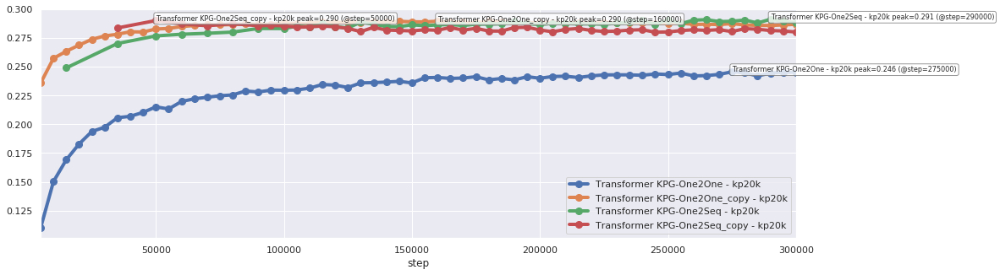

In [14]:
y_index='present_exact_f_score@10'
test_dataset = 'kp20k'

# prepare for one2one data
one2one_exps = [
                'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',
                'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
                ]

one2one_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2one_exps)]
one2one_df = one2one_df.sort_values(by='step', ascending=True)
one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000
one2one_df = one2one_df.loc[one2one_df.beam_width == '200']
# kp20k_one2one_df = one2one_df[one2one_df.test_dataset.str.startswith('kp20k')]
kp20k_one2one_df = one2one_df[one2one_df.test_dataset == test_dataset]

for index_label, row_series in kp20k_one2one_df.iterrows():
    expname = 'Transformer KPG-One2One'
    expname += '_copy' if kp20k_one2one_df.at[index_label, 'exp_name'].find('Copytrue') > 0 else ''
    rename = expname + ' - ' + kp20k_one2one_df.at[index_label, 'test_dataset']

    kp20k_one2one_df.at[index_label, 'exp_name'] = expname
    kp20k_one2one_df.at[index_label, 'test_dataset'] = rename
    
# # prepare one2seq data
one2seq_exps = [
                'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
                'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',]

one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating
# kp20k_one2seq_df = one2seq_df[one2seq_df.test_dataset.str.startswith('kp20k')]
kp20k_one2seq_df = one2seq_df[one2seq_df.test_dataset == test_dataset]

for index_label, row_series in kp20k_one2seq_df.iterrows():    
    expname = 'Transformer KPG-One2Seq'
    expname += '_copy' if kp20k_one2seq_df.at[index_label, 'exp_name'].find('Copytrue') > 0 else ''
    rename = expname + ' - ' + kp20k_one2seq_df.at[index_label, 'test_dataset']

    kp20k_one2seq_df.at[index_label, 'exp_name'] = expname
    kp20k_one2seq_df.at[index_label, 'test_dataset'] = rename

# combine both and plot
combined_kp20k_df = kp20k_one2one_df.append(kp20k_one2seq_df, ignore_index=True)
# combined_df = one2one_df.append(one2seq_df, ignore_index=True)


# display(combined_kp20k_df)
plot_testing_curve(combined_kp20k_df, y_index=y_index, plot_valid_peak=False)


### Sum up (used in paper)

All data
(700, 121)
absent valid_kp_df
(28, 121)


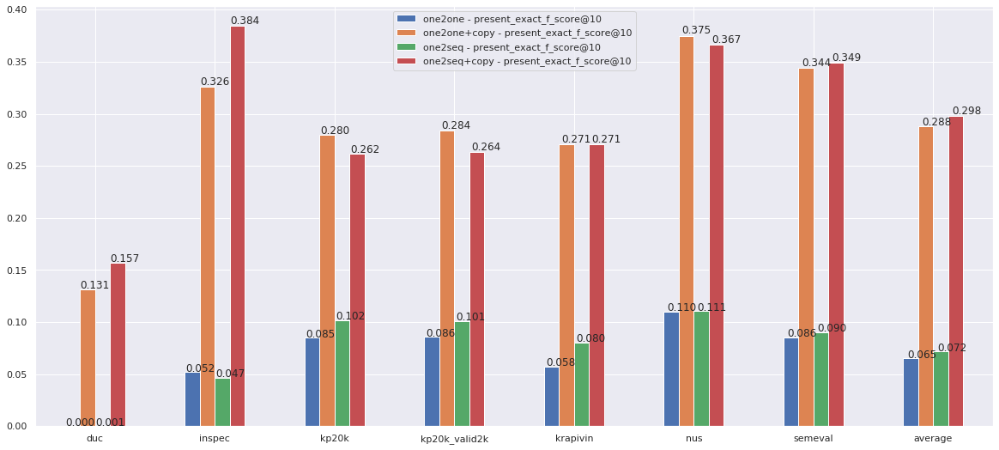

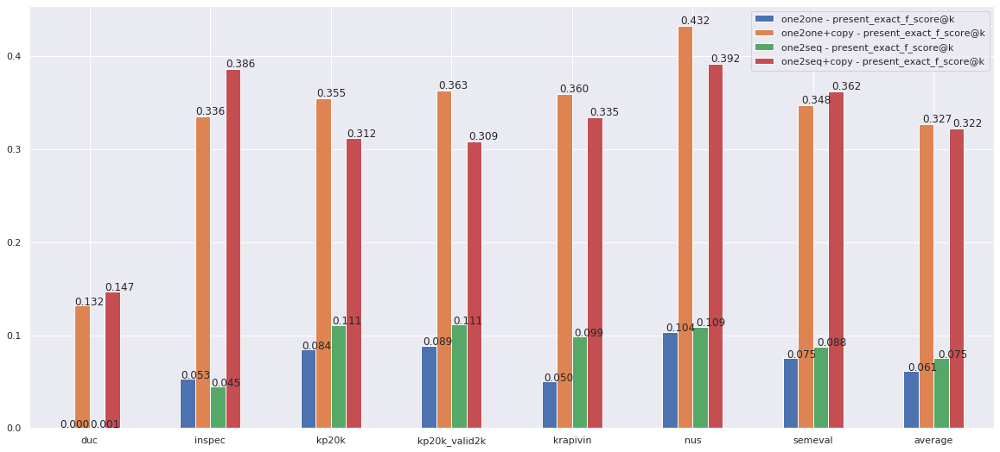

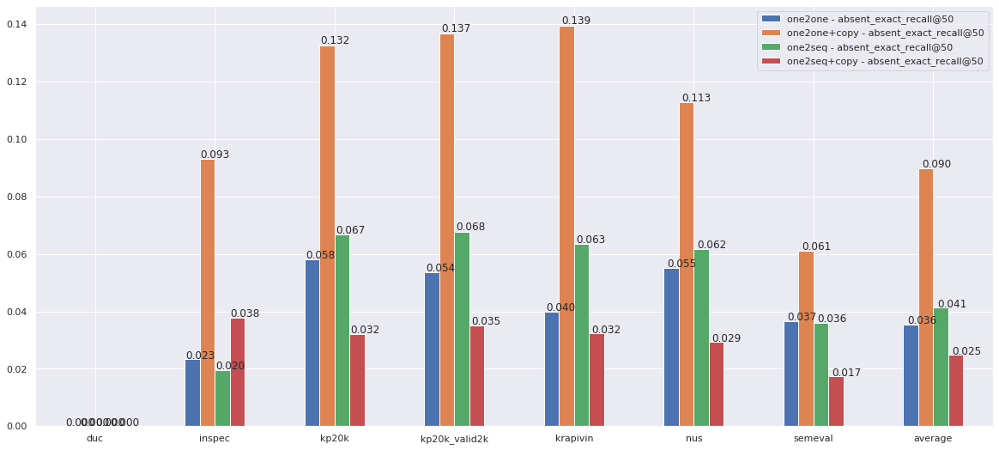

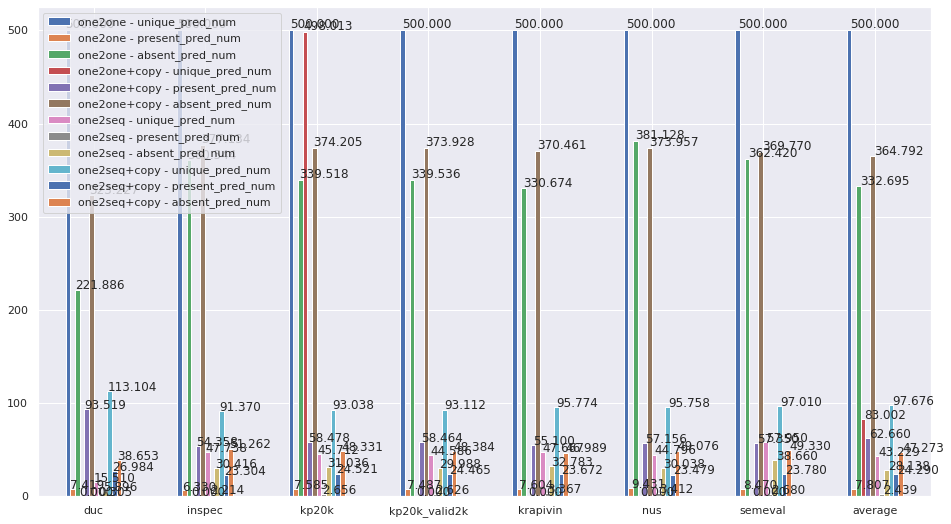

In [74]:
# 2. Compare different architecture variants
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

ordered_datasets = ['kp20k', 'inspec', 'krapivin', 'nus', 'semeval', 'duc', 'average']

kp_exps = {
        'one2one': 'kp20k-meng17-one2one-BS128-LR0.05-L1-D150-E100-DO0.0-Copyfalse-Covfalse',
        'one2one+copy': 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1',
        'one2seq': 'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copyfalse',
        'one2seq+copy': 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1',
}

# kp_exps = {
#         'one2one': 'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',
#         'one2one+copy': 'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#         'one2seq': 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',
#         'one2seq+copy': 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# }
long2short = {long: short for short, long in kp_exps.items()}

# prepare data
kp_df = all_eval_df.loc[all_eval_df['exp_name'].isin(kp_exps.values())]
kp_df = kp_df.loc[(kp_df.step % 10000 == 6000) | (kp_df.step % 5000 == 0)] # keep % 10000
kp_df = kp_df.sort_values(by='step', ascending=True)
kp_df = kp_df.loc[(kp_df.beam_width == '50') | (kp_df.beam_width == '200')]
kp_df = kp_df.loc[kp_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
kp_df = kp_df.loc[kp_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating


for index_label, row_series in kp_df.iterrows():
    expname = kp_df.at[index_label, 'exp_name']
    kp_df.at[index_label, 'exp_name'] = long2short[expname]

############## present F@10
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@10')
metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
metric_names = ['present_exact_advanced_sadr']
metric_names = ['present_exact_f_score@10']

datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
    

    
    
############## present F@O
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@k')
metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
metric_names = ['present_exact_f_score@k']

datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
  
    
    
    

############## absent
print('All data')
print(kp_df.shape)
print('absent valid_kp_df')
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
print(valid_kp_df.shape)
# display(valid_kp_df)

# metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50', 'absent_exact_advanced_sadr']
metric_names = ['absent_exact_recall@50']


datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_kp_df.iterrows():
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
# display(df.transpose())


    
    
    
# Phrase number
_, _, valid_peak_summary_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@10')
metric_names = ['unique_pred_num', 'present_pred_num', 'absent_pred_num']

datasets = valid_peak_summary_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()
bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

# metric_name = 'present_exact_f_score_hard@10'

for index_label, row_series in valid_peak_summary_df.iterrows():
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


#### Plot average scores (used in paper)

In [351]:
# 2. Compare different architecture variants
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

ordered_datasets = ['kp20k', 'inspec', 'krapivin', 'nus', 'semeval', 'duc', 'average']

kp_exps = {
        'RNN-O2O': 'kp20k-meng17-one2one-BS128-LR0.05-L1-D150-E100-DO0.0-Copyfalse-Covfalse',
        'RNN-O2O+copy': 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1',
        'RNN-O2S': 'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copyfalse',
        'RNN-O2S+copy': 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1',
        'TF-O2O': 'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',
        'TF-O2O+copy': 'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
        'TF-O2S': 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',
        'TF-O2S+copy': 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
}
long2short = {long: short for short, long in kp_exps.items()}

# prepare data
kp_df = all_eval_df.loc[all_eval_df['exp_name'].isin(kp_exps.values())]
kp_df = kp_df.loc[(kp_df.step % 10000 == 6000) | (kp_df.step % 5000 == 0)] # keep % 10000
kp_df = kp_df.sort_values(by='step', ascending=True)
kp_df = kp_df.loc[(kp_df.beam_width == '50') | (kp_df.beam_width == '200')]
kp_df = kp_df.loc[kp_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
kp_df = kp_df.loc[kp_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating


for index_label, row_series in kp_df.iterrows():
    expname = kp_df.at[index_label, 'exp_name']
    kp_df.at[index_label, 'exp_name'] = long2short[expname]

############## present F@10
# change to use F@O as anchor metric for present KPG
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@k')
metric_names = ['present_exact_f_score@10']

datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {exp_name: [] for exp_name in exp_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values[row_series.exp_name].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')

datamodel_names = bar_values.keys()
model_names = ['RNN-O2O', 'TF-O2O', 'RNN-O2S', 'TF-O2S']
avg_bar_values = {'w/o copy': [0.0] * 4, 'w/ copy': [0.0] * 4}

for shortmodel_name, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    if '+' in shortmodel_name:
        copy_mode = 'w/ copy'
        model_name = shortmodel_name.split('+')[0]
    else:
        copy_mode = 'w/o copy'
        model_name = shortmodel_name
    avg_bar_values[copy_mode][model_names.index(model_name)] = np.mean(_v)
#     print(shortmodel_name, _v)
#     print(copy_mode, model_name, np.mean(_v))
# print(avg_bar_values)
    
f10_df = pd.DataFrame(avg_bar_values, index=model_names)
# display(f10_df)

    
    
############## present F@O
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@k')
metric_names = ['present_exact_f_score@k']

datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {exp_name: [] for exp_name in exp_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values[row_series.exp_name].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')

datamodel_names = bar_values.keys()
model_names = ['RNN-O2O', 'TF-O2O', 'RNN-O2S', 'TF-O2S']
avg_bar_values = {'w/o copy': [0.0] * 4, 'w/ copy': [0.0] * 4}

for shortmodel_name, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    if '+' in shortmodel_name:
        copy_mode = 'w/ copy'
        model_name = shortmodel_name.split('+')[0]
    else:
        copy_mode = 'w/o copy'
        model_name = shortmodel_name
    avg_bar_values[copy_mode][model_names.index(model_name)] = np.mean(_v)
#     print(shortmodel_name, _v)
#     print(copy_mode, model_name, np.mean(_v))
# print(avg_bar_values)
    
fo_df = pd.DataFrame(avg_bar_values, index=model_names)
# display(fo_df)

    
    
    

############## absent
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='absent_exact_recall@50')
metric_names = ['absent_exact_recall@50']

datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {exp_name: [] for exp_name in exp_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values[row_series.exp_name].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')

datamodel_names = bar_values.keys()
model_names = ['RNN-O2O', 'TF-O2O', 'RNN-O2S', 'TF-O2S']
avg_bar_values = {'w/o copy': [0.0] * 4, 'w/ copy': [0.0] * 4}

for shortmodel_name, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    if '+' in shortmodel_name:
        copy_mode = 'w/ copy'
        model_name = shortmodel_name.split('+')[0]
    else:
        copy_mode = 'w/o copy'
        model_name = shortmodel_name
    avg_bar_values[copy_mode][model_names.index(model_name)] = np.mean(_v)
#     print(shortmodel_name, _v)
#     print(copy_mode, model_name, np.mean(_v))
# print(avg_bar_values)
    
r50_df = pd.DataFrame(avg_bar_values, index=model_names)
display(r50_df)

f10_df = f10_df * 100.0
fo_df = fo_df * 100.0
r50_df = r50_df * 100.0


,w/o copy,w/ copy
RNN-O2O,0.0,0.1
TF-O2O,0.2,0.1
RNN-O2S,0.0,0.0
TF-O2S,0.1,0.1


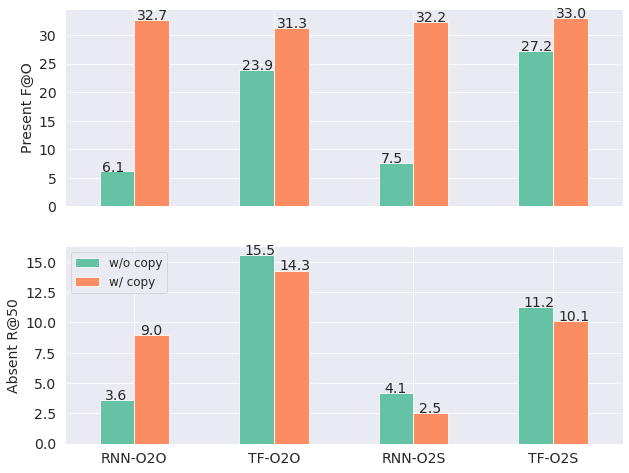

In [352]:

sns.set_palette("Set2")
sns.set_context("paper", rc={"font.size": 14,
                             "axes.titlesize": 14,
                             "axes.labelsize": 14,
                             "xtick.labelsize": 14,
                             "ytick.labelsize": 14,
                             "legend.fontsize": 12})

f, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
# f10_df.plot.bar(ax=axes[0], legend=False, rot=0)
# for p in axes[0].patches:
#     axes[0].annotate('%.3f' % (p.get_height()), (p.get_x() + 0.02, p.get_height() + 0.05))  
# axes[0].set_ylabel("Present F@10")

fo_df.plot.bar(ax=axes[0], legend=False, rot=0)
for p in axes[0].patches:
    axes[0].annotate('%.1f' % (p.get_height()), (p.get_x() + 0.02, p.get_height() + 0.05))    
axes[0].set_ylabel("Present F@O") 


r50_df.plot.bar(ax=axes[1], legend=True, rot=0)
for p in axes[1].patches:
    axes[1].annotate('%.1f' % (p.get_height()), (p.get_x() + 0.04, p.get_height() + 0.05))    
axes[1].set_ylabel("Absent R@50") 
axes[1].legend(loc='upper left')



## Effect of Phrase Order on One2Seq Learning

### One2Seq - Present Phrase Prediction

Terminology:
 - present_pred_num means valid phrases (no <unk>, doesn't contain ,/.) that can be found in the source text.
 - verbatim_prepend means (absent_phrases+present_phrases)
 - verbatim_append means (present_phrases+absent_phrases)
    
**verbatim_prepend** outputs significantly more present_phrases and **verbatim_append/alphabetic** outputs significantly more absent_phrases, which means the more noisy hidden state lead to more diverse following predictions.
    
    
    
    

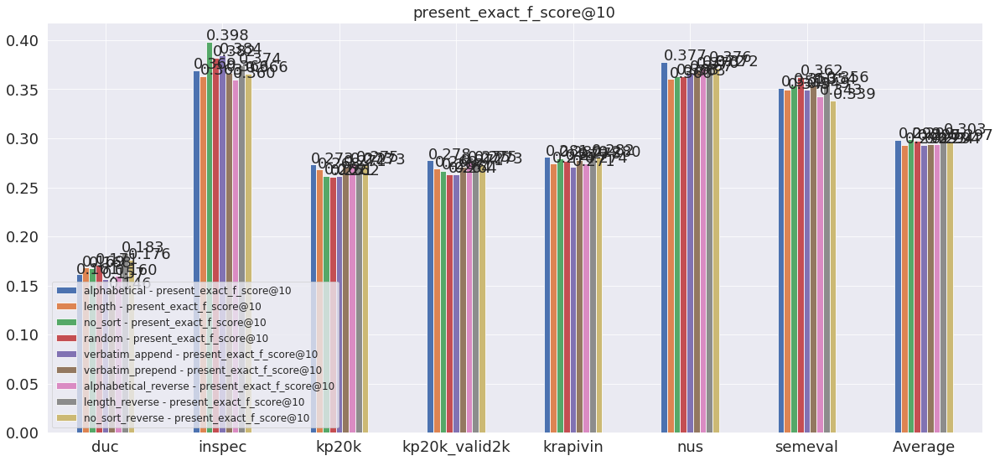

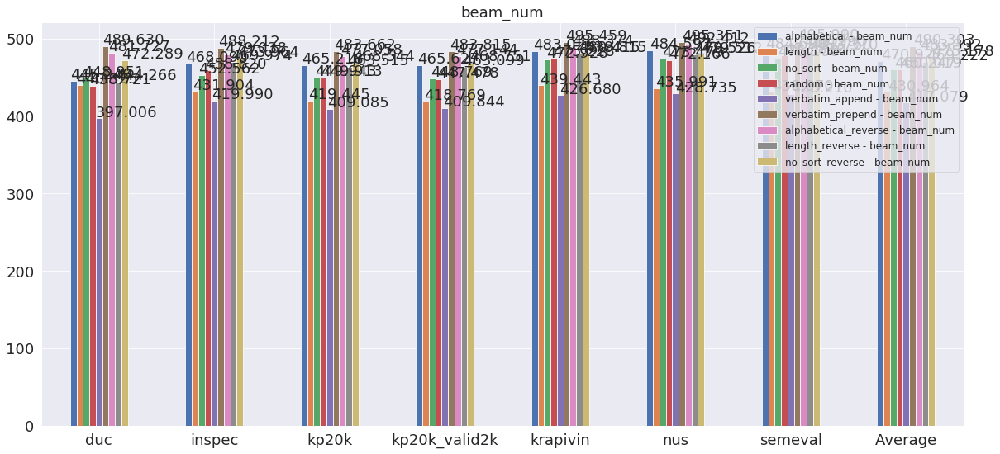

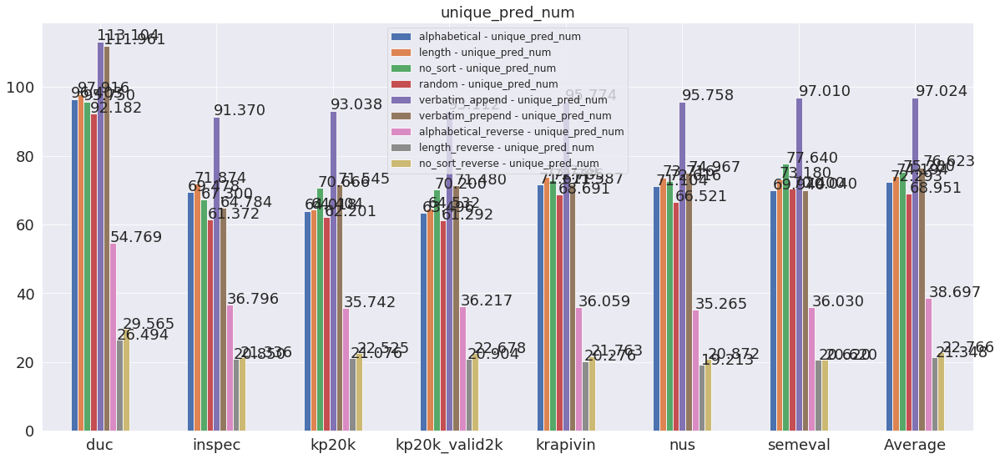

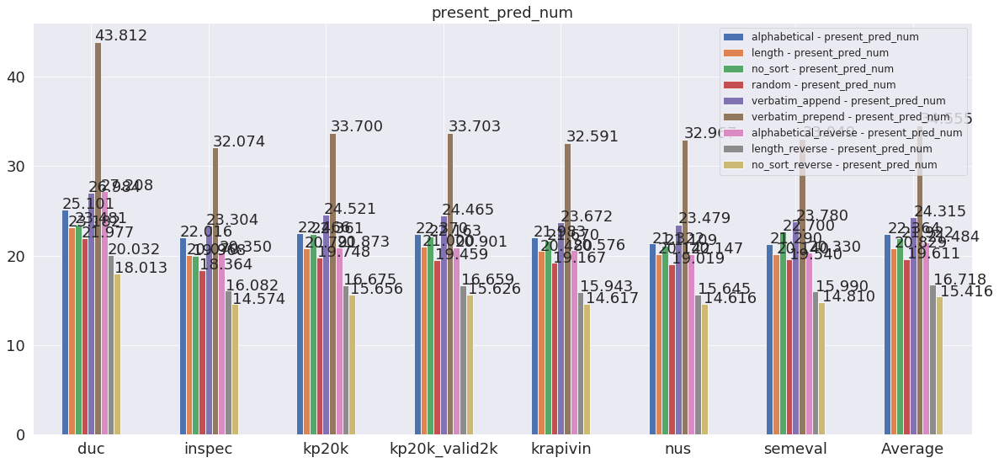

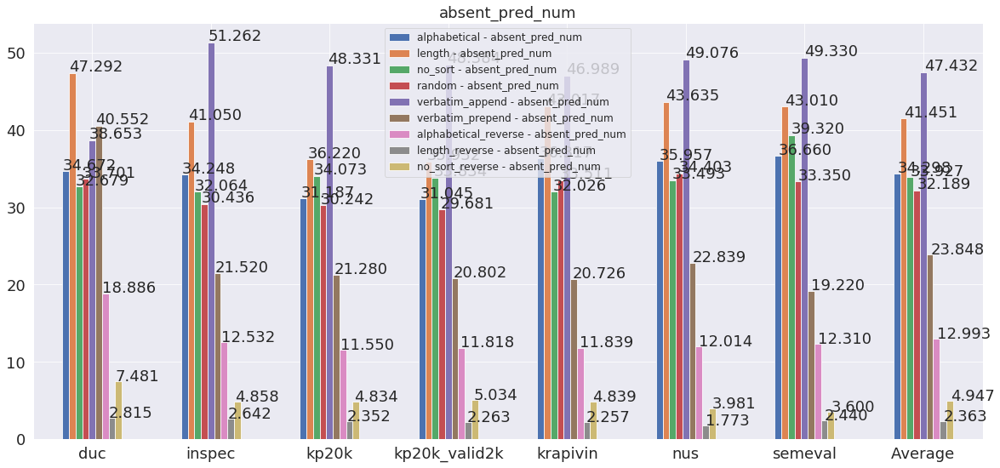

In [43]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

one2seq_exps = ['kp20k-meng17-random-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kp20k-meng17-length-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kpgen-meng17-kp20k-length_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
                'kp20k-meng17-no_sort-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kpgen-meng17-kp20k-no_sort_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
                'kp20k-meng17-alphabetical-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kpgen-meng17-kp20k-alphabetical_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
                'kp20k-meng17-verbatim_prepend-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

_, _, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@10')

# ensure the dataframe is sorted first
# display(one2seq_df)
# display(valid_one2seq_df)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
metric_names = ['present_exact_f_score@10']

datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
    
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='present_exact_f_score@10')
ax.legend(loc='lower left')

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    
    
'''
# SADR
_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_advanced_sadr')
metric_names = ['present_exact_advanced_sadr']
datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')

for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='present_exact_advanced_sadr')
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
# AUC
_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_advanced_auc')
metric_names = ['present_exact_advanced_auc']

datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='present_exact_advanced_auc')
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
'''    


    
    
metric_names = ['beam_num']
datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='beam_num')
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    

metric_names = ['unique_pred_num']
datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='unique_pred_num')
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    

metric_names = ['present_pred_num']
datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='present_pred_num')
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    

metric_names = ['absent_pred_num']
datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='absent_pred_num')
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    

#### Heat map

(7, 9)
Index(['alphabetical - present_exact_f_score@10',
       'length - present_exact_f_score@10',
       'no_sort - present_exact_f_score@10',
       'random - present_exact_f_score@10',
       'verbatim_append - present_exact_f_score@10',
       'verbatim_prepend - present_exact_f_score@10',
       'alphabetical_reverse - present_exact_f_score@10',
       'length_reverse - present_exact_f_score@10',
       'no_sort_reverse - present_exact_f_score@10'],
      dtype='object')
(7, 9)
Index(['alphabetical - present_exact_f_score@10',
       'length - present_exact_f_score@10',
       'no_sort - present_exact_f_score@10',
       'random - present_exact_f_score@10',
       'verbatim_append - present_exact_f_score@10',
       'verbatim_prepend - present_exact_f_score@10',
       'alphabetical_reverse - present_exact_f_score@10',
       'length_reverse - present_exact_f_score@10',
       'no_sort_reverse - present_exact_f_score@10'],
      dtype='object')


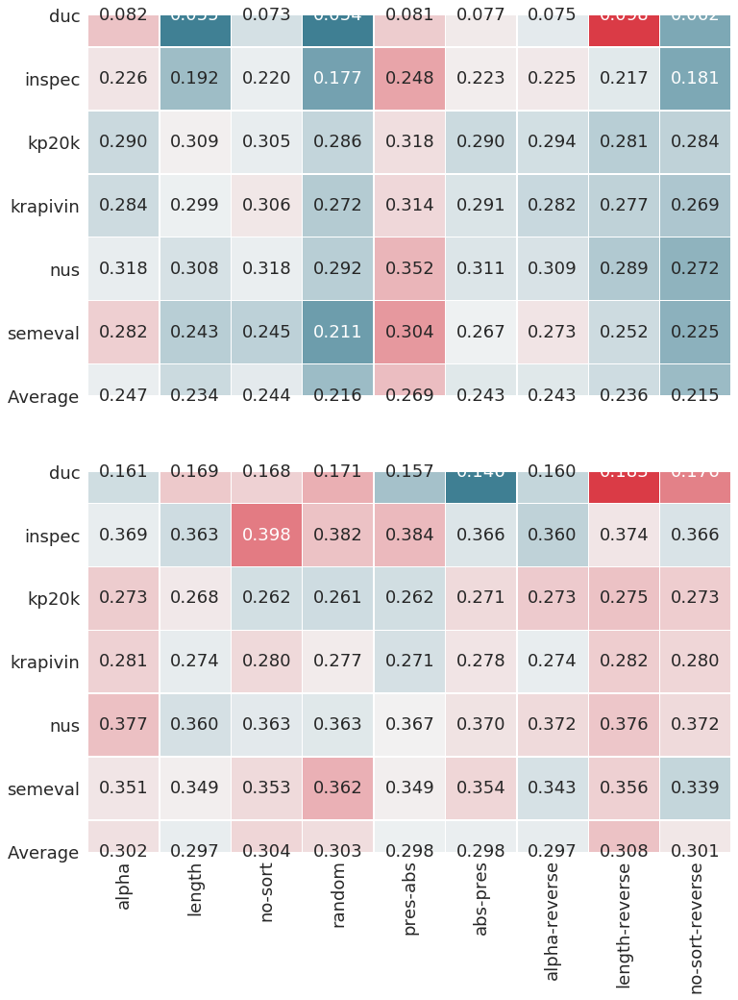

In [41]:
one2seq_exps = ['kp20k-meng17-random-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kp20k-meng17-length-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kpgen-meng17-kp20k-length_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
                'kp20k-meng17-no_sort-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kpgen-meng17-kp20k-no_sort_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
                'kp20k-meng17-alphabetical-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kpgen-meng17-kp20k-alphabetical_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
                'kp20k-meng17-verbatim_prepend-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']

import seaborn as sns
sns.set()
import copy
# prepare one2seq data
############ beam_width=1 ############
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '1']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'selfterminating'] # exhaustive/selfterminating

_, peak_one2seq_df, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@10')

metric_names = ['present_exact_f_score@10']

datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
    
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)

df_f1 = copy.copy(df)
df_f1 = df_f1.drop(['kp20k_valid2k'], axis=0)
print(df_f1.shape)
column_name_map = {
                   'random - present_exact_f_score@10': "random",
                   'alphabetical - present_exact_f_score@10': "alpha",
                   'alphabetical_reverse - present_exact_f_score@10': "alpha-reverse",
                   'length - present_exact_f_score@10': "length",
                   'length_reverse - present_exact_f_score@10': "length-reverse",
                   'no_sort - present_exact_f_score@10': "no-sort",
                   'no_sort_reverse - present_exact_f_score@10': "no-sort-reverse",
                   'verbatim_append - present_exact_f_score@10': "pres-abs",
                   'verbatim_prepend - present_exact_f_score@10': "abs-pres"}

normalized_df_f1 = df_f1.div(df_f1.sum(axis=1), axis=0)
print(normalized_df_f1.columns)
normalized_df_f1.columns = [column_name_map[item] for item in normalized_df_f1.columns]


############ beam_width=10 ############
'''
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '10']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

_, peak_one2seq_df, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@10')

metric_names = ['present_exact_f_score@10']

datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
    
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)

df_f1_10 = copy.copy(df)
df_f1_10 = df_f1_10.drop(['kp20k_valid2k'], axis=0)
print(df_f1_10.shape)
column_name_map = {
                   'random - present_exact_f_score@10': "random",
                   'alphabetical - present_exact_f_score@10': "alpha",
                   'alphabetical_reverse - present_exact_f_score@10': "alpha-reverse",
                   'length - present_exact_f_score@10': "length",
                   'length_reverse - present_exact_f_score@10': "length-reverse",
                   'no_sort - present_exact_f_score@10': "no-sort",
                   'no_sort_reverse - present_exact_f_score@10': "no-sort-reverse",
                   'verbatim_append - present_exact_f_score@10': "pres-abs",
                   'verbatim_prepend - present_exact_f_score@10': "abs-pres"}

normalized_df_f1_10 = df_f1_10.div(df_f1_10.sum(axis=1), axis=0)
print(normalized_df_f1_10.columns)
normalized_df_f1_10.columns = [column_name_map[item] for item in normalized_df_f1_10.columns]

############### beam_width=25 ##################
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '25']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

_, peak_one2seq_df, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@10')

metric_names = ['present_exact_f_score@10']

datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
    
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)

df_f1_25 = copy.copy(df)
df_f1_25 = df_f1_25.drop(['kp20k_valid2k'], axis=0)
print(df_f1_25.shape)
column_name_map = {
                   'random - present_exact_f_score@10': "random",
                   'alphabetical - present_exact_f_score@10': "alpha",
                   'alphabetical_reverse - present_exact_f_score@10': "alpha-reverse",
                   'length - present_exact_f_score@10': "length",
                   'length_reverse - present_exact_f_score@10': "length-reverse",
                   'no_sort - present_exact_f_score@10': "no-sort",
                   'no_sort_reverse - present_exact_f_score@10': "no-sort-reverse",
                   'verbatim_append - present_exact_f_score@10': "pres-abs",
                   'verbatim_prepend - present_exact_f_score@10': "abs-pres"}

normalized_df_f1_25 = df_f1_25.div(df_f1_25.sum(axis=1), axis=0)
print(normalized_df_f1_25.columns)
normalized_df_f1_25.columns = [column_name_map[item] for item in normalized_df_f1_25.columns]
'''

############ beam_width=50 ############
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

_, peak_one2seq_df, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@10')

metric_names = ['present_exact_f_score@10']

datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
    
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)

df_f1_50 = copy.copy(df)
df_f1_50 = df_f1_50.drop(['kp20k_valid2k'], axis=0)
print(df_f1_50.shape)
column_name_map = {
                   'random - present_exact_f_score@10': "random",
                   'alphabetical - present_exact_f_score@10': "alpha",
                   'alphabetical_reverse - present_exact_f_score@10': "alpha-reverse",
                   'length - present_exact_f_score@10': "length",
                   'length_reverse - present_exact_f_score@10': "length-reverse",
                   'no_sort - present_exact_f_score@10': "no-sort",
                   'no_sort_reverse - present_exact_f_score@10': "no-sort-reverse",
                   'verbatim_append - present_exact_f_score@10': "pres-abs",
                   'verbatim_prepend - present_exact_f_score@10': "abs-pres"}

normalized_df_f1_50 = df_f1_50.div(df_f1_50.sum(axis=1), axis=0)
print(normalized_df_f1_50.columns)
normalized_df_f1_50.columns = [column_name_map[item] for item in normalized_df_f1_50.columns]





sns.set_context("paper", rc={"font.size": 18,
                             "axes.titlesize": 18,
                             "axes.labelsize": 18,
                             "xtick.labelsize": 18,
                             "ytick.labelsize": 18,
                             "legend.fontsize": 12})


cmap = sns.diverging_palette(220, 10, as_cmap=True)
'''
f, axes = plt.subplots(2, 2, figsize=(20, 9))
sns.heatmap(normalized_df_f1, annot=df_f1, linewidths=.5, ax=axes[0][0], cmap=cmap, fmt='.3f', cbar=False)
axes[0][0].set_ylabel("F1@10")
axes[0][0].set_xlabel("(a) Greedy Decoding")

sns.heatmap(normalized_df_f1_10, annot=df_f1_10, linewidths=.5, ax=axes[0][1], cmap=cmap, fmt='.3f', cbar=False)
axes[0][1].set_ylabel(" ") 
axes[0][1].set_xlabel("(b) Beam Width = 10") 

sns.heatmap(normalized_df_f1_25, annot=df_f1_25, linewidths=.5, ax=axes[1][0], cmap=cmap, fmt='.3f', cbar=False)
axes[1][0].set_ylabel("F1@10")
axes[1][0].set_xlabel("(c) Beam Width = 25") 

sns.heatmap(normalized_df_f1_50, annot=df_f1_50, linewidths=.5, ax=axes[1], cmap=cmap, fmt='.3f', cbar=False)
axes[1][1].set_ylabel(" ") 
axes[1][1].set_xlabel("(d) Beam Width = 50") 
f.tight_layout()
'''


f, axes = plt.subplots(2, figsize=(12, 16), sharex=True)
sns.heatmap(normalized_df_f1, annot=df_f1, linewidths=.5, ax=axes[0], cmap=cmap, fmt='.3f', cbar=False)
sns.heatmap(normalized_df_f1_50, annot=df_f1_50, linewidths=.5, ax=axes[1], cmap=cmap, fmt='.3f', cbar=False)

# sns.heatmap(normalized_df_f1_50, annot=df_f1_50, linewidths=.2, ax=axes, cmap=cmap, fmt='.3f', cbar=False)


### One2Seq - Absent Phrase Prediction

"\n# SADR\n_, peak_one2seq_df, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='absent_exact_advanced_sadr')\nmetric_names = ['absent_exact_advanced_sadr']\ndatasets = valid_one2seq_df.test_dataset.unique()\norders = valid_one2seq_df.order.unique()\nbar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}\nfor index_label, row_series in valid_one2seq_df.iterrows():   \n    for metric_name in metric_names:\n        bar_value = row_series[metric_name]\n        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))\n\nkp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')\nfor k, v in bar_values.items():\n    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]\n    bar_values[k].append(np.mean(v))\ndatasets = np.append(datasets, 'Average')\ndf = pd.DataFrame(bar_values, index=datasets)\nax = df.plot.bar(figsize=(20,9), rot=0)\nfor p in ax.patches:\n    ax.annotate('%.3f' % (p.get_height(

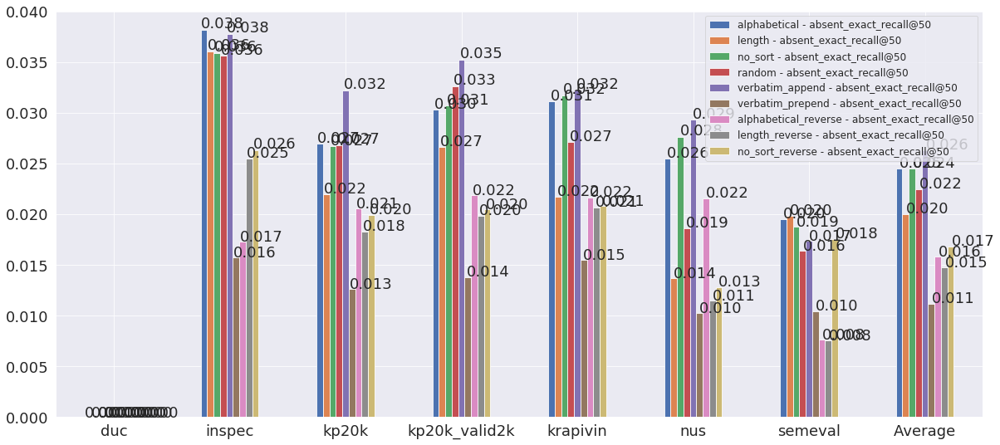

In [42]:
one2seq_exps = ['kp20k-meng17-random-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kp20k-meng17-length-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kpgen-meng17-kp20k-length_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
                'kp20k-meng17-no_sort-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kpgen-meng17-kp20k-no_sort_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
                'kp20k-meng17-alphabetical-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kpgen-meng17-kp20k-alphabetical_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
                'kp20k-meng17-verbatim_prepend-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
                'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

_, peak_one2seq_df, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
# display(one2seq_df)
# display(peak_one2seq_df)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
metric_names = ['absent_exact_recall@50']
datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
    
    
    
    
    
    
'''
# SADR
_, peak_one2seq_df, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='absent_exact_advanced_sadr')
metric_names = ['absent_exact_advanced_sadr']
datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
    
    
    
    
    
    
# AUC
_, peak_one2seq_df, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='absent_exact_advanced_auc')
metric_names = ['absent_exact_advanced_auc']
datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
'''


## Effect of Decoding Strategy on One2Seq Learning

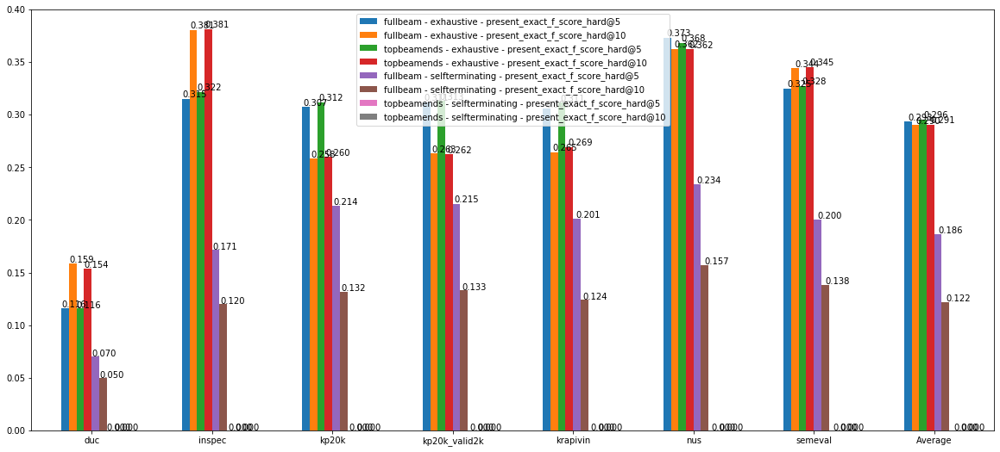

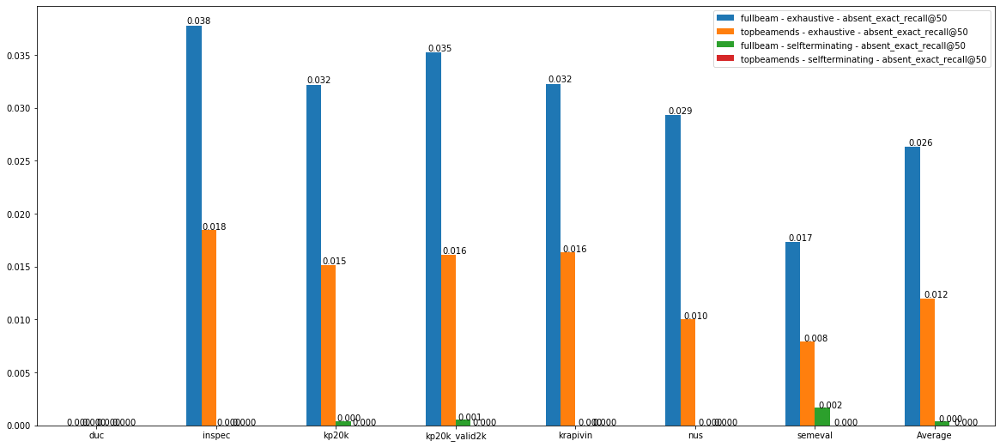

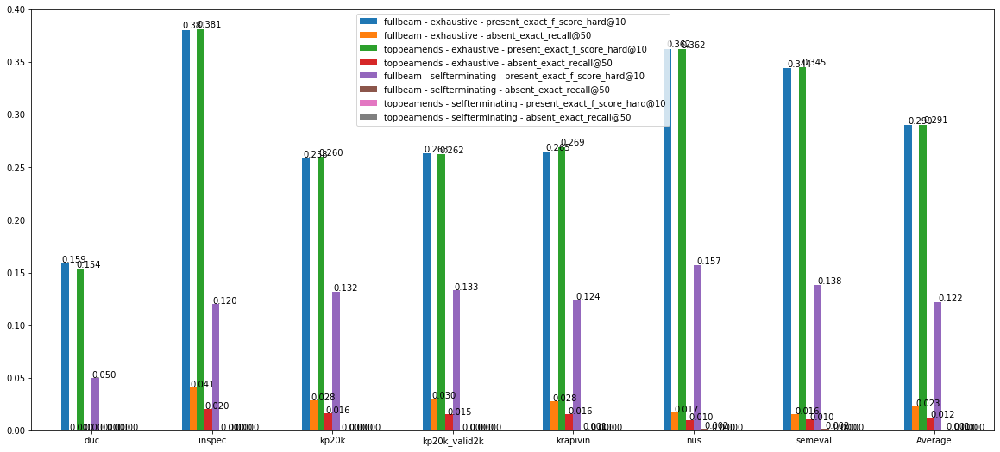

In [27]:
one2seq_exps = ['kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000

# display(one2seq_df)

one2seq_df = one2seq_df.sort_values(by='step', ascending=True)

for index_label, row_series in one2seq_df.iterrows():
    one2seq_df.at[index_label , 'exp_name'] = '%s-%s-%s' % (one2seq_df.at[index_label , 'decoding_terminate'], one2seq_df.at[index_label , 'decoding_method'], one2seq_df.at[index_label , 'exp_name'])

_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_f_score_hard@10')

# print(peak_one2seq_df.iloc[0].path)
# ensure the dataframe is sorted first
# display(peak_one2seq_df)
# print(peak_one2seq_df.shape)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10']

datasets = valid_one2seq_df.test_dataset.unique()
decoding_terminates = valid_one2seq_df.decoding_terminate.unique()
decoding_methods = valid_one2seq_df.decoding_method.unique()

bar_values = {'%s - %s - %s' % (decoding_terminate, decoding_method, metric_name): [] for decoding_method in decoding_methods for decoding_terminate in decoding_terminates for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s - %s' % (row_series.decoding_terminate, row_series.decoding_method, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    
    
    
############ Absent
one2seq_exps = ['kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000

# display(one2seq_df)

one2seq_df = one2seq_df.sort_values(by='step', ascending=True)

for index_label, row_series in one2seq_df.iterrows():
    one2seq_df.at[index_label , 'exp_name'] = '%s-%s-%s' % (one2seq_df.at[index_label , 'decoding_terminate'], one2seq_df.at[index_label , 'decoding_method'], one2seq_df.at[index_label , 'exp_name'])

_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='absent_exact_recall@50')

# print(peak_one2seq_df.iloc[0].path)
# ensure the dataframe is sorted first
# display(peak_one2seq_df)
# print(peak_one2seq_df.shape)
# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
# metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50']
metric_names = ['absent_exact_recall@50']


datasets = valid_one2seq_df.test_dataset.unique()
decoding_terminates = valid_one2seq_df.decoding_terminate.unique()
decoding_methods = valid_one2seq_df.decoding_method.unique()

bar_values = {'%s - %s - %s' % (decoding_terminate, decoding_method, metric_name): [] for decoding_method in decoding_methods for decoding_terminate in decoding_terminates for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s - %s' % (row_series.decoding_terminate, row_series.decoding_method, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    
    
    
    
    
    
    
    
    
    
############ Present + Absent
one2seq_exps = ['kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000

# display(one2seq_df)

one2seq_df = one2seq_df.sort_values(by='step', ascending=True)

for index_label, row_series in one2seq_df.iterrows():
    one2seq_df.at[index_label , 'exp_name'] = '%s-%s-%s' % (one2seq_df.at[index_label , 'decoding_terminate'], one2seq_df.at[index_label , 'decoding_method'], one2seq_df.at[index_label , 'exp_name'])

_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_f_score_hard@10')

# print(peak_one2seq_df.iloc[0].path)
# ensure the dataframe is sorted first
# display(peak_one2seq_df)
# print(peak_one2seq_df.shape)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
# metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50']
metric_names = ['present_exact_f_score_hard@10', 'absent_exact_recall@50']


datasets = valid_one2seq_df.test_dataset.unique()
decoding_terminates = valid_one2seq_df.decoding_terminate.unique()
decoding_methods = valid_one2seq_df.decoding_method.unique()

bar_values = {'%s - %s - %s' % (decoding_terminate, decoding_method, metric_name): [] for decoding_method in decoding_methods for decoding_terminate in decoding_terminates for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s - %s' % (row_series.decoding_terminate, row_series.decoding_method, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    

## Effect of Beam Width

In [5]:
y_index='present_exact_f_score@10'

# prepare for one2one data
one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1']
one2one_df = one2one_df.sort_values(by='step', ascending=True)
one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000
kp20k_one2one_df = one2one_df[one2one_df.test_dataset.str.startswith('kp20k')]

for index_label, row_series in kp20k_one2one_df.iterrows():
     kp20k_one2one_df.at[index_label, 'test_dataset'] = 'one2one - ' + kp20k_one2one_df.at[index_label, 'test_dataset']
    
# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating


### One2One

#### One2One - Present Phrase Prediction

    - For present prediction, beam_width>8 is already enough. Actual unique #kp increases significantly using larger beam size.
    - For absent, the corresponding increase is very clear. The gain from beam=64 to beam=200 is small.

[  8  16  32  64 200]
[  8  16  32  64 200]


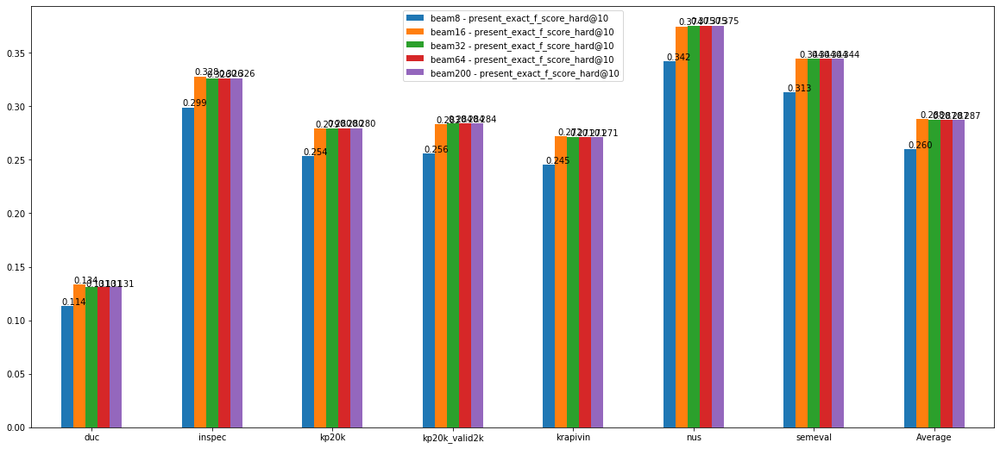

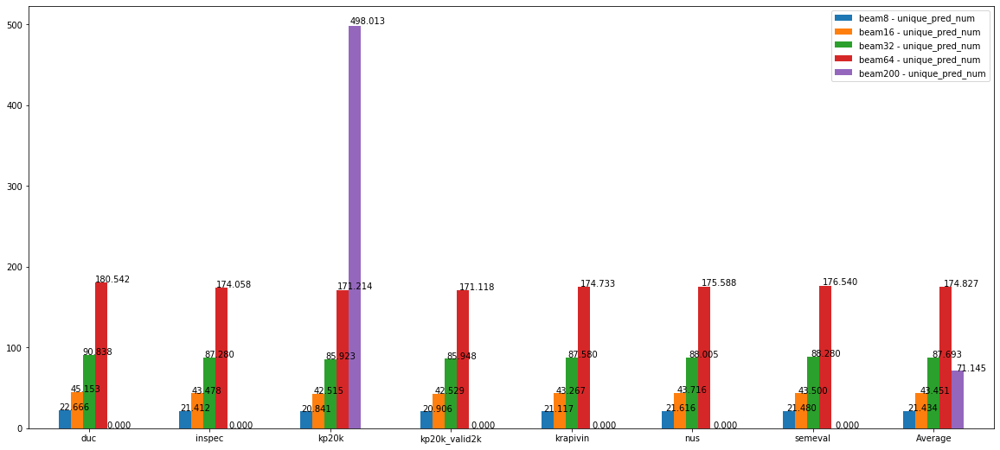

In [29]:
one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1']
one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000
one2one_df['beam_width'] = one2one_df['beam_width'].astype(int)
one2one_df = one2one_df.sort_values(by=['beam_width', 'step'], ascending=True)

# one2one_df = one2one_df[one2one_df.test_dataset.str.startswith('kp20k')]

for index_label, row_series in one2one_df.iterrows():
    one2one_df.at[index_label , 'exp_name'] = '%s-beam%s' % (one2one_df.at[index_label , 'exp_name'], one2one_df.at[index_label , 'beam_width'])

_, peak_one2one_df, valid_one2one_df = brief_eval_results(one2one_df, base_metric='present_exact_f_score_hard@10')
# ensure the dataframe is sorted first
# display(peak_one2one_df)
# print(peak_one2one_df.shape)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10']
metric_names = ['present_exact_f_score_hard@10']

datasets = valid_one2one_df.test_dataset.unique()
beam_widths = one2one_df.beam_width.unique()
print(beam_widths)

bar_values = {'beam%s - %s' % (beam_width, metric_name): [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2one_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['beam%s - %s' % (row_series.beam_width, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   

    

# unique number of phrases
metric_names = ['unique_pred_num']

datasets = valid_one2one_df.test_dataset.unique()
beam_widths = one2one_df.beam_width.unique()
print(beam_widths)

bar_values = {'beam%s - %s' % (beam_width, metric_name): [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2one_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['beam%s - %s' % (row_series.beam_width, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


#### One2One - Absent Phrase Prediction

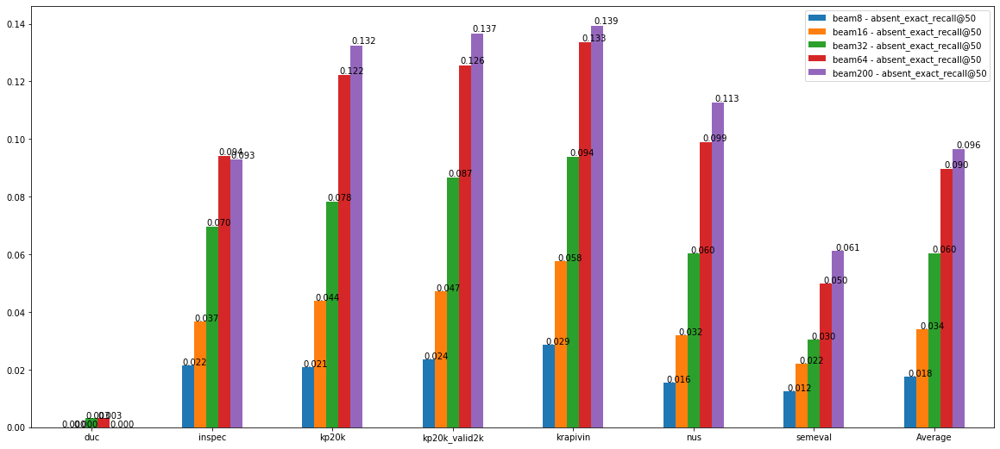

In [30]:
one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1']
one2one_df = one2one_df.sort_values(by='step', ascending=True)
one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000
# one2one_df = one2one_df[one2one_df.test_dataset.str.startswith('kp20k')]

for index_label, row_series in one2one_df.iterrows():
    one2one_df.at[index_label , 'exp_name'] = '%s-beam%s' % (one2one_df.at[index_label , 'exp_name'], one2one_df.at[index_label , 'beam_width'])

_, peak_one2one_df, valid_one2one_df = brief_eval_results(one2one_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
# display(peak_one2one_df)
# print(peak_one2one_df.shape)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50']
metric_names = ['absent_exact_recall@50']

datasets = valid_one2one_df.test_dataset.unique()
beam_widths = sorted([int(b) for b in valid_one2one_df.beam_width.unique()])

bar_values = {'beam%s - %s' % (beam_width, metric_name): [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2one_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['beam%s - %s' % (row_series.beam_width, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


In [ ]:
one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1']
one2one_df = one2one_df.sort_values(by='step', ascending=True)
one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000
# one2one_df = one2one_df[one2one_df.test_dataset.str.startswith('kp20k')]

for index_label, row_series in one2one_df.iterrows():
    one2one_df.at[index_label , 'exp_name'] = '%s-beam%s' % (one2one_df.at[index_label , 'exp_name'], one2one_df.at[index_label , 'beam_width'])

_, peak_one2one_df, valid_one2one_df = brief_eval_results(one2one_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
# display(peak_one2one_df)
# print(peak_one2one_df.shape)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50']
metric_names = ['absent_exact_recall@50']

datasets = valid_one2one_df.test_dataset.unique()
beam_widths = sorted([int(b) for b in valid_one2one_df.beam_width.unique()])

bar_values = {'beam%s - %s' % (beam_width, metric_name): [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2one_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['beam%s - %s' % (row_series.beam_width, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


### One2Seq
    - For exhaustive, it's clear that the larger beam witdh the better performance. But for self-terminating, the other way around, essentially due to the preference of shorter sequences.
    - The absent performance of exhaustive is poor and of self-terminating is negligible.
    - Alert: we don't have statistics like unique_pred_num for self-terminating due to carelessness.

#### One2Seq - Present Prediction

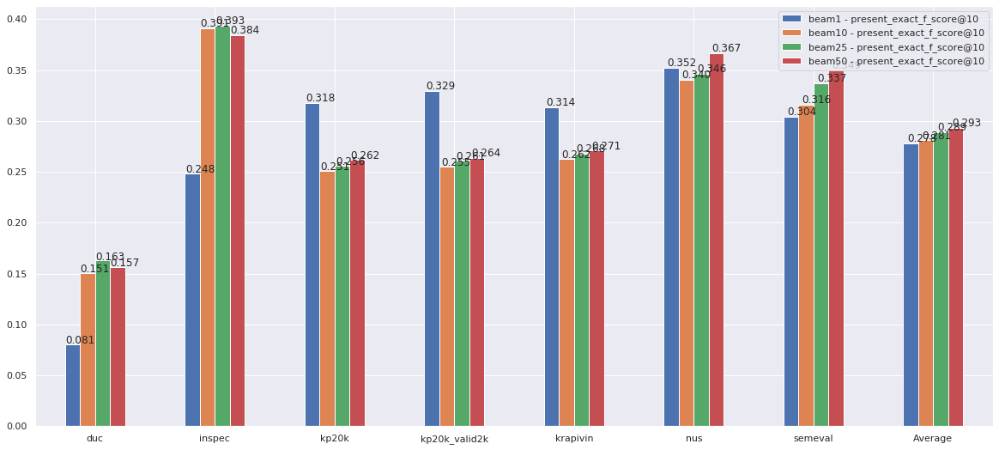

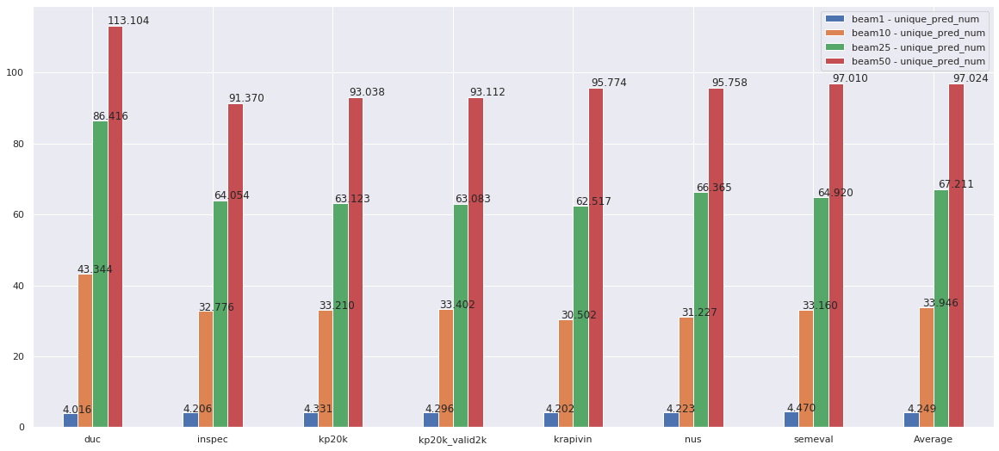

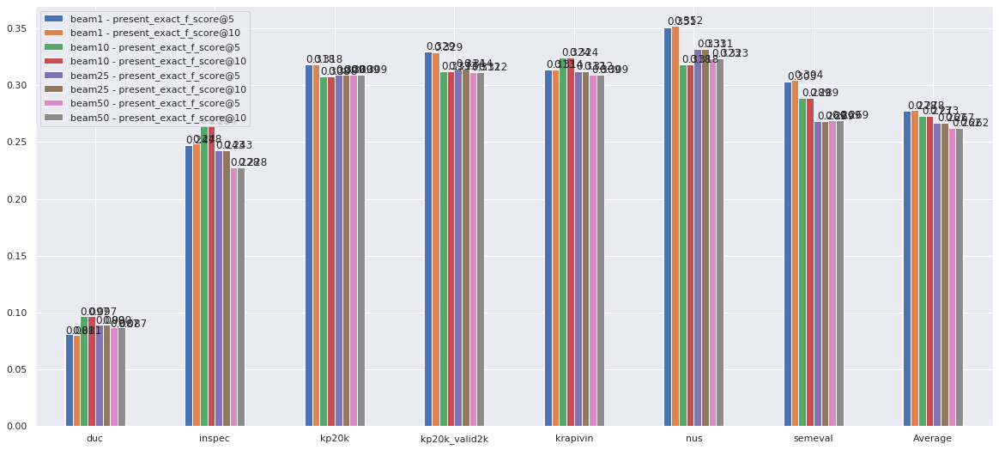

In [4]:
######### Exhaustive

one2seq_exps = ['kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

for index_label, row_series in one2seq_df.iterrows():
    one2seq_df.at[index_label , 'exp_name'] = '%s-beam%s' % (one2seq_df.at[index_label , 'exp_name'], one2seq_df.at[index_label , 'beam_width'])

_, _, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@10')

# ensure the dataframe is sorted first
# print(peak_one2seq_df.shape)
# display(peak_one2seq_df)

# metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k', 'present_exact_f_score@M']
metric_names = ['present_exact_f_score@10']

datasets = valid_one2seq_df.test_dataset.unique()
beam_widths = valid_one2seq_df.beam_width.unique()

bar_values = {'beam%s - %s' % (beam_width, metric_name): [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['beam%s - %s' % (row_series.beam_width, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    

    
# Plot unique_pred_num
metric_names = ['unique_pred_num']

datasets = valid_one2seq_df.test_dataset.unique()
beam_widths = valid_one2seq_df.beam_width.unique()
bar_values = {'beam%s - %s' % (beam_width, metric_name): [] for beam_width in beam_widths for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['beam%s - %s' % (row_series.beam_width, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
 
    
    
######### Self-terminating

one2seq_exps = ['kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'selfterminating'] # exhaustive/selfterminating

for index_label, row_series in one2seq_df.iterrows():
    one2seq_df.at[index_label , 'exp_name'] = '%s-beam%s' % (one2seq_df.at[index_label , 'exp_name'], one2seq_df.at[index_label , 'beam_width'])

_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@10')

# ensure the dataframe is sorted first
# print(peak_one2seq_df.shape)
# display(peak_one2seq_df)

# metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k', 'present_exact_f_score@M']
metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10']
# metric_names = ['present_exact_f_score@10']


datasets = valid_one2seq_df.test_dataset.unique()
beam_widths = valid_one2seq_df.beam_width.unique()

bar_values = {'beam%s - %s' % (beam_width, metric_name): [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['beam%s - %s' % (row_series.beam_width, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


#### One2Seq - Absent Prediction

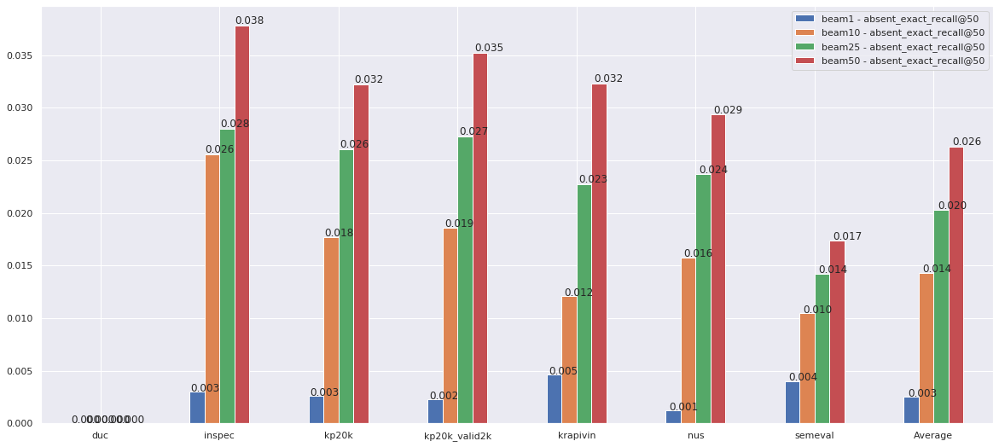

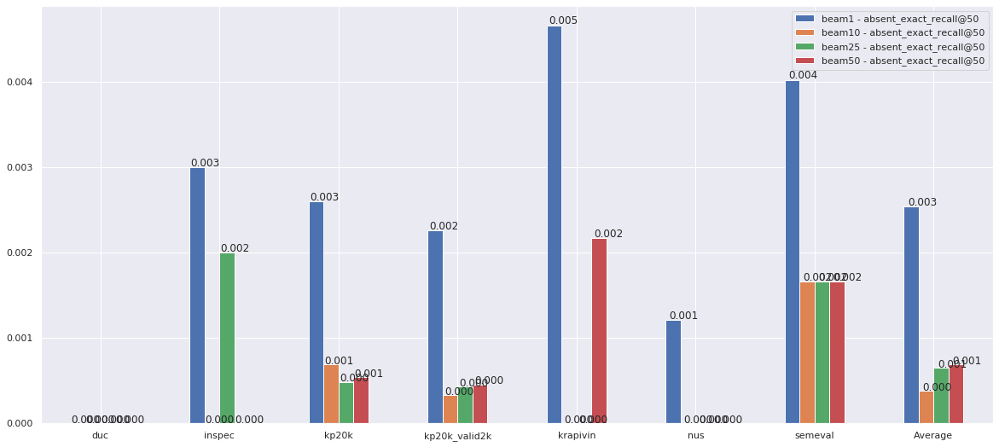

In [6]:
######### Exhaustive
one2seq_exps = ['kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

for index_label, row_series in one2seq_df.iterrows():
    one2seq_df.at[index_label , 'exp_name'] = '%s-beam%s' % (one2seq_df.at[index_label , 'exp_name'], one2seq_df.at[index_label , 'beam_width'])

_, _, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@10')

# ensure the dataframe is sorted first
# print(peak_one2seq_df.shape)
# display(peak_one2seq_df)

metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50']
metric_names = ['absent_exact_recall@50']

datasets = valid_one2seq_df.test_dataset.unique()
beam_widths = valid_one2seq_df.beam_width.unique()

bar_values = {'beam%s - %s' % (beam_width, metric_name): [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['beam%s - %s' % (row_series.beam_width, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    
    
######### Self-terminating

one2seq_exps = ['kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'selfterminating'] # exhaustive/selfterminating

for index_label, row_series in one2seq_df.iterrows():
    one2seq_df.at[index_label , 'exp_name'] = '%s-beam%s' % (one2seq_df.at[index_label , 'exp_name'], one2seq_df.at[index_label , 'beam_width'])

_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@10')

# ensure the dataframe is sorted first
# print(peak_one2seq_df.shape)
# display(peak_one2seq_df)

# metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k', 'present_exact_f_score@M']
metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50']
metric_names = ['absent_exact_recall@50']

datasets = valid_one2seq_df.test_dataset.unique()
beam_widths = valid_one2seq_df.beam_width.unique()

bar_values = {'beam%s - %s' % (beam_width, metric_name): [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['beam%s - %s' % (row_series.beam_width, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    

### One2One vs. One2Seq Present

#### RNN

,Beam,F@O,model
0,8,0.319557,RNN
1,16,0.326624,RNN
2,32,0.326885,RNN
3,64,0.327016,RNN
4,200,0.327054,RNN


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


{'Beam': [1, 10, 25, 50], 'F@O': [0.26723133263019827, 0.31357115175153655, 0.31867138526915223, 0.32248722461089524], 'model': ['RNN', 'RNN', 'RNN', 'RNN']}


,Beam,F@O,model
0,1,0.267231,RNN
1,10,0.313571,RNN
2,25,0.318671,RNN
3,50,0.322487,RNN


Text(0, 0.5, '')

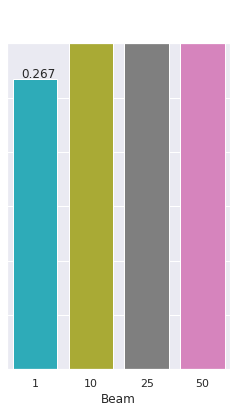

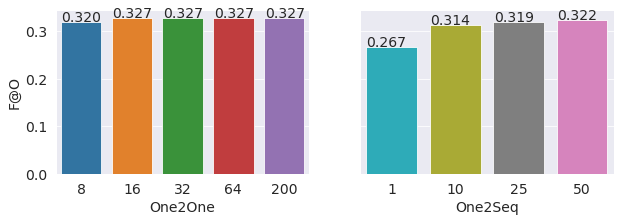

In [11]:
# plot One2One 
one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1']
one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000
one2one_df['beam_width'] = one2one_df['beam_width'].astype(int)
one2one_df = one2one_df.sort_values(by=['beam_width', 'step'], ascending=True)

for index_label, row_series in one2one_df.iterrows():
    one2one_df.at[index_label , 'exp_name'] = 'One2One-beam%s' % one2one_df.at[index_label , 'beam_width']

_, _, valid_one2one_df, _ = brief_eval_results(one2one_df, base_metric='present_exact_f_score@k') 

metric_names = ['present_exact_f_score@k']

datasets = valid_one2one_df.test_dataset.unique()
beam_widths = one2one_df.beam_width.unique()

bar_values = {beam_width: [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2one_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values[row_series.beam_width].append(float(bar_value))

avg_bar_values = {'Beam': [], 'F@O': [], 'model': []}
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    avg_bar_values['Beam'].append(int(k))
    avg_bar_values['F@O'].append(np.mean(_v))
    avg_bar_values['model'].append('RNN')

df = pd.DataFrame.from_dict(avg_bar_values)
display(df)
'''
plt.figure(figsize=(5,6))
sns.set_palette("tab10", n_colors=10)
ax = sns.barplot(x="Beam", y="F@10", data=df)
ax.set_ylim(0, 0.3)
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() + 0.15, p.get_height() * 1.005))   
'''
import copy
rnn_one2one_present_df = copy.copy(df)






# plot One2Seq
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']
one2seq_df['beam_width'] = one2seq_df['beam_width'].astype(int)
one2seq_df = one2seq_df.sort_values(by=['beam_width', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam

for index_label, row_series in one2seq_df.iterrows():
    one2seq_df.at[index_label , 'exp_name'] = 'One2Seq-beam%s' % one2seq_df.at[index_label , 'beam_width']

_, _, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@k') 

# display(valid_one2seq_df)
metric_name = 'present_exact_f_score@k'

datasets = valid_one2seq_df.test_dataset.unique()
beam_widths = one2seq_df.beam_width.unique()

bar_values = {'%s' % (beam_width): [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    bar_value = row_series[metric_name]
    bar_values['%s' % (row_series.beam_width)].append(float(bar_value))

# print(bar_values)
avg_bar_values = {'Beam': [], 'F@O': [], 'model': []}
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    avg_bar_values['Beam'].append(int(k))
    avg_bar_values['F@O'].append(np.mean(_v))
    avg_bar_values['model'].append('RNN')

# '''
print(avg_bar_values)

df = pd.DataFrame.from_dict(avg_bar_values)
display(df)
rnn_one2seq_present_df = copy.copy(df)

plt.figure(figsize=(4,6))
sns.set_palette("tab10_r", n_colors=10)

ax = sns.barplot(x="Beam", y="F@O", data=df)
ax.set_ylim(0, 0.3)
ax.set_yticklabels([])
ax.set_ylabel('')

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() + 0.15, p.get_height() * 1.005))   
# '''

sns.set_context("paper", rc={"font.size": 14,
                             "axes.titlesize": 14,
                             "axes.labelsize": 14,
                             "xtick.labelsize": 14,
                             "ytick.labelsize": 14,
                             "legend.fontsize": 12})

f, axes = plt.subplots(1, 2, figsize=(10, 3), sharey=True)
sns.set_palette("tab10", n_colors=10)
sns.barplot(x="Beam", y="F@O", data=rnn_one2one_present_df, ax=axes[0])
# df1.plot.bar(ax=axes[0], legend=False, rot=0)
for p in axes[0].patches:
    axes[0].annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
axes[0].set_xlabel("One2One")

# df2.plot.bar(ax=axes[1], rot=0)
sns.set_palette("tab10_r", n_colors=10)
sns.barplot(x="Beam", y="F@O", data=rnn_one2seq_present_df, ax=axes[1])
for p in axes[1].patches:
    axes[1].annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
axes[1].set_xlabel("One2Seq") 
axes[1].set_ylabel("")




#### Transformers

,Beam,F@O,model
0,8,0.304694,TF
1,16,0.312574,TF
2,32,0.312238,TF
3,64,0.312586,TF
4,200,0.312619,TF


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


(1295, 121)
{'Beam': [1, 10, 25, 50], 'F@O': [0.2746217920232182, 0.3059079509812458, 0.328056885778184, 0.32964581915149765], 'model': ['TF', 'TF', 'TF', 'TF']}


,Beam,F@O,model
0,1,0.274622,TF
1,10,0.305908,TF
2,25,0.328057,TF
3,50,0.329646,TF


Text(0, 0.5, '')

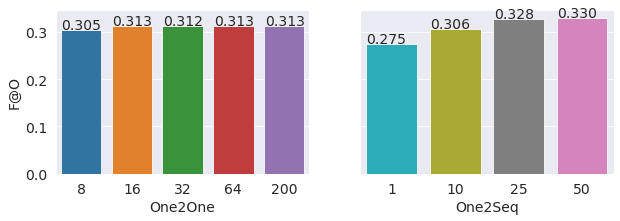

In [12]:
# plot One2One 
one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue']
one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000
one2one_df['beam_width'] = one2one_df['beam_width'].astype(int)
one2one_df = one2one_df.sort_values(by=['beam_width', 'step'], ascending=True)

for index_label, row_series in one2one_df.iterrows():
    one2one_df.at[index_label , 'exp_name'] = 'One2One-beam%s' % one2one_df.at[index_label , 'beam_width']

_, _, valid_one2one_df, _ = brief_eval_results(one2one_df, base_metric='present_exact_f_score@k') 

metric_names = ['present_exact_f_score@k']

datasets = valid_one2one_df.test_dataset.unique()
beam_widths = one2one_df.beam_width.unique()

bar_values = {beam_width: [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2one_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values[row_series.beam_width].append(float(bar_value))

avg_bar_values = {'Beam': [], 'F@O': [], 'model': []}
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    avg_bar_values['Beam'].append(int(k))
    avg_bar_values['F@O'].append(np.mean(_v))
    avg_bar_values['model'].append('TF')

df = pd.DataFrame.from_dict(avg_bar_values)
display(df)
'''
plt.figure(figsize=(5,6))
sns.set_palette("tab10", n_colors=10)
ax = sns.barplot(x="Beam", y="F@10", data=df)
ax.set_ylim(0, 0.3)
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() + 0.15, p.get_height() * 1.005))   
'''
import copy
tf_one2one_present_df = copy.copy(df)





# plot One2Seq
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue']
one2seq_df['beam_width'] = one2seq_df['beam_width'].astype(int)
one2seq_df = one2seq_df.sort_values(by=['beam_width', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
# one2seq_df = one2seq_df.loc[(one2seq_df.step >= 100000) | (one2seq_df.beam_width == 50) | (one2seq_df.beam_width == 1)] # a workaround, some kp20k results are missing

print(one2seq_df.shape)
# a workaround, some kp20k results are missing
# beam_step_TBR = []
# for beam_width in one2seq_df['beam_width'].unique():
# #     print('beam_width=', beam_width)
#     beam_df = one2seq_df.loc[one2seq_df.beam_width == beam_width]
#     for step in one2seq_df['step'].unique():
#         step_df = one2seq_df.loc[one2seq_df.step == step]
#         print('beam=%d, step=%d, #(dataset)=%d, step_df.shape=%s'
#               % (beam_width, step, len(step_df.test_dataset.unique()), step_df.shape))
        
#         if len(step_df.test_dataset.unique()) < 7:
#             print('remove! ', (beam_width, step, step_df.shape[0]))
#             beam_step_TBR.append((beam_width, step, step_df.shape[0]))

# # some rows cannot be detected by df_TBR, don't know why!
# for beam_width, step, num_dp in beam_step_TBR:
#     df_TBR = one2seq_df.loc[(one2seq_df['beam_width'] == beam_width) & (one2seq_df['step'] == step)]
#     print('Removing: ', (beam_width, step, step_df.shape[0]), ' \t Found:', df_TBR.shape[0])
#     one2seq_df.drop(df_TBR.index, inplace = True) 
#     print(one2seq_df.shape)

for index_label, row_series in one2seq_df.iterrows():
    one2seq_df.at[index_label , 'exp_name'] = 'One2Seq-beam%s' % one2seq_df.at[index_label , 'beam_width']

_, _, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@k') 

# display(valid_one2seq_df)
metric_name = 'present_exact_f_score@k'

datasets = valid_one2seq_df.test_dataset.unique()
beam_widths = one2seq_df.beam_width.unique()

bar_values = {'%s' % (beam_width): [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    bar_value = row_series[metric_name]
    bar_values['%s' % (row_series.beam_width)].append(float(bar_value))

# print(bar_values)
avg_bar_values = {'Beam': [], 'F@O': [], 'model': []}
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    avg_bar_values['Beam'].append(int(k))
    avg_bar_values['F@O'].append(np.mean(_v))
    avg_bar_values['model'].append('TF')

print(avg_bar_values)

df = pd.DataFrame.from_dict(avg_bar_values)
display(df)
tf_one2seq_present_df = copy.copy(df)

'''
plt.figure(figsize=(4,6))
sns.set_palette("tab10_r", n_colors=10)

ax = sns.barplot(x="Beam", y="F@10", data=df)
ax.set_ylim(0, 0.3)
ax.set_yticklabels([])
ax.set_ylabel('')

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() + 0.15, p.get_height() * 1.005))   
'''



sns.set_context("paper", rc={"font.size": 14,
                             "axes.titlesize": 14,
                             "axes.labelsize": 14,
                             "xtick.labelsize": 14,
                             "ytick.labelsize": 14,
                             "legend.fontsize": 12})

f, axes = plt.subplots(1, 2, figsize=(10, 3), sharey=True)
sns.set_palette("tab10", n_colors=10)
sns.barplot(x="Beam", y="F@O", data=tf_one2one_present_df, ax=axes[0])
# df1.plot.bar(ax=axes[0], legend=False, rot=0)
for p in axes[0].patches:
    axes[0].annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
axes[0].set_xlabel("One2One")

# df2.plot.bar(ax=axes[1], rot=0)
sns.set_palette("tab10_r", n_colors=10)
sns.barplot(x="Beam", y="F@O", data=tf_one2seq_present_df, ax=axes[1])
for p in axes[1].patches:
    axes[1].annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
axes[1].set_xlabel("One2Seq") 
axes[1].set_ylabel("")




### One2One vs. One2Seq Absent

#### RNN

/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


{'Beam': [1, 10, 25, 50], 'R@50': [0.002497695838612458, 0.01161554165530662, 0.019129676534856244, 0.024819682898928285], 'model': ['RNN', 'RNN', 'RNN', 'RNN']}


Text(0, 0.5, '')

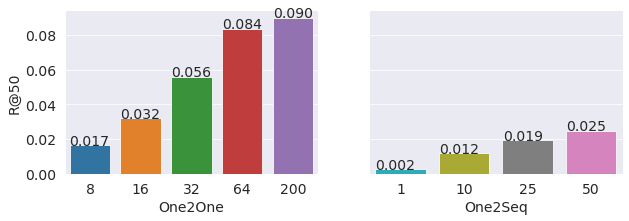

In [13]:
# plot One2One 
one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1']
one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000
one2one_df['beam_width'] = one2one_df['beam_width'].astype(int)
one2one_df = one2one_df.sort_values(by=['beam_width', 'step'], ascending=True)

for index_label, row_series in one2one_df.iterrows():
    one2one_df.at[index_label , 'exp_name'] = 'One2One-beam%s' % one2one_df.at[index_label , 'beam_width']

_, _, valid_one2one_df, _ = brief_eval_results(one2one_df, base_metric='absent_exact_recall@50') 

metric_names = ['absent_exact_recall@50']

datasets = valid_one2one_df.test_dataset.unique()
beam_widths = one2one_df.beam_width.unique()

bar_values = {beam_width: [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2one_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values[row_series.beam_width].append(float(bar_value))

avg_bar_values = {'Beam': [], 'R@50': [], 'model': []}
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    avg_bar_values['Beam'].append(int(k))
    avg_bar_values['R@50'].append(np.mean(_v))
    avg_bar_values['model'].append('RNN')
    

df = pd.DataFrame.from_dict(avg_bar_values)
# display(df)
'''
plt.figure(figsize=(5,6))
sns.set_palette("tab10", n_colors=10)
ax = sns.barplot(x="Beam", y="F@10", data=df)
ax.set_ylim(0, 0.3)
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() + 0.15, p.get_height() * 1.005))   
'''
import copy
rnn_one2one_absent_df = copy.copy(df)






# plot One2Seq
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']
one2seq_df['beam_width'] = one2seq_df['beam_width'].astype(int)
one2seq_df = one2seq_df.sort_values(by=['beam_width', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam

for index_label, row_series in one2seq_df.iterrows():
    one2seq_df.at[index_label , 'exp_name'] = 'One2Seq-beam%s' % one2seq_df.at[index_label , 'beam_width']

_, _, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='absent_exact_recall@50') 

# display(valid_one2seq_df)
metric_name = 'absent_exact_recall@50'

datasets = valid_one2seq_df.test_dataset.unique()
beam_widths = one2seq_df.beam_width.unique()

bar_values = {'%s' % (beam_width): [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    bar_value = row_series[metric_name]
    bar_values['%s' % (row_series.beam_width)].append(float(bar_value))

# print(bar_values)
avg_bar_values = {'Beam': [], 'R@50': [], 'model': []}
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    avg_bar_values['Beam'].append(int(k))
    avg_bar_values['R@50'].append(np.mean(_v))
    avg_bar_values['model'].append('RNN')

print(avg_bar_values)

df = pd.DataFrame.from_dict(avg_bar_values)
# display(df)
rnn_one2seq_absent_df = copy.copy(df)

'''
plt.figure(figsize=(4,6))
sns.set_palette("tab10_r", n_colors=10)

ax = sns.barplot(x="Beam", y="F@10", data=df)
ax.set_ylim(0, 0.3)
ax.set_yticklabels([])
ax.set_ylabel('')

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() + 0.15, p.get_height() * 1.005))   
# '''

sns.set_context("paper", rc={"font.size": 14,
                             "axes.titlesize": 14,
                             "axes.labelsize": 14,
                             "xtick.labelsize": 14,
                             "ytick.labelsize": 14,
                             "legend.fontsize": 12})

f, axes = plt.subplots(1, 2, figsize=(10, 3), sharey=True)
sns.set_palette("tab10", n_colors=10)
sns.barplot(x="Beam", y="R@50", data=rnn_one2one_absent_df, ax=axes[0])
# df1.plot.bar(ax=axes[0], legend=False, rot=0)
for p in axes[0].patches:
    axes[0].annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
axes[0].set_xlabel("One2One")

# df2.plot.bar(ax=axes[1], rot=0)
sns.set_palette("tab10_r", n_colors=10)
sns.barplot(x="Beam", y="R@50", data=rnn_one2seq_absent_df, ax=axes[1])
for p in axes[1].patches:
    axes[1].annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
axes[1].set_xlabel("One2Seq") 
axes[1].set_ylabel("")




#### Transformers

/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


{'Beam': [1, 10, 25, 50], 'R@50': [0.01326445780812537, 0.06125211421026306, 0.08131404633692148, 0.10118755119067635], 'model': ['TF', 'TF', 'TF', 'TF']}


Text(0, 0.5, '')

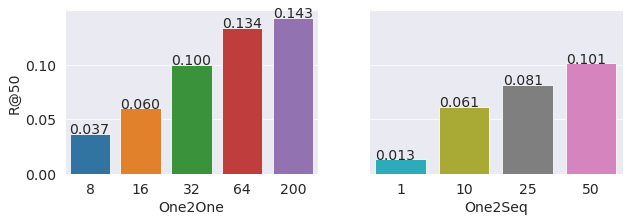

In [14]:
# plot One2One 
one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue']
one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000
one2one_df['beam_width'] = one2one_df['beam_width'].astype(int)
one2one_df = one2one_df.sort_values(by=['beam_width', 'step'], ascending=True)

for index_label, row_series in one2one_df.iterrows():
    one2one_df.at[index_label , 'exp_name'] = 'One2One-beam%s' % one2one_df.at[index_label , 'beam_width']

_, _, valid_one2one_df, _ = brief_eval_results(one2one_df, base_metric='absent_exact_recall@50') 

metric_names = ['absent_exact_recall@50']

datasets = valid_one2one_df.test_dataset.unique()
beam_widths = one2one_df.beam_width.unique()

bar_values = {beam_width: [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2one_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values[row_series.beam_width].append(float(bar_value))

avg_bar_values = {'Beam': [], 'R@50': [], 'model': []}
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    avg_bar_values['Beam'].append(int(k))
    avg_bar_values['R@50'].append(np.mean(_v))
    avg_bar_values['model'].append('TF')

df = pd.DataFrame.from_dict(avg_bar_values)
# display(df)
'''
plt.figure(figsize=(5,6))
sns.set_palette("tab10", n_colors=10)
ax = sns.barplot(x="Beam", y="F@10", data=df)
ax.set_ylim(0, 0.3)
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() + 0.15, p.get_height() * 1.005))   
'''
import copy
tf_one2one_absent_df = copy.copy(df)






# plot One2Seq
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue']
one2seq_df['beam_width'] = one2seq_df['beam_width'].astype(int)
one2seq_df = one2seq_df.sort_values(by=['beam_width', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam

for index_label, row_series in one2seq_df.iterrows():
    one2seq_df.at[index_label , 'exp_name'] = 'One2Seq-beam%s' % one2seq_df.at[index_label , 'beam_width']

_, _, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='absent_exact_recall@50') 

# display(valid_one2seq_df)
metric_name = 'absent_exact_recall@50'

datasets = valid_one2seq_df.test_dataset.unique()
beam_widths = one2seq_df.beam_width.unique()

bar_values = {'%s' % (beam_width): [] for beam_width in beam_widths for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    bar_value = row_series[metric_name]
    bar_values['%s' % (row_series.beam_width)].append(float(bar_value))

# print(bar_values)
avg_bar_values = {'Beam': [], 'R@50': [], 'model': []}
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    avg_bar_values['Beam'].append(int(k))
    avg_bar_values['R@50'].append(np.mean(_v))
    avg_bar_values['model'].append('TF')

print(avg_bar_values)

df = pd.DataFrame.from_dict(avg_bar_values)
# display(df)
tf_one2seq_absent_df = copy.copy(df)

'''
plt.figure(figsize=(4,6))
sns.set_palette("tab10_r", n_colors=10)

ax = sns.barplot(x="Beam", y="F@10", data=df)
ax.set_ylim(0, 0.3)
ax.set_yticklabels([])
ax.set_ylabel('')

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() + 0.15, p.get_height() * 1.005))   
# '''

sns.set_context("paper", rc={"font.size": 14,
                             "axes.titlesize": 14,
                             "axes.labelsize": 14,
                             "xtick.labelsize": 14,
                             "ytick.labelsize": 14,
                             "legend.fontsize": 12})

f, axes = plt.subplots(1, 2, figsize=(10, 3), sharey=True)
sns.set_palette("tab10", n_colors=10)
sns.barplot(x="Beam", y="R@50", data=tf_one2one_absent_df, ax=axes[0])
# df1.plot.bar(ax=axes[0], legend=False, rot=0)
for p in axes[0].patches:
    axes[0].annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
axes[0].set_xlabel("One2One")

# df2.plot.bar(ax=axes[1], rot=0)
sns.set_palette("tab10_r", n_colors=10)
sns.barplot(x="Beam", y="R@50", data=tf_one2seq_absent_df, ax=axes[1])
for p in axes[1].patches:
    axes[1].annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
axes[1].set_xlabel("One2Seq") 
axes[1].set_ylabel("")




### Combine all (used in paper)

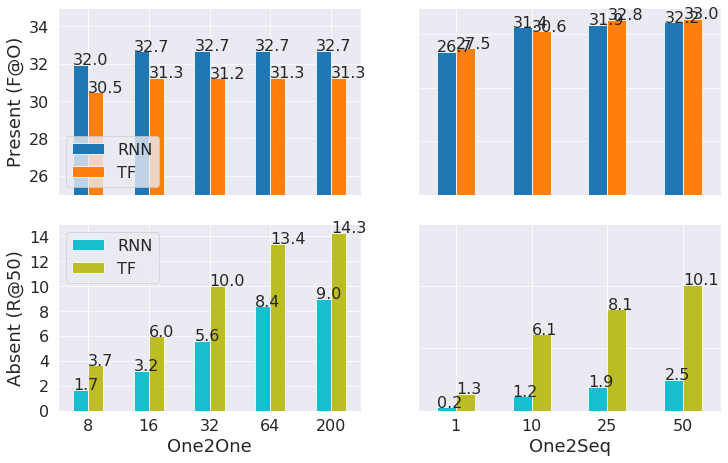

In [15]:
sns.set_context("paper", rc={"font.size": 16,
                             "axes.titlesize": 18,
                             "axes.labelsize": 18,
                             "xtick.labelsize": 16,
                             "ytick.labelsize": 16,
                             "legend.fontsize": 16})

sns.set_palette("tab10", n_colors=10)

f, axes = plt.subplots(2, 2, figsize=(10, 6), sharex=False, sharey=False)
f.tight_layout(pad=0.0)
model_names = ['RNN', 'TF']
one2one_beams = [8, 16, 32, 64, 200]
one2seq_beams = [1, 10, 25, 50]

# one2one_present
concat_df = pd.concat([rnn_one2one_present_df, tf_one2one_present_df], ignore_index=True, sort=False)
# display(one2one_present_df)
avg_bar_values = {model_name: [0.0]*len(one2one_beams) for model_name in model_names}
for index_label, row_series in concat_df.iterrows():   
    avg_bar_values[row_series.model][one2one_beams.index(row_series.Beam)] = float(row_series['F@O'])
concat_df = pd.DataFrame(avg_bar_values, index=one2one_beams)
concat_df = concat_df * 100.0
# display(one2one_present_df)
g = concat_df.plot.bar(ax=axes[0][0], legend=True, rot=0)

for p in axes[0][0].patches:
    axes[0][0].annotate('%.1f' % (p.get_height()), (p.get_x() + 0.001, p.get_height() + 0.005), rotation=0)   
axes[0][0].set_ylabel("Present (F@O)")
axes[0][0].legend(loc='lower left')
g.set_ylim(25, 35)
g.set(xticklabels=[])




# one2seq_present
concat_df = pd.concat([rnn_one2seq_present_df, tf_one2seq_present_df], ignore_index=True, sort=False)
avg_bar_values = {model_name: [0.0]*len(one2seq_beams) for model_name in model_names}
for index_label, row_series in concat_df.iterrows():   
    avg_bar_values[row_series.model][one2seq_beams.index(row_series.Beam)] = float(row_series['F@O'])
concat_df = pd.DataFrame(avg_bar_values, index=one2seq_beams)
concat_df = concat_df * 100.0
g = concat_df.plot.bar(ax=axes[0][1], legend=False, rot=0)

for p in axes[0][1].patches:
    axes[0][1].annotate('%.1f' % (p.get_height()), (p.get_x() + 0.001, p.get_height() + 0.01), rotation=0)   
g.set_ylim(0, 35)
g.set(yticklabels=[])
# g.set(yticks=[])
g.set(xticklabels=[])
g.set(ylabel=None)




sns.set_palette("tab10_r", n_colors=10)
# one2one_absent
concat_df = pd.concat([rnn_one2one_absent_df, tf_one2one_absent_df], ignore_index=True, sort=False)
avg_bar_values = {model_name: [0.0]*len(one2one_beams) for model_name in model_names}
for index_label, row_series in concat_df.iterrows():   
    avg_bar_values[row_series.model][one2one_beams.index(row_series.Beam)] = float(row_series['R@50'])
concat_df = pd.DataFrame(avg_bar_values, index=one2one_beams)
concat_df = concat_df * 100.0
g = concat_df.plot.bar(ax=axes[1][0], legend=False, rot=0)

for p in axes[1][0].patches:
    axes[1][0].annotate('%.1f' % (p.get_height()), (p.get_x() + 0.001, p.get_height() + 0.005), rotation=0)   
axes[1][0].set_ylabel("Absent (R@50)")
axes[1][0].set_xlabel("One2One")
axes[1][0].legend(loc='upper left')
g.set_ylim(0, 15)





# one2seq_absent
concat_df = pd.concat([rnn_one2seq_absent_df, tf_one2seq_absent_df], ignore_index=True, sort=False)
avg_bar_values = {model_name: [0.0]*len(one2seq_beams) for model_name in model_names}
for index_label, row_series in concat_df.iterrows():   
    avg_bar_values[row_series.model][one2seq_beams.index(row_series.Beam)] = float(row_series['R@50'])
concat_df = pd.DataFrame(avg_bar_values, index=one2seq_beams)
concat_df = concat_df * 100.0
g = concat_df.plot.bar(ax=axes[1][1], legend=False, rot=0)

for p in axes[1][1].patches:
    axes[1][1].annotate('%.1f' % (p.get_height()), (p.get_x() + 0.001, p.get_height() + 0.01), rotation=0)   
# axes[1][1].set_ylabel("One2Seq Absent (R@50)")
axes[1][1].set_xlabel("One2Seq")
g.set(yticklabels=[])
# g.set(yticks=[])
# g.set(ylabel=None)
g.set_ylim(0, 15)


from matplotlib.ticker import MaxNLocator
axes[1][0].yaxis.set_major_locator(MaxNLocator(integer=True))

## Effect of Architecture

In [51]:
all_eval_df.exp_name.unique()

array(['magkp-meng17-random-transformer-BS4096-LR0.5-Layer2-Heads4-Dim128-Emb128-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEtrue-Contextboth-IF1',
       'kp20k-meng17-random-transformer-BS4096-LR0.5-Layer4-Heads8-Dim512-Emb512-Dropout0.2-Copytrue-Reusetrue-Covtrue-PEtrue-Contextboth-IF1',
       'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.5-Layer4-Heads8-Dim512-Emb512-Dropout0.2-Copytrue-Reusetrue-Covtrue-PEtrue-Contextboth-IF1',
       'kp20k-meng17-alphabetical-rnn-BS64-LR0.05-Layer1-Dim512-Emb128-Dropout0.3-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1',
       'kp20k-meng17-alphabetical-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusefalse-Covfalse-PEfalse-Contboth-IF1',
       'kp20k-meng17-length-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusefalse-Covfalse-PEfalse-Contboth-IF1',
       'magkp-meng17-alphabetical-transformer-BS4096-LR0.5-Layer2-Heads4-Dim128-Emb128-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEtrue-Contextboth-IF1',
       'kp20k-m

#### One2One

kp20k-meng17-one2one-BS128-LR0.05-L1-D150-E100-DO0.0-Copyfalse-Covfalse - [7]['kp20k_valid2k' 'nus' 'semeval' 'kp20k' 'inspec' 'duc' 'krapivin']
(280, 121)
kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1 - [7]['semeval' 'kp20k_valid2k' 'krapivin' 'inspec' 'duc' 'nus' 'kp20k']
(911, 121)
kp20k-meng17-one2one-BS128-LR0.05-L1-D150-E100-DO0.0-Copyfalse-Covfalse - present_exact_f_score_hard@10 = 7
kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1 - present_exact_f_score_hard@10 = 7
['duc' 'inspec' 'kp20k' 'kp20k_valid2k' 'krapivin' 'nus' 'semeval'
 'Average']
{'kp20k-meng17-one2one-BS128-LR0.05-L1-D150-E100-DO0.0-Copyfalse-Covfalse - present_exact_f_score_hard@10': [0.00032467532467532473, 0.04039430353823858, 0.06842784980073414, 0.06873645721741518, 0.04685716433495115, 0.10031317913118709, 0.07364274609978945, 0.05695662506385585], 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb

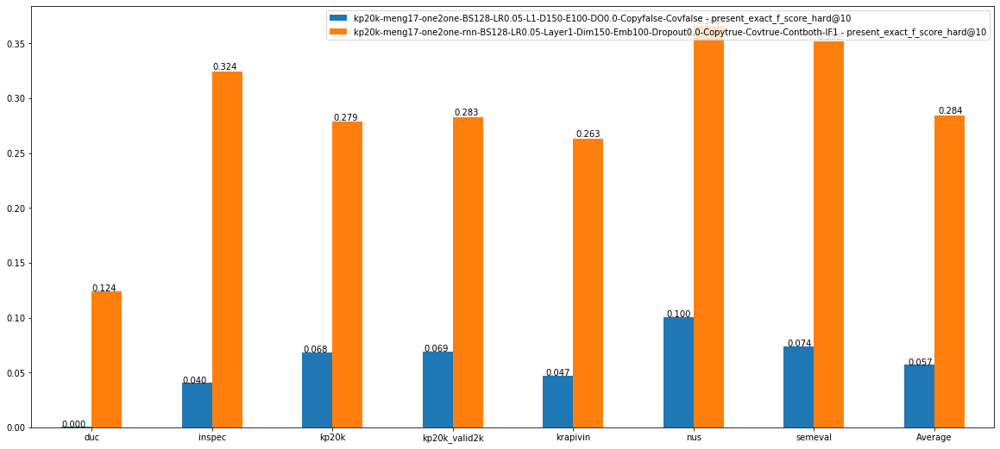

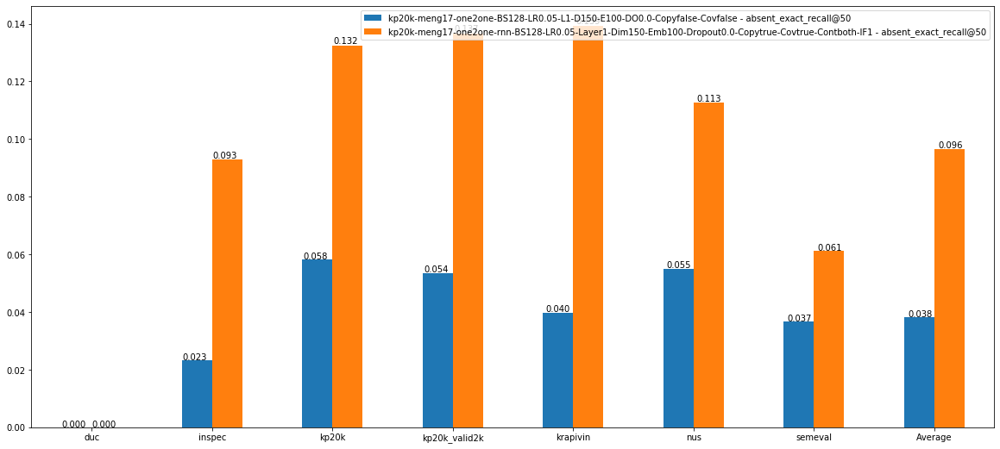

In [46]:
one2one_exps = [
#                 'kp20k-meng17-one2one-rnn-BS128-Layer1-Dim100-Emb100-Dropout0.0-Copytrue-Covfalse-Contboth-IF1',
#                 'kp20k-meng17-one2one-rnn-BS128-Layer1-Dim100-Emb100-Dropout0.25-Copytrue-Covtrue-Contboth-IF1',
#                 'kp20k-meng17-one2one-rnn-BS128-Layer1-Dim100-Emb100-Dropout0.5-Copytrue-Covtrue-Contboth-IF1',

#                 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1',
# #                 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covfalse-Contboth-IF1',
#                 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.25-Copytrue-Covtrue-Contboth-IF1',
    
# This is baseline
# 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1'
    
'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1',
'kp20k-meng17-one2one-BS128-LR0.05-L1-D150-E100-DO0.0-Copyfalse-Covfalse',
    
'kp20k-meng17-one2one-rnn-BS128-Layer1-Dim100-Emb100-Dropout0.0-Copytrue-Covfalse-Contboth-IF1',
'kp20k-meng17-one2one-rnn-BS128-Layer1-Dim100-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1',
# 'kp20k-meng17-one2one-rnn-BS128-Layer1-Dim100-Emb100-Dropout0.25-Copytrue-Covtrue-Contboth-IF1',
# 'kp20k-meng17-one2one-rnn-BS128-Layer1-Dim100-Emb100-Dropout0.5-Copytrue-Covtrue-Contboth-IF1',

# 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copyfalse-Covfalse-Contboth-IF1', # does not exist
'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covfalse-Contboth-IF1',
# 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.25-Copytrue-Covtrue-Contboth-IF1',
'kp20k-meng17-one2one-BS128-LR0.05-L1-H8-D512-E128-DO0.1-Copytrue',

'kp20k-meng17-one2one-transformer-BS4096-LR0.05-L2-H4-D128-E128-DO0.1-Copytrue',
# 'kp20k-meng17-one2one-transformer-BS4096-LR0.05-L4-H8-D128-E128-DO0.1-Copytrue',
'kp20k-meng17-one2one-transformer-BS4096-LR0.05-L4-H8-D512-E512-DO0.1-Copytrue',
'kp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue'
               ]

one2one_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2one_exps)]


for exp_name, exp_group in one2one_df.groupby('exp_name'):
    datasets = exp_group.test_dataset.unique()
    print('%s - [%d]%s' % (exp_name, len(datasets), datasets))
    print(exp_group.shape)


one2one_df = one2one_df.sort_values(by='step', ascending=True)
one2one_df = one2one_df.loc[one2one_df.step % 10000 == 0] # keep % 10000
one2one_df = one2one_df.loc[one2one_df.beam_width == '200']
# remove kp20k because we didn't run it for other exps
# one2one_df = one2one_df.loc[one2one_df.test_dataset != 'kp20k']

for index_label, row_series in one2one_df.iterrows():
    one2one_df.at[index_label , 'exp_name'] = '%s' % (one2one_df.at[index_label , 'exp_name'])

_, peak_one2one_df, valid_one2one_df = brief_eval_results(one2one_df, base_metric='present_exact_f_score_hard@10')

# ensure the dataframe is sorted first
# display(peak_one2one_df)
# print(peak_one2one_df.shape)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10']
metric_names = ['present_exact_f_score_hard@10']

datasets = valid_one2one_df.test_dataset.unique()
exp_names = valid_one2one_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_one2one_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

for k,v in bar_values.items():
    print('%s = %d' % (k, len(v)))
    
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')


print(datasets)
print(bar_values)
for k,v in bar_values.items():
    print('%s = %d' % (k, len(v)))
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   

    
    
###### Absent 
_, peak_one2one_df, valid_one2one_df = brief_eval_results(one2one_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
# display(peak_one2one_df)
# print(peak_one2one_df.shape)

metric_names = ['absent_exact_recall@50']

datasets = valid_one2one_df.test_dataset.unique()
exp_names = valid_one2one_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_one2one_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

for k,v in bar_values.items():
    print('%s = %d' % (k, len(v)))
    
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')


print(datasets)
print(bar_values)
for k,v in bar_values.items():
    print('%s = %d' % (k, len(v)))
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


#### One2Seq

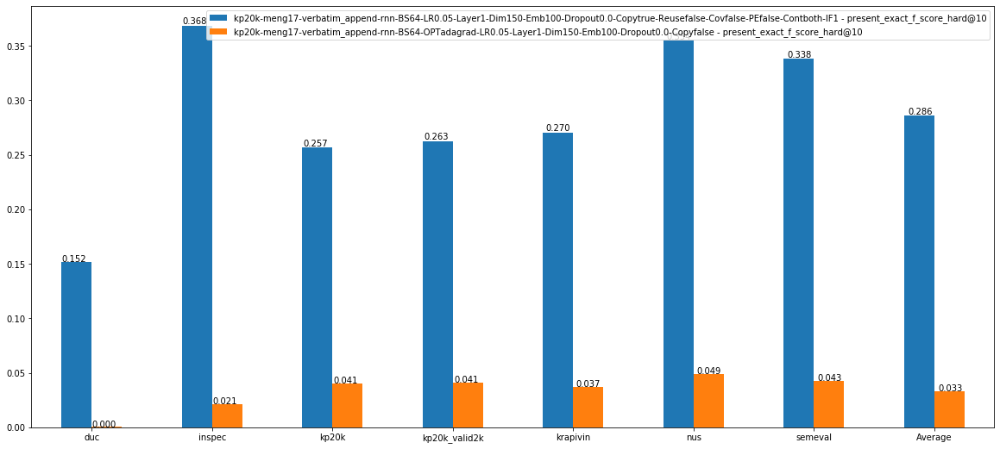

In [48]:
one2seq_exps = [
# this is baseline setting
# 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1'
    
'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copyfalse',
'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusefalse-Covfalse-PEfalse-Contboth-IF1',
   
'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1',

'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue',
'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.1-Copytrue',
'kp20k-meng17-verbatim_append-rnn-BS64-LR0.002-Layer1-Dim512-Emb128-Dropout0.1-Copytrue',

'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L2-H4-Dim128-Emb128-Dropout0.1-Copytrue',
'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L4-H8-Dim512-Emb512-Dropout0.1-Copytrue',
'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue',

]

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.loc[one2seq_df.step % 10000 == 0] # keep % 10000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'topbeamends'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating


# for exp_name, exp_group in one2seq_df.groupby('exp_name'):
#     datasets = exp_group.test_dataset.unique()
#     print('%s - [%d]%s' % (exp_name, len(datasets), datasets))
#     print(exp_group.shape)


_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_f_score_hard@10')

# ensure the dataframe is sorted first
# print(peak_one2seq_df.shape)
# display(peak_one2seq_df)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10']
metric_names = ['present_exact_f_score_hard@10']


datasets = valid_one2seq_df.test_dataset.unique()
exp_names = valid_one2seq_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    

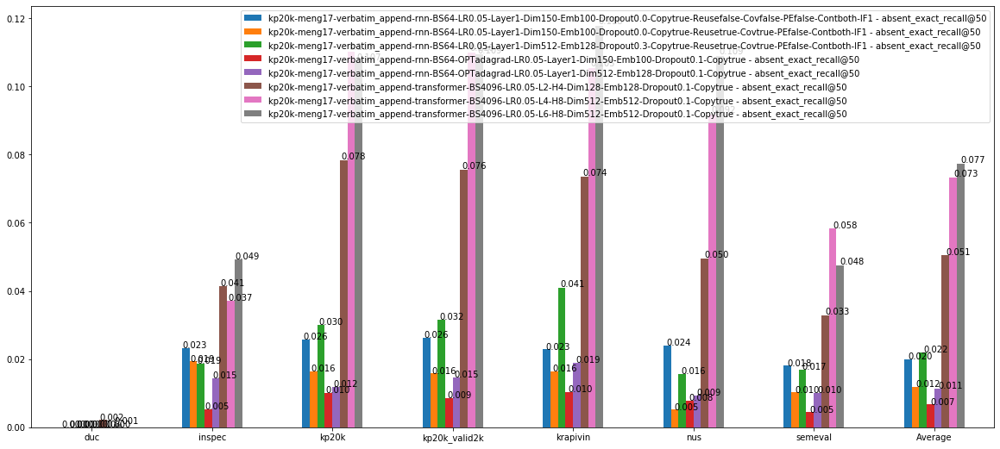

In [46]:
###### absent

one2seq_exps = [
'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusefalse-Covfalse-PEfalse-Contboth-IF1',
'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1',
'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim512-Emb128-Dropout0.3-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1',

# 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.002-Layer1-Dim150-Emb100-Dropout0.1-Copytrue',
'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue',
'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.1-Copytrue',
# 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.002-Layer1-Dim512-Emb128-Dropout0.1-Copytrue',

'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L2-H4-Dim128-Emb128-Dropout0.1-Copytrue',
'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L4-H8-Dim512-Emb512-Dropout0.1-Copytrue',
# 'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.5-Layer4-Heads8-Dim512-Emb512-Dropout0.2-Copytrue-Reusetrue-Covtrue-PEtrue-Contextboth-IF1',
'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue',

]

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.loc[one2seq_df.step % 10000 == 0] # keep % 10000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'topbeamends'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
# print(valid_one2seq_df.shape)
# display(valid_one2seq_df)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10']
metric_names = ['absent_exact_recall@50']


datasets = valid_one2seq_df.test_dataset.unique()
exp_names = valid_one2seq_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    

## Effect of More Data

### For One2One

kp20k-meng17-one2one-BS128-LR0.05-L1-H8-D512-E128-DO0.1-Copytrue - shape=(7, 121) - testset: [7]['duc' 'inspec' 'kp20k' 'kp20k_valid2k' 'krapivin' 'nus' 'semeval']
kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1 - shape=(7, 121) - testset: [7]['duc' 'inspec' 'kp20k' 'kp20k_valid2k' 'krapivin' 'nus' 'semeval']
kp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue - shape=(7, 121) - testset: [7]['duc' 'inspec' 'kp20k' 'kp20k_valid2k' 'krapivin' 'nus' 'semeval']
magkp20k-meng17-one2one-BS128-LR0.05-L1-D512-E128-DO0.1-Copytrue - shape=(7, 121) - testset: [7]['duc' 'inspec' 'kp20k' 'kp20k_valid2k' 'krapivin' 'nus' 'semeval']
magkp20k-meng17-one2one-BS128-LR0.05-L1-H-D150-E100-DO0.0-Copytrue - shape=(7, 121) - testset: [7]['duc' 'inspec' 'kp20k' 'kp20k_valid2k' 'krapivin' 'nus' 'semeval']
magkp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue - shape=(7, 121) - testset: [7]['duc' 'inspec' 'k

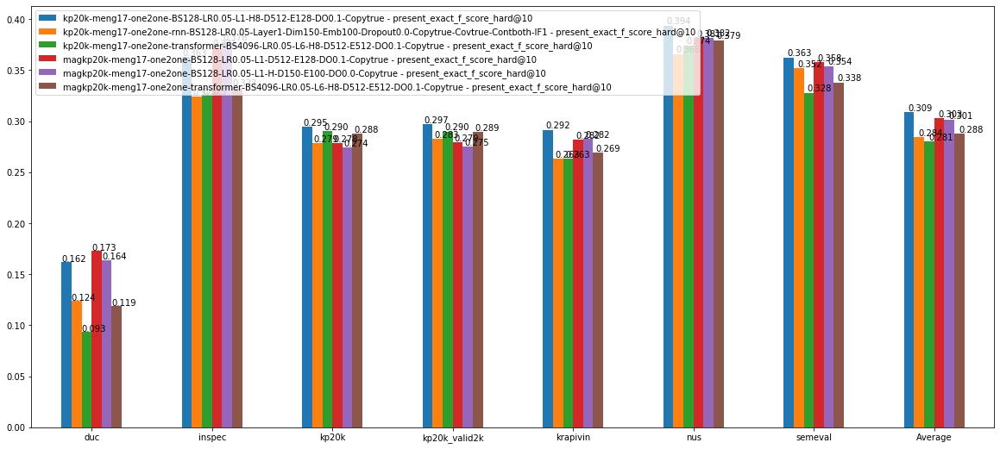

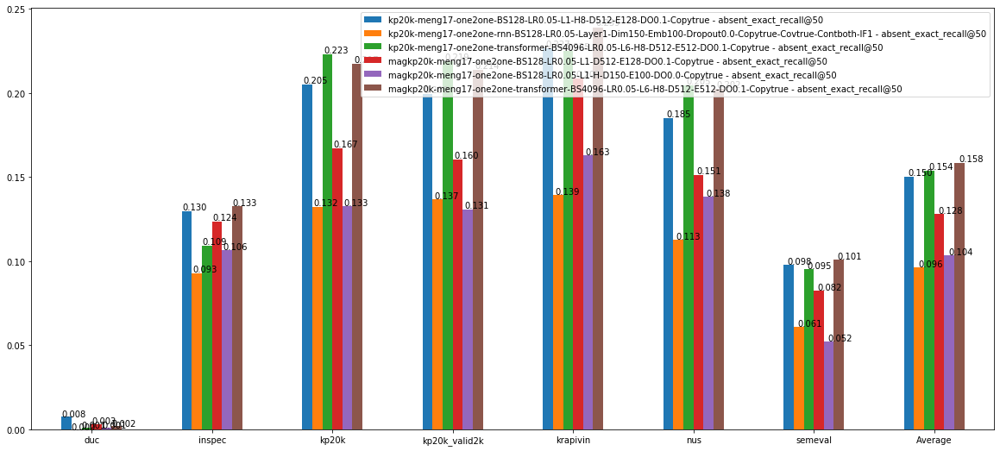

In [9]:
one2one_exps = [
# This is baseline
# 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1'

# 'kp20k-meng17-one2one-rnn-BS128-Layer1-Dim100-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1',
# 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1',
'kp20k-meng17-one2one-BS128-LR0.05-L1-H8-D512-E128-DO0.1-Copytrue',

# 'kp20k-meng17-one2one-transformer-BS4096-LR0.05-L2-H4-D128-E128-DO0.1-Copytrue',
# 'kp20k-meng17-one2one-transformer-BS4096-LR0.05-L4-H8-D512-E512-DO0.1-Copytrue',
# 'kp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue',
    

# 'magkp-meng17-one2one-BS128-LR0.002-L1-H-D150-E100-DO0.0-Copytrue',
# 'magkp-meng17-one2one-BS128-LR0.002-L1-H-D150-E100-DO0.1-Copytrue',
# 'magkp-meng17-one2one-BS128-OPTadagrad-LR0.05-L1-H-D150-E100-DO0.0-Copytrue',
# 'magkp-meng17-one2one-transformer-BS4096-Layer2-Heads4-Dim128-Emb128-Dropout0.1-Copyfalse-Covfalse-Contextboth-IF1',
# 'magkp-meng17-one2one-transformer-BS4096-Layer2-Heads4-Dim128-Emb128-Dropout0.1-Copytrue-Covfalse-Contextboth-IF1',
# 'magkp-meng17-one2one-transformer-BS4096-Layer2-Heads4-Dim128-Emb128-Dropout0.1-Copytrue-Covtrue-Contextboth-IF1',
# 'magkp-meng17-one2one-transformer-BS4096-Layer4-Heads8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue-Contextboth-IF1',
# still running'magkp-meng17-one2one-transformer-BS4096-Layer6-Heads8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue-Contextboth-IF1',

# 'magkp20k-meng17-one2one-BS128-LR0.05-L1-H-D150-E100-DO0.0-Copytrue',
'magkp20k-meng17-one2one-BS128-LR0.05-L1-D512-E128-DO0.1-Copytrue',
# 'magkp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue',

# no kp20k
# 'magkp-meng17-one2one-transformer-BS4096-Layer2-Heads4-Dim128-Emb128-Dropout0.0-Copytrue-Covtrue-Contextboth-IF1',
# 'magkp-meng17-one2one-transformer-BS4096-Layer2-Heads4-Dim128-Emb128-Dropout0.5-Copytrue-Covtrue-Contextboth-IF1',
# 'magkp-meng17-one2one-transformer-BS4096-Layer4-Heads8-Dim128-Emb128-Dropout0.1-Copytrue-Covtrue-Contextboth-IF1',
]

one2one_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2one_exps)]
one2one_df = one2one_df.sort_values(by='step', ascending=True)
one2one_df = one2one_df.loc[one2one_df.step % 10000 == 0] # keep % 10000
one2one_df = one2one_df.loc[one2one_df.beam_width == '200']
# remove kp20k because we didn't run it for other exps
# one2one_df = one2one_df.loc[one2one_df.test_dataset != 'kp20k']

# we have previous .eval files that @M is NaN
# one2one_df.drop_duplicates(keep=False,inplace=True) 
one2one_df = one2one_df.loc[one2one_df['present_exact_f_score@M'].notna()]


# for exp_name, exp_group in one2one_df.groupby('exp_name'):
#     datasets = exp_group.test_dataset.unique()
#     print('%s - [%d]%s' % (exp_name, len(datasets), datasets))


for index_label, row_series in one2one_df.iterrows():
    one2one_df.at[index_label , 'exp_name'] = '%s' % (one2one_df.at[index_label , 'exp_name'])

_, peak_one2one_df, valid_one2one_df = brief_eval_results(one2one_df, base_metric='present_exact_f_score_hard@10')

for exp_name, exp_group in valid_one2one_df.groupby('exp_name'):
    datasets = exp_group.test_dataset.unique()
    print('%s - shape=%s - testset: [%d]%s' % (exp_name, exp_group.shape, len(datasets), datasets))

# ensure the dataframe is sorted first
# display(peak_one2one_df)
# print(peak_one2one_df.shape)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10']
metric_names = ['present_exact_f_score_hard@10']

datasets = valid_one2one_df.test_dataset.unique()
exp_names = valid_one2one_df.exp_name.unique()

# print(datasets)
# print(exp_names)
# display(peak_one2one_df.loc[peak_one2one_df['exp_name'] == 'magkp-meng17-one2one-transformer-BS4096-Layer2-Heads4-Dim128-Emb128-Dropout0.1-Copytrue-Covtrue-Contextboth-IF1'])

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_one2one_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

for k,v in bar_values.items():
    print('%s = %d' % (k, len(v)))
    
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')


print(datasets)
print(bar_values)
for k,v in bar_values.items():
    print('%s = %d' % (k, len(v)))
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   

    
    
###### Absent 
_, peak_one2one_df, valid_one2one_df = brief_eval_results(one2one_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
# display(peak_one2one_df)
# print(peak_one2one_df.shape)

metric_names = ['absent_exact_recall@50']

datasets = valid_one2one_df.test_dataset.unique()
exp_names = valid_one2one_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_one2one_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

for k,v in bar_values.items():
    print('%s = %d' % (k, len(v)))
    
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')


print(datasets)
print(bar_values)
for k,v in bar_values.items():
    print('%s = %d' % (k, len(v)))
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


### For One2Seq

    - On MagKP, all performance drops by large margin.

kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1 - present_exact_f_score_hard@10 = 7
kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue - present_exact_f_score_hard@10 = 7
kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue - present_exact_f_score_hard@10 = 7
magkp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue - present_exact_f_score_hard@10 = 7
magkp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue-Covtrue - present_exact_f_score_hard@10 = 7
magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue - present_exact_f_score_hard@10 = 7
['duc' 'inspec' 'kp20k' 'kp20k_valid2k' 'krapivin' 'nus' 'semeval'
 'Average']
{'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-

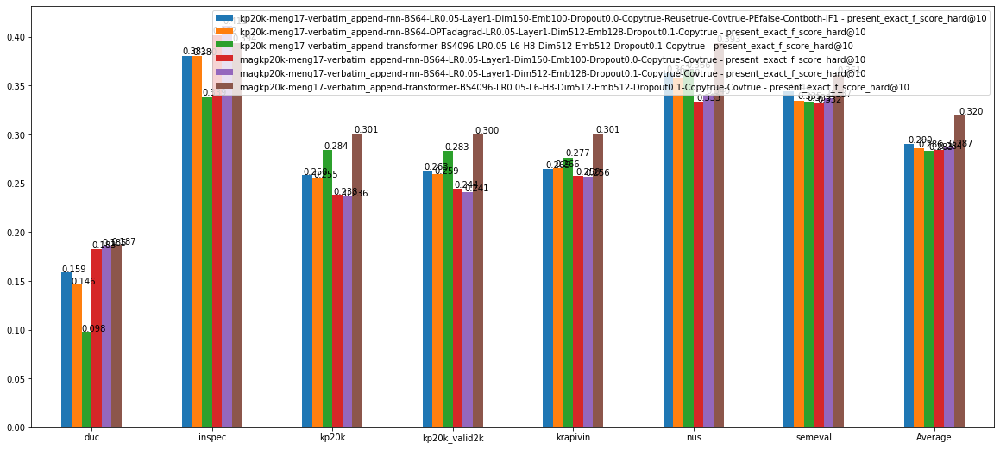

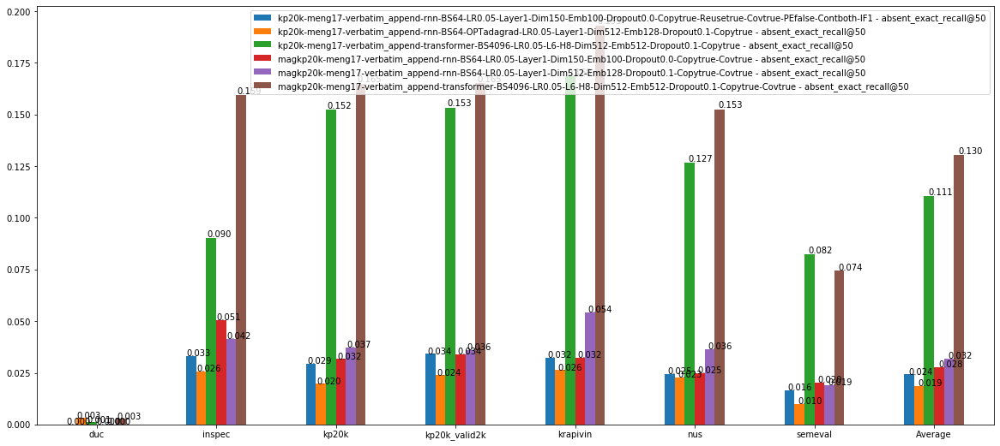

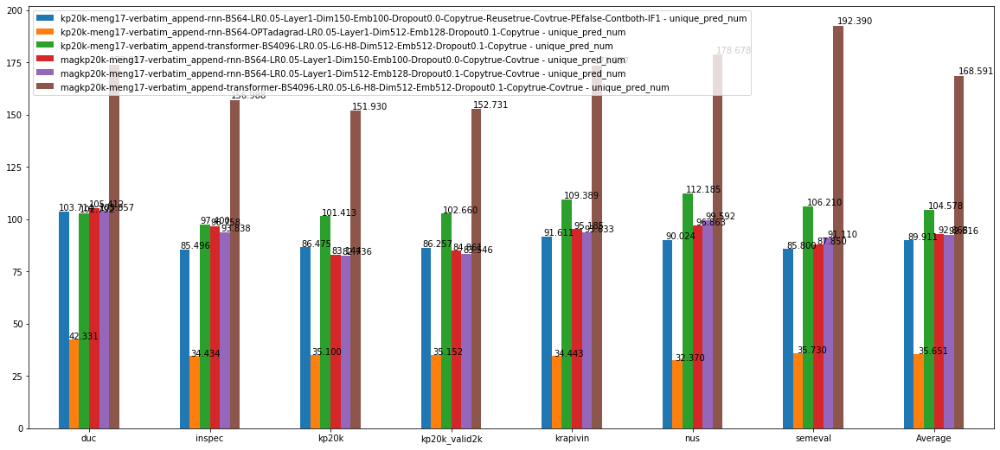

In [42]:
# Compare baseline One2Seq RNN model on different training data

one2seq_exps = [
                'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
#                 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.002-Layer1-Dim150-Emb100-Dropout0.1-Copytrue',
#                 'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.1-Copytrue',

                'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue',
#                 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.002-Layer1-Dim512-Emb128-Dropout0.1-Copytrue',
#                 'kp20k-meng17-verbatim_append-rnn-BS64-OPT-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue-Covtrue',
                
                'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue',

                'magkp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
                'magkp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue-Covtrue',
                'magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
               ]
'''
                # kp20k
                'kp20k-meng17-verbatim_append-rnn-BS64-LR0.002-Layer1-Dim150-Emb100-Dropout0.1-Copytrue',
                'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.1-Copytrue',

                'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue',
                'kp20k-meng17-verbatim_append-rnn-BS64-LR0.002-Layer1-Dim512-Emb128-Dropout0.1-Copytrue',
                'kp20k-meng17-verbatim_append-rnn-BS64-OPT-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue-Covtrue',
                # N/A 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim512-Emb128-Dropout0.3-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1',

                'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L2-H4-Dim128-Emb128-Dropout0.1-Copytrue',
                'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L4-H8-Dim512-Emb512-Dropout0.1-Copytrue',
                # 'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.5-Layer4-Heads8-Dim512-Emb512-Dropout0.2-Copytrue-Reusetrue-Covtrue-PEtrue-Contextboth-IF1',
#                 'magkp-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.1-Copytrue',
'''

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.002-Layer1-Dim512-Emb128-Dropout0.1-Copytrue']
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'magkp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue']

one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 10000 == 0] # keep % 10000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

# display(one2seq_df)
# print(one2seq_df.shape)
# for index_label, row_series in one2seq_df.iterrows():
#     one2seq_df.at[index_label , 'exp_name'] = '%s-%s' % (one2seq_df.at[index_label , 'decoding_terminate'], one2seq_df.at[index_label , 'exp_name'])

_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_f_score_hard@10')

# for exp_name, exp_group in valid_one2seq_df.groupby('exp_name'):
#     datasets = exp_group.test_dataset.unique()
#     print('%s - shape=%s - testset: [%d]%s' % (exp_name, exp_group.shape, len(datasets), datasets))

# ensure the dataframe is sorted first
# display(valid_one2seq_df)
# print(valid_one2seq_df.shape)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
metric_names = ['present_exact_f_score_hard@10']

exp_names = valid_one2seq_df.exp_name.unique()
datasets = valid_one2seq_df.test_dataset.unique()
train_datasets = valid_one2seq_df.train_dataset.unique()
bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

for k,v in bar_values.items():
    print('%s = %d' % (k, len(v)))
    
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')


print(datasets)
print(bar_values)
for k,v in bar_values.items():
    print('%s = %d' % (k, len(v)))
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


######### Absent prediction
_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
# display(peak_one2seq_df)
# print(peak_one2seq_df.shape)
# display(peak_one2seq_df)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
metric_names = ['absent_exact_recall@50']

exp_names = valid_one2seq_df.exp_name.unique()
datasets = valid_one2seq_df.test_dataset.unique()
train_datasets = valid_one2seq_df.train_dataset.unique()
bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    
    
    


######### pred numbers
_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='absent_exact_recall@50')
metric_names = ['unique_pred_num', 'present_pred_num', 'absent_pred_num']
metric_names = ['unique_pred_num']

exp_names = valid_one2seq_df.exp_name.unique()
datasets = valid_one2seq_df.test_dataset.unique()
train_datasets = valid_one2seq_df.train_dataset.unique()
bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    

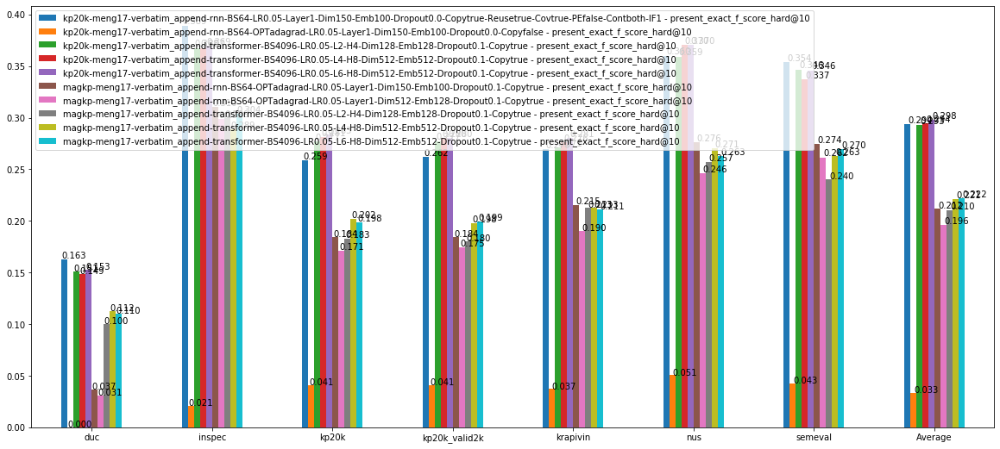

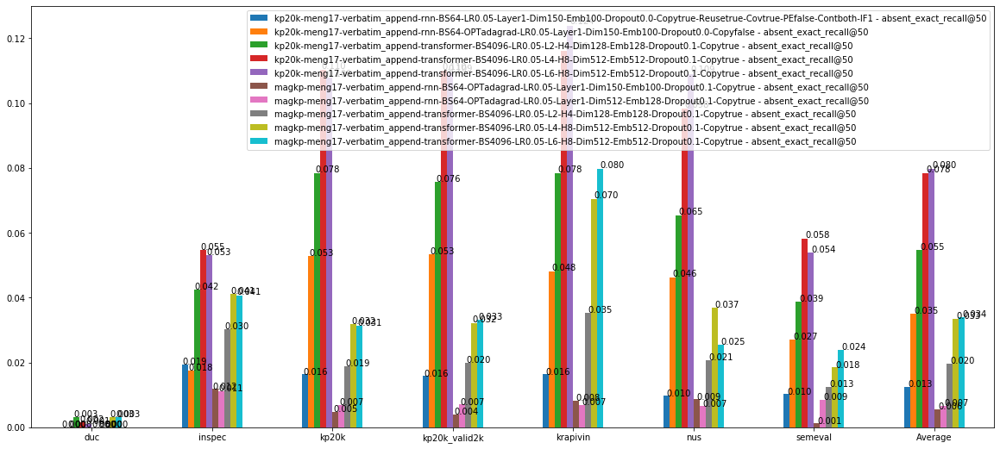

In [13]:
# 2. Compare different architecture variants

one2seq_exps = [
    
'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
               
'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L2-H4-Dim128-Emb128-Dropout0.1-Copytrue',
'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L4-H8-Dim512-Emb512-Dropout0.1-Copytrue',
# 'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.5-Layer4-Heads8-Dim512-Emb512-Dropout0.2-Copytrue-Reusetrue-Covtrue-PEtrue-Contextboth-IF1',
'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue',

'magkp-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue',
'magkp-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.1-Copytrue',

# 'magkp-meng17-verbatim_append-transformer-BS4096-LR0.5-Layer2-Heads4-Dim128-Emb128-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEtrue-Contextboth-IF1',
'magkp-meng17-verbatim_append-transformer-BS4096-LR0.05-L2-H4-Dim128-Emb128-Dropout0.1-Copytrue',

'magkp-meng17-verbatim_append-transformer-BS4096-LR0.05-L4-H8-Dim512-Emb512-Dropout0.1-Copytrue',
'magkp-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue',
]

# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.loc[one2seq_df.step % 10000 == 0] # keep % 10000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'topbeamends'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_f_score_hard@10')

# ensure the dataframe is sorted first
# print(peak_one2seq_df.shape)
# display(peak_one2seq_df)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10']
metric_names = ['present_exact_f_score_hard@10']


datasets = valid_one2seq_df.test_dataset.unique()
exp_names = valid_one2seq_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
    
    
    
############## absent
_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='absent_exact_recall@50', ignore_valid=True)

# ensure the dataframe is sorted first
# print(peak_one2seq_df.shape)
# display(peak_one2seq_df)

# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 'present_exact_f_score_hard@M']
# metric_names = ['present_exact_f_score_hard@5', 'present_exact_f_score_hard@10']
metric_names = ['absent_exact_recall@50']


datasets = valid_one2seq_df.test_dataset.unique()
exp_names = valid_one2seq_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_one2seq_df.iterrows():
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  

## V3: more Transformers+MagKP exps

In [151]:
[name for name in all_eval_df['exp_name'].unique() if name.startswith('kpgen-')]

['kpgen-meng17-kp20k-no_sort_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
 'kpgen-meng17-kp20k-length_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
 'kpgen-meng17-kp20k-length_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
 'kpgen-meng17-kp20k-alphabetical_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
 'kpgen-meng17-kp20k-no_sort_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
 'kpgen-meng17-kp20k-alphabetical_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
 'kpgen-meng17-MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
 'kpgen-meng17-MagKP_LN+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
 'kpgen-meng17-

In [14]:
one2one_eval_df = all_eval_df.loc[all_eval_df['train_mode'] == 'one2one']
print(one2one_eval_df.shape)
print(one2one_eval_df.exp_name.value_counts())
print(one2one_eval_df.exp_group.value_counts())

(7634, 121)
kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1                  911
kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse          420
kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue            420
kpgen-meng17-magkp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue         420
kpgen-meng17-magkp-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue            420
kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.25-Copytrue-Covtrue-Contboth-IF1                 351
kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covfalse-Contboth-IF1                 313
kp20k-meng17-one2one-rnn-BS128-Layer1-Dim100-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1                         312
kp20k-meng17-one2one

### One2One

All data
(420, 121)
present valid_kp_df
(21, 121)
All data
(420, 121)
absent valid_kp_df


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


(21, 121)


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


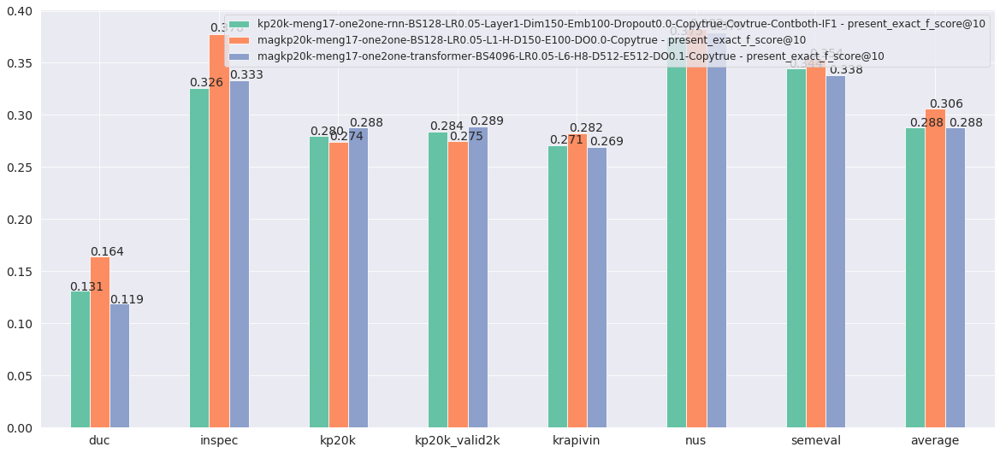

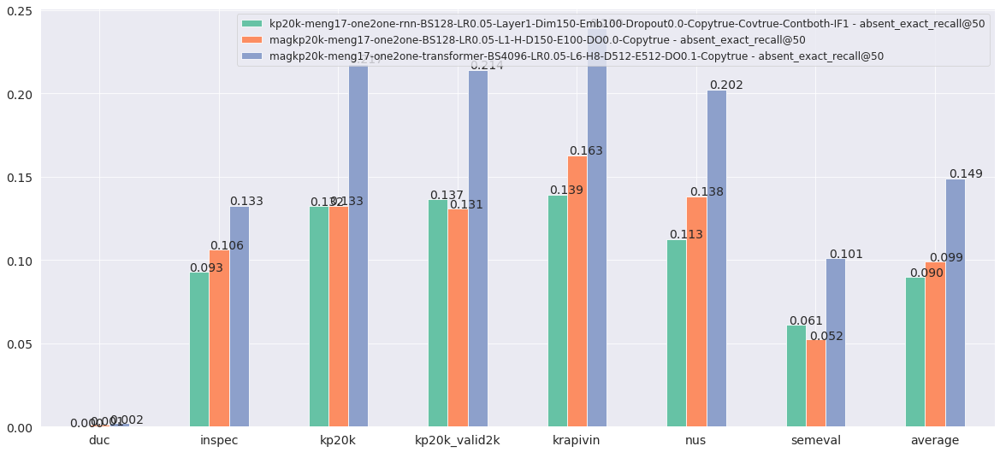

In [131]:
# 2. Compare different architecture variants


kp_exps = [
    'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1',
    'magkp20k-meng17-one2one-BS128-LR0.05-L1-H-D150-E100-DO0.0-Copytrue',
    'magkp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue',
    
#     'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',
#     'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'kpgen-meng17-magkp-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
#     'kpgen-meng17-magkp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue'
]


# prepare one2one data
kp_df = all_eval_df.loc[all_eval_df['exp_name'].isin(kp_exps)]
kp_df = kp_df.loc[(kp_df.step % 10000 == 6000) | (kp_df.step % 5000 == 0)]
kp_df = kp_df.sort_values(by='step', ascending=True)
kp_df = kp_df.loc[kp_df.beam_width == '200']
kp_df = kp_df.loc[kp_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
kp_df = kp_df.loc[kp_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

print('All data')
print(kp_df.shape)

print('present valid_kp_df')
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@10')
print(valid_kp_df.shape)
# display(valid_kp_df)


metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
metric_names = ['present_exact_f_score@10']
datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
    

pd.options.display.float_format = '{:,.1f}'.format
with pd.option_context('display.max_colwidth', 100, 'display.max_rows', None):
    value_cols = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
    tmp_df = valid_kp_df[['exp_name', 'model_base', 'test_dataset'] + value_cols]
    for col in value_cols:
        tmp_df[col] = tmp_df[col].map(lambda v: v * 100.0)

#     tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
#     display(tmp_df)
    df_list = []
    for exp in kp_exps:
        for i in ordered_datasets:
            df_list.append(tmp_df[(tmp_df['exp_name']==exp) & (tmp_df['test_dataset']==i)])
    ordered_df = pd.concat(df_list)
    tmp_df = ordered_df[value_cols]
#     display(ordered_df)
#     print(tmp_df.to_latex(index=False))
    

############## absent
print('All data')
print(kp_df.shape)
print('absent valid_kp_df')
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
print(valid_kp_df.shape)
# display(valid_kp_df)

# metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50', 'absent_exact_advanced_sadr']
metric_names = ['absent_exact_recall@50']

datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_kp_df.iterrows():
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
# display(df.transpose())

    
pd.options.display.float_format = '{:,.1f}'.format
with pd.option_context('display.max_colwidth', 100, 'display.max_rows', None):
    value_cols = ['absent_exact_recall@10', 'absent_exact_recall@50']
    tmp_df = valid_kp_df[['exp_name', 'model_base', 'test_dataset'] + value_cols]
    for col in value_cols:
        tmp_df[col] = tmp_df[col].map(lambda v: v * 100.0)

#     tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
    df_list = []
    for exp in kp_exps:
        for i in ordered_datasets:
            df_list.append(tmp_df[(tmp_df['exp_name']==exp) & (tmp_df['test_dataset']==i)])
    ordered_df = pd.concat(df_list)
    tmp_df = ordered_df[value_cols]

#     display(ordered_df)
#     print(tmp_df.to_latex(index=False))


### One2Seq Transformer Order Matters?

In [12]:
one2seq_eval_df = all_eval_df.loc[all_eval_df['train_mode'] == 'one2seq']
print(one2seq_eval_df.shape)
print(one2seq_eval_df.exp_name.value_counts())
print(one2seq_eval_df.exp_group.value_counts())

(50277, 121)
kpgen-meng17-kp20k-alphabetical_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue              3187
kpgen-meng17-kp20k-length_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue                    3186
kpgen-meng17-kp20k-no_sort_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue                   3183
kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue                   2535
magkp-meng17-verbatim_append-transformer-BS4096-LR0.05-L4-H8-Dim512-Emb512-Dropout0.1-Copytrue                                      1680
magkp-meng17-verbatim_append-transformer-BS4096-LR0.05-L2-H4-Dim128-Emb128-Dropout0.1-Copytrue                                      1680
magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue                           1680
magkp-meng17-verbatim_append

All data
(3139, 121)
present valid_kp_df
(63, 121)


,path,exp_group,exp_name,test_name,tokenization,train_mode,model_base,order,train_dataset,step,test_dataset,decoding_method,decoding_terminate,beam_width,max_length,present_tgt_num,absent_tgt_num,present_pred_num,absent_pred_num,unique_pred_num,dup_pred_num,beam_num,beamstep_num,present_exact_correct@5,present_exact_precision@5,present_exact_recall@5,present_exact_f_score@5,present_exact_precision_hard@5,present_exact_f_score_hard@5,present_exact_correct@10,present_exact_precision@10,present_exact_recall@10,present_exact_f_score@10,present_exact_precision_hard@10,present_exact_f_score_hard@10,present_exact_correct@k,present_exact_precision@k,present_exact_recall@k,present_exact_f_score@k,present_exact_precision_hard@k,present_exact_f_score_hard@k,present_exact_correct@M,present_exact_precision@M,present_exact_recall@M,present_exact_f_score@M,present_exact_precision_hard@M,present_exact_f_score_hard@M,absent_exact_correct@10,absent_exact_precision@10,absent_exact_recall@10,absent_exact_f_score@10,absent_exact_precision_hard@10,absent_exact_f_score_hard@10,absent_exact_correct@50,absent_exact_precision@50,absent_exact_recall@50,absent_exact_f_score@50,absent_exact_precision_hard@50,absent_exact_f_score_hard@50,absent_exact_correct@M,absent_exact_precision@M,absent_exact_recall@M,absent_exact_f_score@M,absent_exact_precision_hard@M,absent_exact_f_score_hard@M,present_partial_correct@5,present_partial_precision@5,present_partial_recall@5,present_partial_f_score@5,present_partial_precision_hard@5,present_partial_f_score_hard@5,present_partial_correct@10,present_partial_precision@10,present_partial_recall@10,present_partial_f_score@10,present_partial_precision_hard@10,present_partial_f_score_hard@10,present_partial_correct@k,present_partial_precision@k,present_partial_recall@k,present_partial_f_score@k,present_partial_precision_hard@k,present_partial_f_score_hard@k,present_partial_correct@M,present_partial_precision@M,present_partial_recall@M,present_partial_f_score@M,present_partial_precision_hard@M,present_partial_f_score_hard@M,absent_partial_correct@10,absent_partial_precision@10,absent_partial_recall@10,absent_partial_f_score@10,absent_partial_precision_hard@10,absent_partial_f_score_hard@10,absent_partial_correct@50,absent_partial_precision@50,absent_partial_recall@50,absent_partial_f_score@50,absent_partial_precision_hard@50,absent_partial_f_score_hard@50,absent_partial_correct@M,absent_partial_precision@M,absent_partial_recall@M,absent_partial_f_score@M,absent_partial_precision_hard@M,absent_partial_f_score_hard@M,present_exact_advanced_auc,present_exact_advanced_ap,present_exact_advanced_mrr,present_exact_advanced_sadr,present_exact_advanced_ndcg,present_exact_advanced_alpha_ndcg@5,present_exact_advanced_alpha_ndcg@10,absent_exact_advanced_auc,absent_exact_advanced_ap,absent_exact_advanced_mrr,absent_exact_advanced_sadr,absent_exact_advanced_ndcg,absent_exact_advanced_alpha_ndcg@5,absent_exact_advanced_alpha_ndcg@10
38052,/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-v3/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40/eval/kpgen-meng17-kp20k-alphabetical-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue_step_50000-duc-exhaustive.json,meng17-one2seq-kp20k-v3,kpgen-meng17-kp20k-alphabetical-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue,step_50000-duc-exhaustive,meng17,one2seq,transformer,alphabetical,kp20k,50000,duc,exhaustive,fullbeam,50,40,7.860390,0.204545,15.506494,48.360390,81.353896,3786.366883,447.863636,11661.003247,0.613636,0.122727,0.086469,0.099032,0.122727,0.099032,0.967532,0.099754,0.133370,0.111620,0.096753,0.109885,0.818182,0.109114,0.107593,0.108186,0.107593,0.107593,1.288961,0.085270,0.177822,0.110586,0.085270,0.110586,0.006494,0.000649,0.002165,0.000999,0.000649,0.000999,0.006494,0.000382,0.002165,0.000649,0.000130,0.000245,0.006494,0.000382,0.002165,0.000649,0.000382,0.000649,0.668831,0.205693,

/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


All data
(3139, 121)
absent valid_kp_df
(63, 121)


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:226: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


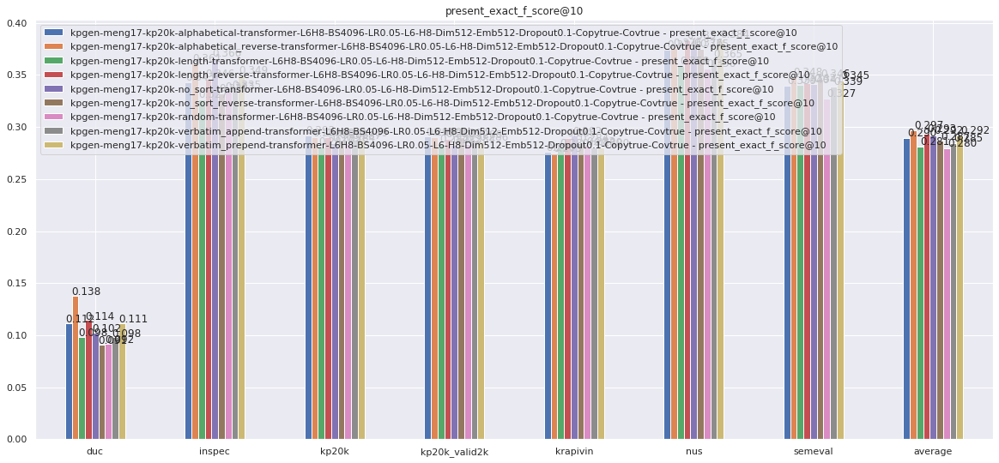

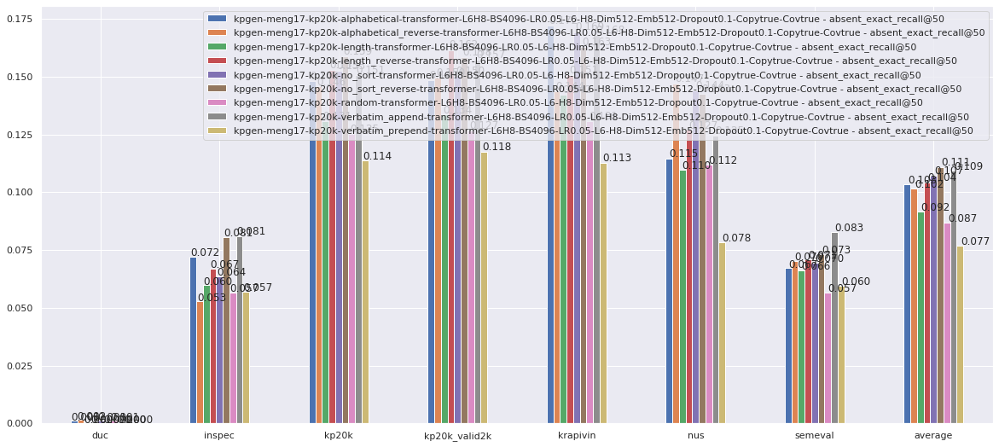

In [13]:
# 2. Compare different architecture variants
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.options.display.max_colwidth = -1

ordered_datasets = ['kp20k', 'inspec', 'krapivin', 'nus', 'semeval', 'duc', 'average']

kp_exps = [
    'kpgen-meng17-kp20k-random-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',    
    
    'kpgen-meng17-kp20k-alphabetical-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-kp20k-alphabetical_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    
    'kpgen-meng17-kp20k-length-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-kp20k-length_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

    'kpgen-meng17-kp20k-no_sort-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-kp20k-no_sort_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    
    'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
    'kpgen-meng17-kp20k-verbatim_prepend-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    
#     'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',
]    


# prepare one2seq data
kp_df = all_eval_df.loc[all_eval_df['exp_name'].isin(kp_exps)]
kp_df = kp_df.loc[kp_df.step % 5000 == 0] # keep % 10000
kp_df = kp_df.sort_values(by='step', ascending=True)
kp_df = kp_df.loc[kp_df.beam_width == '50']
kp_df = kp_df.loc[kp_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
kp_df = kp_df.loc[kp_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

print('All data')
print(kp_df.shape)

print('present valid_kp_df')
_, _, valid_df_present, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@10')
print(valid_df_present.shape)
display(valid_df_present)


metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
metric_names = ['present_exact_f_score@10']
datasets = valid_df_present.test_dataset.unique()
exp_names = valid_df_present.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}
for index_label, row_series in valid_df_present.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='present_exact_f_score@10')
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
    
'''
# SADR
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_advanced_sadr')
metric_names = ['present_exact_advanced_sadr']
datasets = valid_kp_df.test_dataset.unique()
orders = valid_kp_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='present_exact_advanced_sadr')
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
    
# AUC
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_advanced_auc')
metric_names = ['present_exact_advanced_auc']
datasets = valid_kp_df.test_dataset.unique()
orders = valid_kp_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='present_exact_advanced_auc')
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
'''    
    
# export to Latex
pd.options.display.float_format = '{:,.1f}'.format
with pd.option_context('display.max_colwidth', -1, 'display.max_rows', None):
    value_cols = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
    tmp_df = valid_df_present[['exp_name', 'model_base', 'test_dataset'] + value_cols]
    for col in value_cols:
        tmp_df[col] = tmp_df[col].map(lambda v: v * 100.0)

#     tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
#     display(tmp_df)
    df_list = []
    for exp in kp_exps:
        for i in ordered_datasets:
            df_list.append(tmp_df[(tmp_df['exp_name']==exp) & (tmp_df['test_dataset']==i)])
    ordered_df = pd.concat(df_list)
    tmp_df = ordered_df[value_cols]
#     display(ordered_df)
#     print(tmp_df.to_latex(index=False))
    
    
    
    
    

############## absent
print('All data')
print(kp_df.shape)
print('absent valid_kp_df')
_, _, valid_df_absent, _ = brief_eval_results(kp_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
print(valid_df_absent.shape)
# display(valid_df_absent)

# metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50', 'absent_exact_advanced_sadr']
metric_names = ['absent_exact_recall@50']

datasets = valid_df_absent.test_dataset.unique()
exp_names = valid_df_absent.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_df_absent.iterrows():
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
# display(df.transpose())





# SADR
'''
_, _, valid_kp_df = brief_eval_results(kp_df, base_metric='absent_exact_advanced_sadr')
metric_names = ['absent_exact_advanced_sadr']
datasets = valid_kp_df.test_dataset.unique()
orders = valid_kp_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='absent_exact_advanced_sadr')
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
    
# AUC
_, _, valid_kp_df = brief_eval_results(kp_df, base_metric='absent_exact_advanced_auc')
metric_names = ['absent_exact_advanced_auc']
datasets = valid_kp_df.test_dataset.unique()
orders = valid_kp_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='absent_exact_advanced_auc')
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
'''




pd.options.display.float_format = '{:,.1f}'.format
with pd.option_context('display.max_colwidth', -1, 'display.max_rows', None):
    value_cols = ['absent_exact_recall@10', 'absent_exact_recall@50']
    tmp_df = valid_df_absent[['exp_name', 'model_base', 'test_dataset'] + value_cols]
    for col in value_cols:
        tmp_df[col] = tmp_df[col].map(lambda v: v * 100.0)

#     tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
    df_list = []
    for exp in kp_exps:
        for i in ordered_datasets:
            df_list.append(tmp_df[(tmp_df['exp_name']==exp) & (tmp_df['test_dataset']==i)])
    ordered_df = pd.concat(df_list)
    tmp_df = ordered_df[value_cols]

#     display(ordered_df)
#     print(tmp_df.to_latex(index=False))


#### beam_width=1 (greedy)

(7, 9)
Index(['alphabetical - present_exact_f_score@10',
       'alphabetical_reverse - present_exact_f_score@10',
       'length - present_exact_f_score@10',
       'length_reverse - present_exact_f_score@10',
       'no_sort - present_exact_f_score@10',
       'no_sort_reverse - present_exact_f_score@10',
       'random - present_exact_f_score@10',
       'verbatim_append - present_exact_f_score@10',
       'verbatim_prepend - present_exact_f_score@10'],
      dtype='object')
(7, 9)
Index(['alphabetical - absent_exact_recall@50',
       'alphabetical_reverse - absent_exact_recall@50',
       'length - absent_exact_recall@50',
       'length_reverse - absent_exact_recall@50',
       'no_sort - absent_exact_recall@50',
       'no_sort_reverse - absent_exact_recall@50',
       'random - absent_exact_recall@50',
       'verbatim_append - absent_exact_recall@50',
       'verbatim_prepend - absent_exact_recall@50'],
      dtype='object')


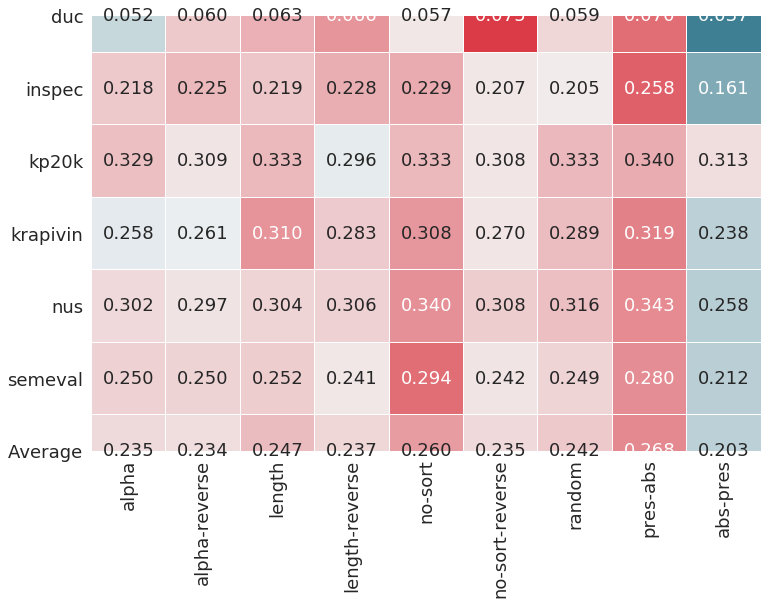

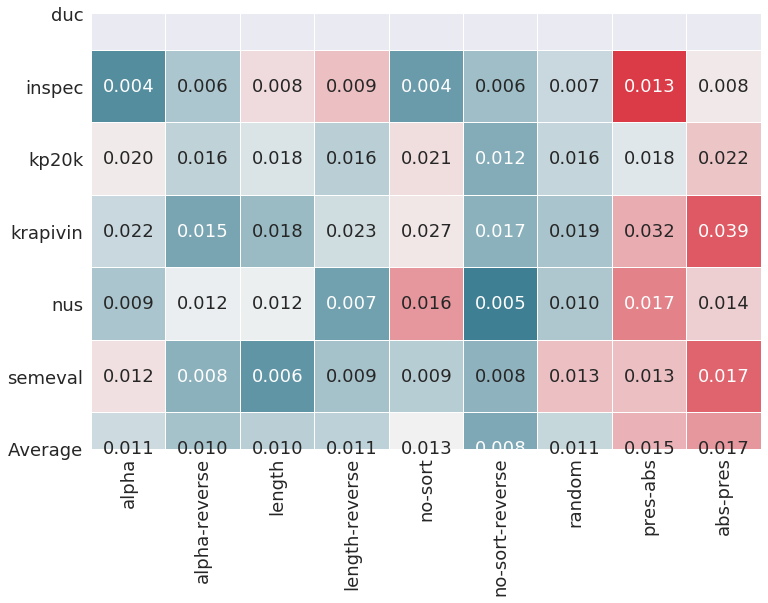

In [11]:
one2seq_exps = [
    'kpgen-meng17-kp20k-random-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',    
    
    'kpgen-meng17-kp20k-alphabetical-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-kp20k-alphabetical_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    
    'kpgen-meng17-kp20k-length-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-kp20k-length_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

    'kpgen-meng17-kp20k-no_sort-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-kp20k-no_sort_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    
    'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
    'kpgen-meng17-kp20k-verbatim_prepend-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
]

import seaborn as sns
sns.set()
import copy

########### Present #############
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '1']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

_, _, valid_one2seq_df, _ = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@10')

metric_names = ['present_exact_f_score@10']

datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
    
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)

df_f1_50 = copy.copy(df)
df_f1_50 = df_f1_50.drop(['kp20k_valid2k'], axis=0)
print(df_f1_50.shape)
column_name_map = {
    'random - present_exact_f_score@10': "random",
    'alphabetical - present_exact_f_score@10': "alpha",
    'alphabetical_reverse - present_exact_f_score@10': "alpha-reverse",
    'length - present_exact_f_score@10': "length",
    'length_reverse - present_exact_f_score@10': "length-reverse",
    'no_sort - present_exact_f_score@10': "no-sort",
    'no_sort_reverse - present_exact_f_score@10': "no-sort-reverse",
    'verbatim_append - present_exact_f_score@10': "pres-abs",
    'verbatim_prepend - present_exact_f_score@10': "abs-pres"
}

normalized_df_f1_50 = df_f1_50.div(df_f1_50.sum(axis=1), axis=0)
print(normalized_df_f1_50.columns)
normalized_df_f1_50.columns = [column_name_map[item] for item in normalized_df_f1_50.columns]




sns.set_context("paper", rc={"font.size": 18,
                             "axes.titlesize": 18,
                             "axes.labelsize": 18,
                             "xtick.labelsize": 18,
                             "ytick.labelsize": 18,
                             "legend.fontsize": 12})


cmap = sns.diverging_palette(220, 10, as_cmap=True)
f, axes = plt.subplots(figsize=(12, 8))
sns.heatmap(normalized_df_f1_50, annot=df_f1_50, linewidths=.2, ax=axes, cmap=cmap, fmt='.3f', cbar=False)




########### Absent #############
metric_names = ['absent_exact_recall@50']

datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
    
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)

df_f1_50 = copy.copy(df)
df_f1_50 = df_f1_50.drop(['kp20k_valid2k'], axis=0)
print(df_f1_50.shape)
column_name_map = {
    'random - absent_exact_recall@50': "random",
    'alphabetical - absent_exact_recall@50': "alpha",
    'alphabetical_reverse - absent_exact_recall@50': "alpha-reverse",
    'length - absent_exact_recall@50': "length",
    'length_reverse - absent_exact_recall@50': "length-reverse",
    'no_sort - absent_exact_recall@50': "no-sort",
    'no_sort_reverse - absent_exact_recall@50': "no-sort-reverse",
    'verbatim_append - absent_exact_recall@50': "pres-abs",
    'verbatim_prepend - absent_exact_recall@50': "abs-pres"
}

normalized_df_f1_50 = df_f1_50.div(df_f1_50.sum(axis=1), axis=0)
print(normalized_df_f1_50.columns)
normalized_df_f1_50.columns = [column_name_map[item] for item in normalized_df_f1_50.columns]


sns.set_context("paper", rc={"font.size": 18,
                             "axes.titlesize": 18,
                             "axes.labelsize": 18,
                             "xtick.labelsize": 18,
                             "ytick.labelsize": 18,
                             "legend.fontsize": 12})


cmap = sns.diverging_palette(220, 10, as_cmap=True)
f, axes = plt.subplots(figsize=(12, 8))
sns.heatmap(normalized_df_f1_50, annot=df_f1_50, linewidths=.2, ax=axes, cmap=cmap, fmt='.3f', cbar=False)


#### beam_width=50

(7, 9)
Index(['alphabetical - present_exact_f_score@10',
       'alphabetical_reverse - present_exact_f_score@10',
       'length - present_exact_f_score@10',
       'length_reverse - present_exact_f_score@10',
       'no_sort - present_exact_f_score@10',
       'no_sort_reverse - present_exact_f_score@10',
       'random - present_exact_f_score@10',
       'verbatim_append - present_exact_f_score@10',
       'verbatim_prepend - present_exact_f_score@10'],
      dtype='object')
(7, 9)
Index(['alphabetical - absent_exact_recall@50',
       'alphabetical_reverse - absent_exact_recall@50',
       'length - absent_exact_recall@50',
       'length_reverse - absent_exact_recall@50',
       'no_sort - absent_exact_recall@50',
       'no_sort_reverse - absent_exact_recall@50',
       'random - absent_exact_recall@50',
       'verbatim_append - absent_exact_recall@50',
       'verbatim_prepend - absent_exact_recall@50'],
      dtype='object')


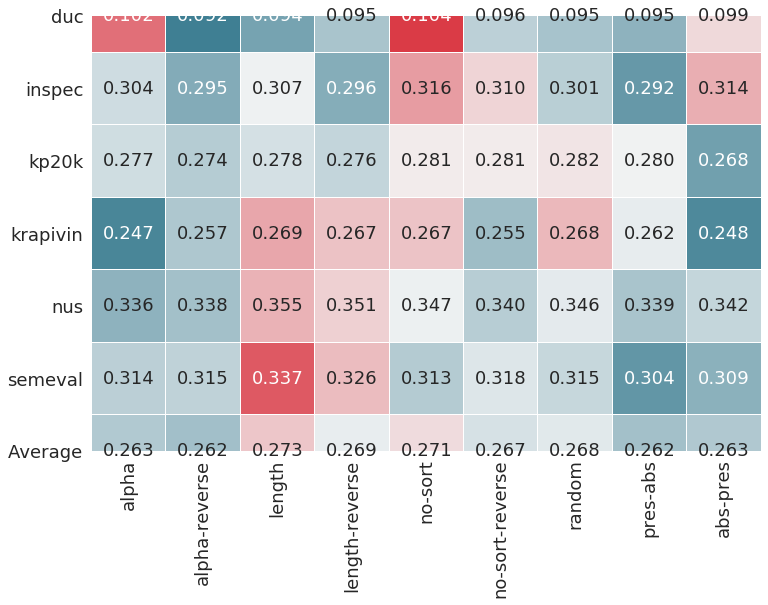

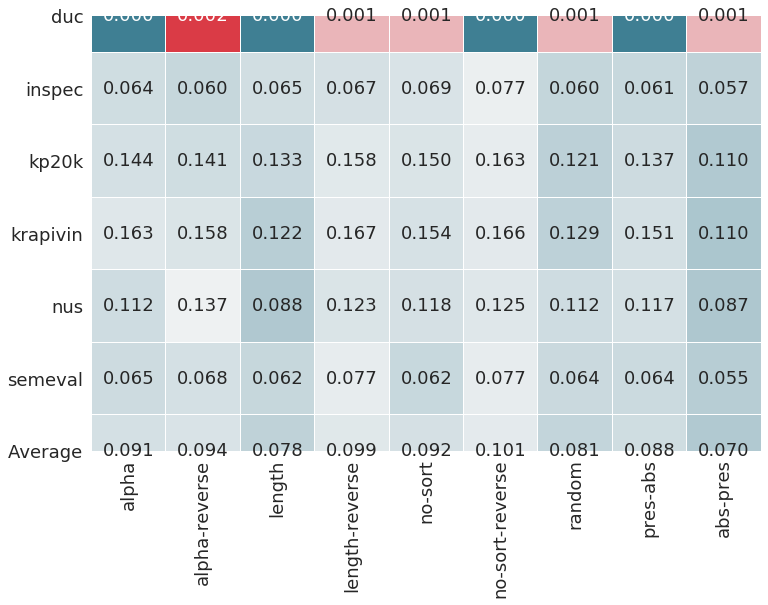

In [50]:
one2seq_exps = [
    'kpgen-meng17-kp20k-random-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',    
    
    'kpgen-meng17-kp20k-alphabetical-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-kp20k-alphabetical_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    
    'kpgen-meng17-kp20k-length-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-kp20k-length_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

    'kpgen-meng17-kp20k-no_sort-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-kp20k-no_sort_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    
    'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
    'kpgen-meng17-kp20k-verbatim_prepend-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
]

import seaborn as sns
sns.set()
import copy

########### Present #############
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'].isin(one2seq_exps)]
one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

_, peak_one2seq_df, valid_one2seq_df, last_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_f_score@10')

metric_names = ['present_exact_f_score@10']

datasets = last_one2seq_df.test_dataset.unique()
orders = last_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in last_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
    
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)

df_f1_50 = copy.copy(df)
df_f1_50 = df_f1_50.drop(['kp20k_valid2k'], axis=0)
print(df_f1_50.shape)
column_name_map = {
    'random - present_exact_f_score@10': "random",
    'alphabetical - present_exact_f_score@10': "alpha",
    'alphabetical_reverse - present_exact_f_score@10': "alpha-reverse",
    'length - present_exact_f_score@10': "length",
    'length_reverse - present_exact_f_score@10': "length-reverse",
    'no_sort - present_exact_f_score@10': "no-sort",
    'no_sort_reverse - present_exact_f_score@10': "no-sort-reverse",
    'verbatim_append - present_exact_f_score@10': "pres-abs",
    'verbatim_prepend - present_exact_f_score@10': "abs-pres"
}

normalized_df_f1_50 = df_f1_50.div(df_f1_50.sum(axis=1), axis=0)
print(normalized_df_f1_50.columns)
normalized_df_f1_50.columns = [column_name_map[item] for item in normalized_df_f1_50.columns]




sns.set_context("paper", rc={"font.size": 18,
                             "axes.titlesize": 18,
                             "axes.labelsize": 18,
                             "xtick.labelsize": 18,
                             "ytick.labelsize": 18,
                             "legend.fontsize": 12})


cmap = sns.diverging_palette(220, 10, as_cmap=True)
f, axes = plt.subplots(figsize=(12, 8))
sns.heatmap(normalized_df_f1_50, annot=df_f1_50, linewidths=.2, ax=axes, cmap=cmap, fmt='.3f', cbar=False)




########### Absent #############
metric_names = ['absent_exact_recall@50']

datasets = last_one2seq_df.test_dataset.unique()
orders = last_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in last_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
    
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)

df_f1_50 = copy.copy(df)
df_f1_50 = df_f1_50.drop(['kp20k_valid2k'], axis=0)
print(df_f1_50.shape)
column_name_map = {
    'random - absent_exact_recall@50': "random",
    'alphabetical - absent_exact_recall@50': "alpha",
    'alphabetical_reverse - absent_exact_recall@50': "alpha-reverse",
    'length - absent_exact_recall@50': "length",
    'length_reverse - absent_exact_recall@50': "length-reverse",
    'no_sort - absent_exact_recall@50': "no-sort",
    'no_sort_reverse - absent_exact_recall@50': "no-sort-reverse",
    'verbatim_append - absent_exact_recall@50': "pres-abs",
    'verbatim_prepend - absent_exact_recall@50': "abs-pres"
}

normalized_df_f1_50 = df_f1_50.div(df_f1_50.sum(axis=1), axis=0)
print(normalized_df_f1_50.columns)
normalized_df_f1_50.columns = [column_name_map[item] for item in normalized_df_f1_50.columns]


sns.set_context("paper", rc={"font.size": 18,
                             "axes.titlesize": 18,
                             "axes.labelsize": 18,
                             "xtick.labelsize": 18,
                             "ytick.labelsize": 18,
                             "legend.fontsize": 12})


cmap = sns.diverging_palette(220, 10, as_cmap=True)
f, axes = plt.subplots(figsize=(12, 8))
sns.heatmap(normalized_df_f1_50, annot=df_f1_50, linewidths=.2, ax=axes, cmap=cmap, fmt='.3f', cbar=False)


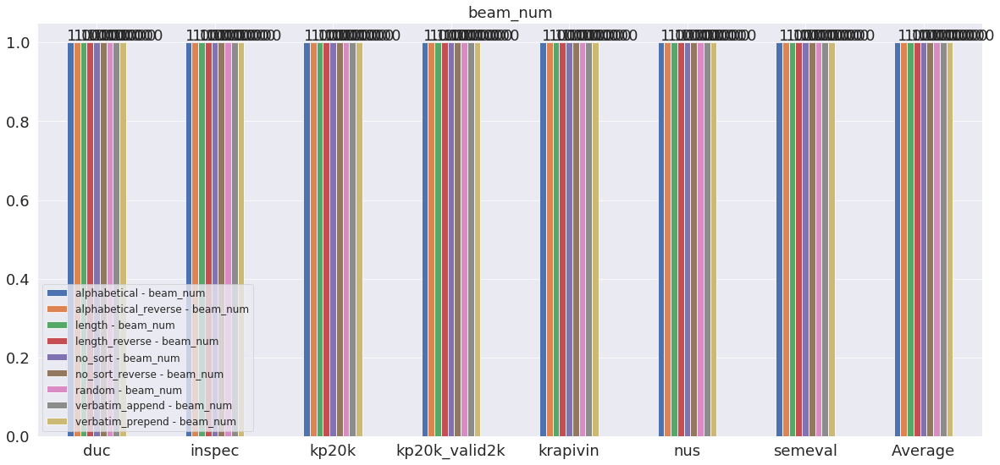

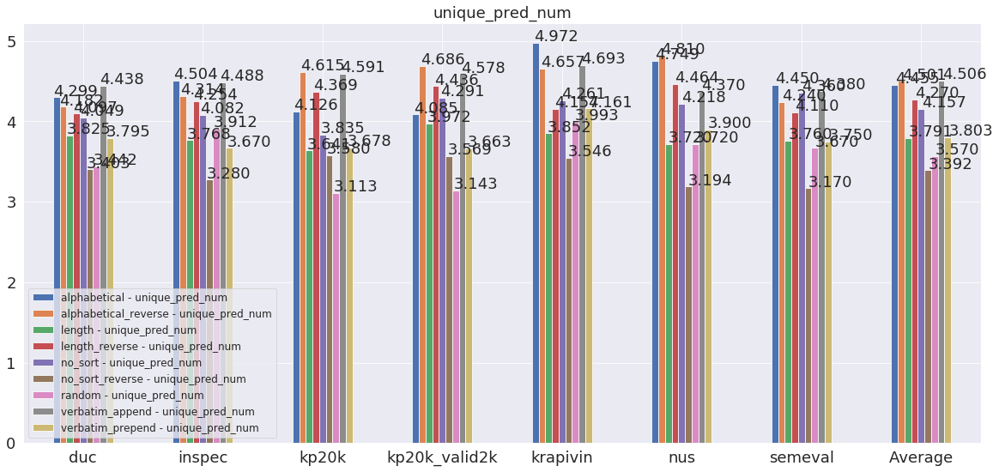

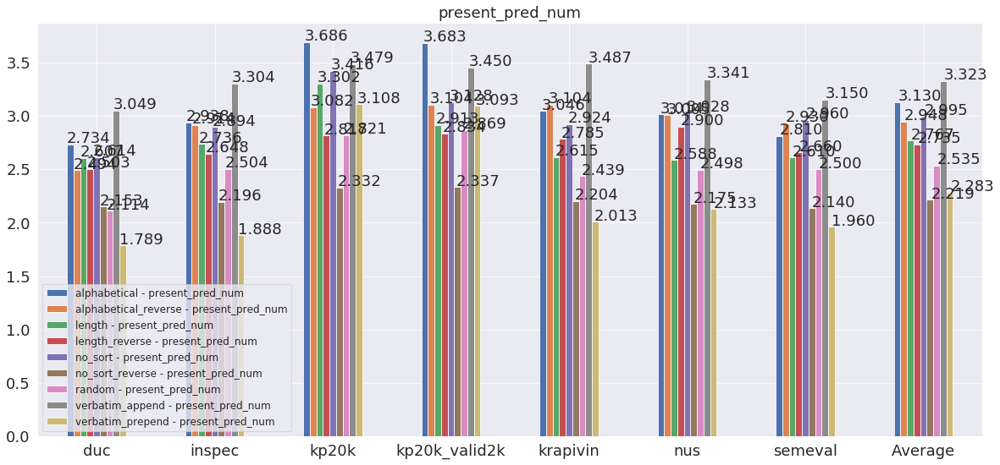

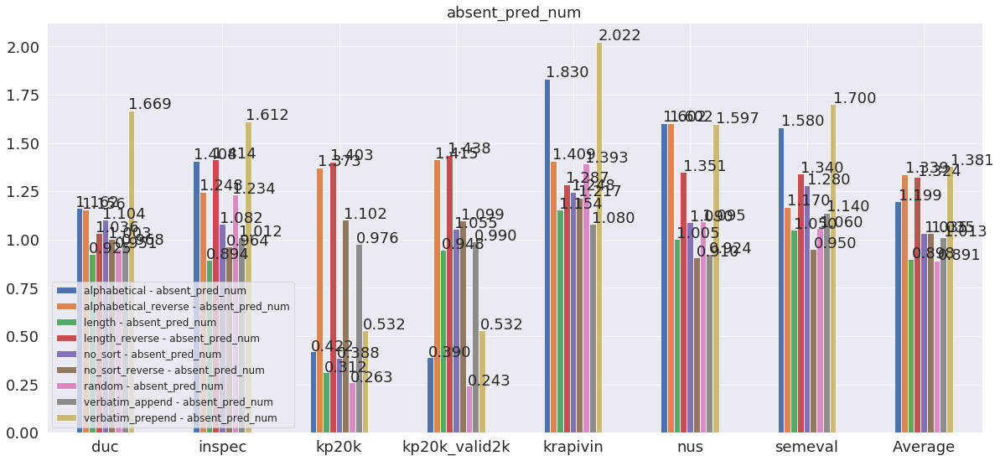

In [13]:

metric_names = ['beam_num']
datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='beam_num')
ax.legend(loc="lower left")
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    

metric_names = ['unique_pred_num']
datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='unique_pred_num')
ax.legend(loc="lower left")
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    

metric_names = ['present_pred_num']
datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='present_pred_num')
ax.legend(loc="lower left")
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    

metric_names = ['absent_pred_num']
datasets = valid_one2seq_df.test_dataset.unique()
orders = valid_one2seq_df.order.unique()
bar_values = {'%s - %s' % (order, metric_name): [] for order in orders for metric_name in metric_names}
for index_label, row_series in valid_one2seq_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.order, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'Average')
df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0, title='absent_pred_num')
ax.legend(loc="lower left")
for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    

### One2Seq MagKP Experiments

All data
(3507, 121)
present valid_kp_df
(77, 121)
All data
(3507, 121)
absent valid_kp_df


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


(77, 121)


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


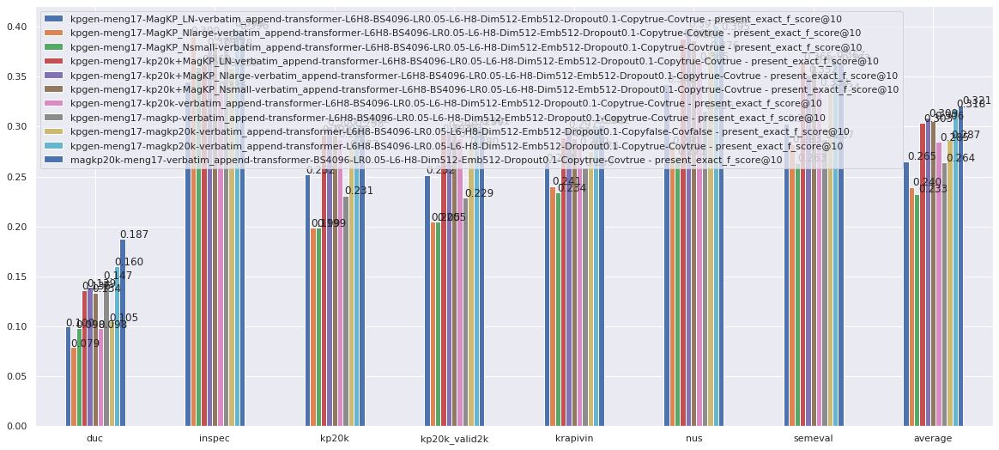

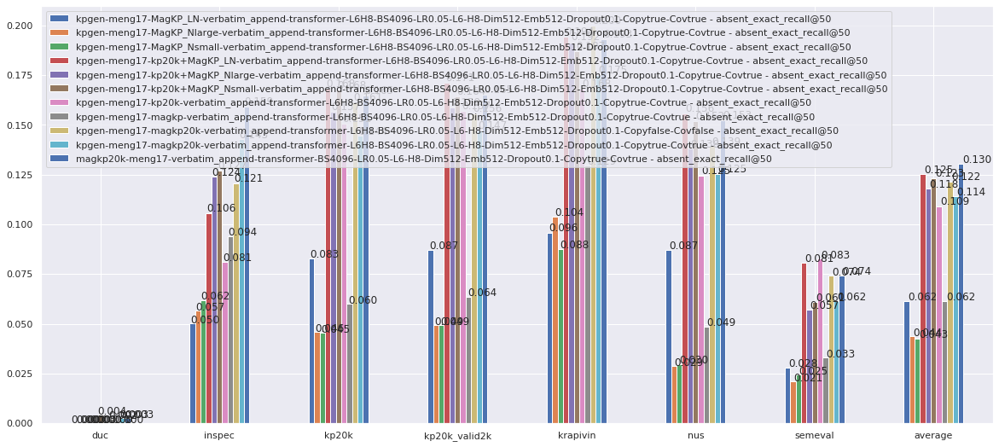

In [68]:
# 2. Compare different architecture variants
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
# pd.options.display.max_colwidth = 100

kp_exps = [
    'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
    
    'kpgen-meng17-MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-magkp-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

    'kpgen-meng17-kp20k+MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
    'kpgen-meng17-kp20k+MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
    'kpgen-meng17-kp20k+MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
    'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

    'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',
    'magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
]    

# prepare one2seq data
kp_df = all_eval_df.loc[all_eval_df['exp_name'].isin(kp_exps)]
kp_df = kp_df.loc[kp_df.step % 5000 == 0] # keep % 10000
kp_df = kp_df.sort_values(by='step', ascending=True)
kp_df = kp_df.loc[kp_df.beam_width == '50']
kp_df = kp_df.loc[kp_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
kp_df = kp_df.loc[kp_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

# kp_df = kp_df.loc[kp_df.test_dataset != 'kp20k']

print('All data')
print(kp_df.shape)

print('present valid_kp_df')
_, _, valid_kp_df = brief_eval_results(kp_df, base_metric='present_exact_f_score@10')
print(valid_kp_df.shape)
# display(valid_kp_df)


metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
metric_names = ['present_exact_advanced_sadr']
metric_names = ['present_exact_f_score@10']

datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
    

pd.options.display.float_format = '{:,.1f}'.format
with pd.option_context('display.max_colwidth', -1, 'display.max_rows', None):
    value_cols = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
    tmp_df = valid_kp_df[['exp_name', 'model_base', 'train_dataset', 'test_dataset'] + value_cols]
    for col in value_cols:
        tmp_df[col] = tmp_df[col].map(lambda v: v * 100.0)

#     tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
#     display(tmp_df)
    df_list = []
    for exp in kp_exps:
        for i in ordered_datasets:
            df_list.append(tmp_df[(tmp_df['exp_name']==exp) & (tmp_df['test_dataset']==i)])
    ordered_df = pd.concat(df_list)
    tmp_df = ordered_df[value_cols]
    
#     display(ordered_df)
#     print(tmp_df.to_latex(index=False))
    

############## absent
print('All data')
print(kp_df.shape)
print('absent valid_kp_df')
_, _, valid_kp_df = brief_eval_results(kp_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
print(valid_kp_df.shape)
# display(valid_kp_df)

# metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50', 'absent_exact_advanced_sadr']
metric_names = ['absent_exact_recall@50']


datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_kp_df.iterrows():
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
# display(df.transpose())

    
pd.options.display.float_format = '{:,.1f}'.format
with pd.option_context('display.max_colwidth', -1, 'display.max_rows', None):
    value_cols = ['absent_exact_recall@10', 'absent_exact_recall@50']
    tmp_df = valid_kp_df[['exp_name', 'model_base', 'train_dataset', 'test_dataset'] + value_cols]
    for col in value_cols:
        tmp_df[col] = tmp_df[col].map(lambda v: v * 100.0)

#     tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
    df_list = []
    for exp in kp_exps:
        for i in ordered_datasets:
            df_list.append(tmp_df[(tmp_df['exp_name']==exp) & (tmp_df['test_dataset']==i)])
    ordered_df = pd.concat(df_list)
    tmp_df = ordered_df[value_cols]

#     display(ordered_df)
#     print(tmp_df.to_latex(index=False))


### Fine-tune KP20k after MagKP

All data
(280, 121)
['kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1'
 'magkp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue']
present valid_kp_df
(14, 121)
All data
(280, 121)
absent valid_kp_df


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


(14, 121)


/ihome/hdaqing/rum20/anaconda3/envs/kp/lib/python3.7/site-packages/ipykernel_launcher.py:140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


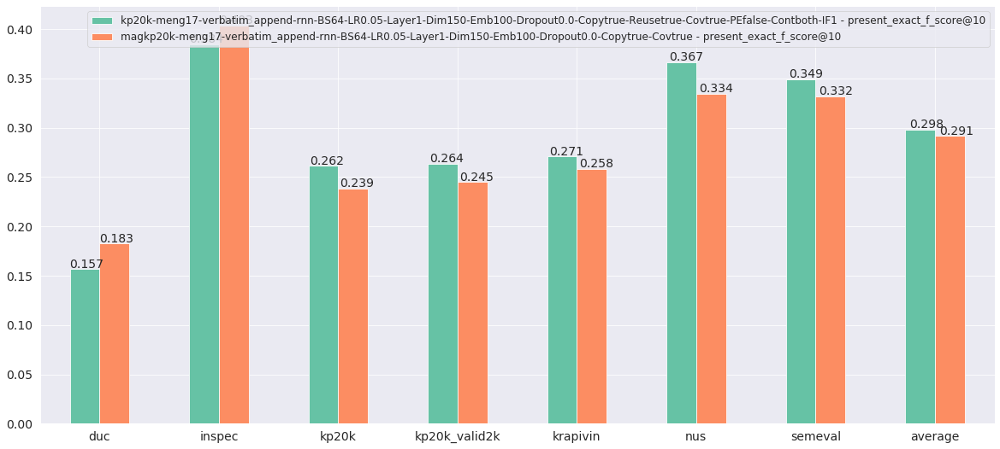

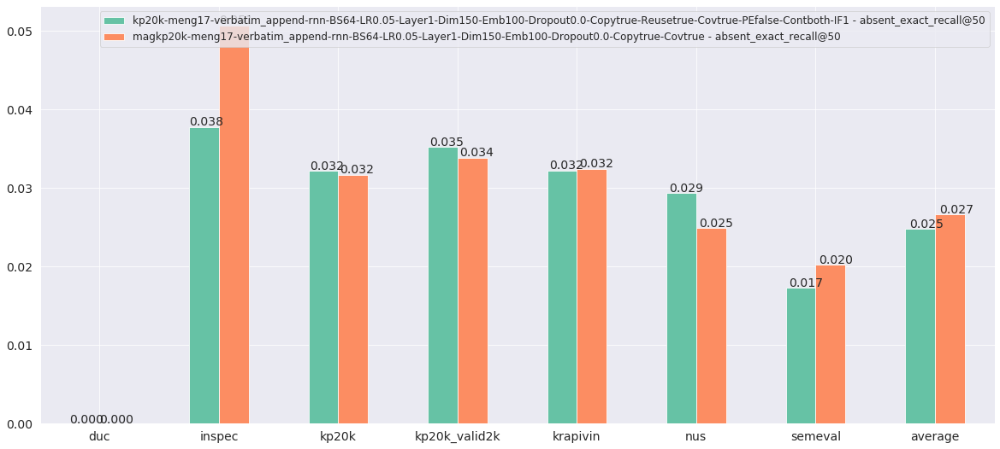

In [116]:
# 2. Compare different architecture variants
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

ordered_datasets = ['kp20k', 'inspec', 'krapivin', 'nus', 'semeval', 'duc', 'average']

kp_exps = [
'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1',
'magkp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
    
# 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   

# 'kpgen-meng17-kp20k+MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
# 'kpgen-meng17-kp20k+MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'kpgen-meng17-kp20k+MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
# 'kpgen-meng17-magkp-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

# 'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

# 'kpgen-meng17-MagKP_LN+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'kpgen-meng17-MagKP_Nlarge+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'kpgen-meng17-MagKP_Nsmall+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'kpgen-meng17-magkp+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'kpgen-meng17-magkp20k+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue'
]    

# prepare one2seq data
kp_df = all_eval_df.loc[all_eval_df['exp_name'].isin(kp_exps)]
kp_df = kp_df.loc[(kp_df.step % 10000 == 6000) | (kp_df.step % 5000 == 0)]
kp_df = kp_df.sort_values(by='step', ascending=True)
kp_df = kp_df.loc[kp_df.beam_width == '50']
kp_df = kp_df.loc[kp_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
kp_df = kp_df.loc[kp_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating


print('All data')
print(kp_df.shape)
print(kp_df.exp_name.unique())

print('present valid_kp_df')
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@10')
print(valid_kp_df.shape)
# display(valid_kp_df)


metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
metric_names = ['present_exact_advanced_sadr']
metric_names = ['present_exact_f_score@10']
# metric_names = ['present_exact_advanced_alpha_ndcg@5']


datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))    
    

pd.options.display.float_format = '{:,.1f}'.format
with pd.option_context('display.max_colwidth', -1, 'display.max_rows', None):
    value_cols = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k']
    tmp_df = valid_kp_df[['exp_name', 'model_base', 'train_dataset', 'test_dataset'] + value_cols]
    for col in value_cols:
        tmp_df[col] = tmp_df[col].map(lambda v: v * 100.0)

#     tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
#     display(tmp_df)
    df_list = []
    for exp in kp_exps:
        for i in ordered_datasets:
            df_list.append(tmp_df[(tmp_df['exp_name']==exp) & (tmp_df['test_dataset']==i)])
    ordered_df = pd.concat(df_list)
    tmp_df = ordered_df[value_cols]
    
#     display(ordered_df)
#     print(tmp_df.to_latex(index=False))
    

############## absent
print('All data')
print(kp_df.shape)
print('absent valid_kp_df')
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='absent_exact_recall@50')

# ensure the dataframe is sorted first
print(valid_kp_df.shape)
# display(valid_kp_df)

# metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50', 'absent_exact_advanced_sadr']
metric_names = ['absent_exact_recall@50']


datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in exp_names for metric_name in metric_names}

for index_label, row_series in valid_kp_df.iterrows():
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))
datasets = np.append(datasets, 'average')

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(20,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))  
# display(df.transpose())

    
pd.options.display.float_format = '{:,.1f}'.format
with pd.option_context('display.max_colwidth', -1, 'display.max_rows', None):
    value_cols = ['absent_exact_recall@10', 'absent_exact_recall@50']
    tmp_df = valid_kp_df[['exp_name', 'model_base', 'train_dataset', 'test_dataset'] + value_cols]
    for col in value_cols:
        tmp_df[col] = tmp_df[col].map(lambda v: v * 100.0)

#     tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
    df_list = []
    for exp in kp_exps:
        for i in ordered_datasets:
            df_list.append(tmp_df[(tmp_df['exp_name']==exp) & (tmp_df['test_dataset']==i)])
    ordered_df = pd.concat(df_list)
    tmp_df = ordered_df[value_cols]

#     display(ordered_df)
#     print(tmp_df.to_latex(index=False))


### Summary (used in paper, Section "more data")

#### MagKP results (alternate batching)

absent
(56, 121)


Text(0, 0.5, 'Absent (R@50)')

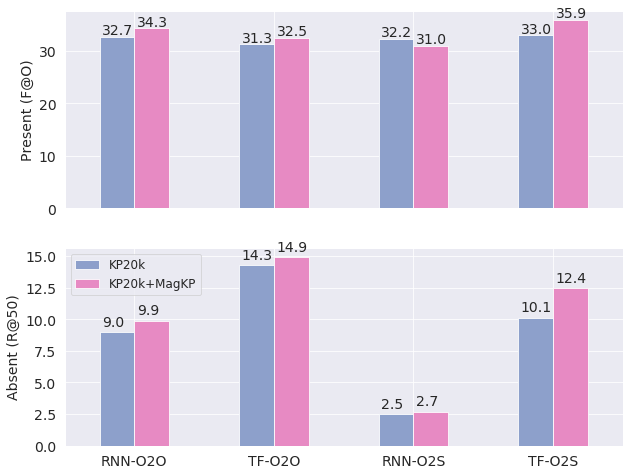

In [354]:
long2short = {
'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1': 'KP20k - RNN-O2O',
'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue': 'KP20k - TF-O2O',
'magkp20k-meng17-one2one-BS128-LR0.05-L1-H-D150-E100-DO0.0-Copytrue': 'KP20k+MagKP - RNN-O2O',
'magkp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue': 'KP20k+MagKP - TF-O2O',
        
'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1': 'KP20k - RNN-O2S',
'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue': 'KP20k - TF-O2S',
'magkp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue': 'KP20k+MagKP - RNN-O2S',
'magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue': 'KP20k+MagKP - TF-O2S',

}

kp_df = all_eval_df.loc[all_eval_df['exp_name'].isin(long2short)]
kp_df = kp_df.loc[(kp_df.step % 10000 == 6000) | (kp_df.step % 5000 == 0)]
kp_df = kp_df.sort_values(by='step', ascending=True)
kp_df = kp_df.loc[(kp_df.beam_width == '50') | (kp_df.beam_width == '200')]
kp_df = kp_df.loc[kp_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
kp_df = kp_df.loc[kp_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

# for exp_name in kp_df['exp_name'].unique():
#     print(exp_name, kp_df.loc[kp_df.exp_name == exp_name].shape)
for index_label, row_series in kp_df.iterrows():
    kp_df.at[index_label , 'exp_name'] = long2short[kp_df.at[index_label , 'exp_name']]
# for exp_name in kp_df['exp_name'].unique():
#     print(exp_name, kp_df.loc[kp_df.exp_name == exp_name].shape)
    
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@k')
# print('present')
# print(valid_kp_df.shape)
metric_names = ['present_exact_f_score@k']

datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {exp_name: [] for exp_name in exp_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values[row_series.exp_name].append(float(bar_value))

datamodel_names = bar_values.keys()
model_names = ['RNN-O2O', 'TF-O2O', 'RNN-O2S', 'TF-O2S']
avg_bar_values = {'KP20k': [0.0] * 4, 'KP20k+MagKP': [0.0] * 4}

# compute average scores over all datasets except for KP20k_valid2k
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for datamodel_name, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
#     print(datamodel_name)
#     print(_v)
    data_name, model_name = datamodel_name.split(' - ')
    avg_bar_values[data_name][model_names.index(model_name)] = np.mean(_v)
datasets = np.append(datasets, 'Average')

present_df = pd.DataFrame(avg_bar_values, index=model_names)
# display(present_df)
# ax = present_df.plot.bar(figsize=(20,9), rot=0)
# for p in ax.patches:
#     ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


###### Absent 
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='absent_exact_recall@50')
print('absent')
print(valid_kp_df.shape)
metric_names = ['absent_exact_recall@50']

datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {exp_name: [] for exp_name in exp_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values[row_series.exp_name].append(float(bar_value))

datamodel_names = bar_values.keys()
model_names = ['RNN-O2O', 'TF-O2O', 'RNN-O2S', 'TF-O2S']
avg_bar_values = {'KP20k': [0.0] * 4, 'KP20k+MagKP': [0.0] * 4}

# compute average scores over all datasets except for KP20k_valid2k
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for datamodel_name, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    data_name, model_name = datamodel_name.split(' - ')
    avg_bar_values[data_name][model_names.index(model_name)] = np.mean(_v)
datasets = np.append(datasets, 'Average')

# print(avg_bar_values)
    
absent_df = pd.DataFrame(avg_bar_values, index=model_names)
# ax = df.plot.bar(figsize=(20,9), rot=0)
# for p in ax.patches:
#     ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


# Set up the matplotlib figure

sns.set_context("paper", rc={"font.size": 14,
                             "axes.titlesize": 14,
                             "axes.labelsize": 14,
                             "xtick.labelsize": 14,
                             "ytick.labelsize": 14,
                             "legend.fontsize": 12})
sns.set_palette("Set2")
_set2 = sns.color_palette("Set2").as_hex()
sns.set_palette(_set2[2:])

present_df = present_df * 100.0
absent_df = absent_df * 100.0

f, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
present_df.plot.bar(ax=axes[0], legend=False, rot=0)
for p in axes[0].patches:
    axes[0].annotate('%.1f' % (p.get_height()), (p.get_x() + 0.02, p.get_height() + 0.5), rotation=0)  
axes[0].set_ylabel("Present (F@O)")

absent_df.plot.bar(ax=axes[1], rot=0)
for p in axes[1].patches:
    axes[1].annotate('%.1f' % (p.get_height()), (p.get_x() + 0.02, p.get_height() + 0.5), rotation=0)    
axes[1].set_ylabel("Absent (R@50)") 



#### Transformer-One2Seq + finetuning

{'KP20k': [0.0, 0.32964581915149765, 0.0, 0.0], 'MagKP-LN': [0.0, 0.27661142924579435, 0.34382843109823175, 0.3467885846482097], 'MagKP-Nsmall': [0.0, 0.23401538716620343, 0.3355582419906315, 0.35665740531218465], 'MagKP-Nlarge': [0.0, 0.2362195467957657, 0.3469310347758215, 0.3661067083434932], 'MagKP': [0.3590153568770634, 0.27308173527169377, 0.3492337068087626, 0.3636161502915452]}


,KP20k,MagKP-LN,MagKP-Nsmall,MagKP-Nlarge,MagKP
ALT,0.0,0.0,0.0,0.0,0.4
Only,0.3,0.3,0.2,0.2,0.3
MX,0.0,0.3,0.3,0.3,0.3
FT,0.0,0.3,0.4,0.4,0.4


absent
(98, 121)


(3, 15)

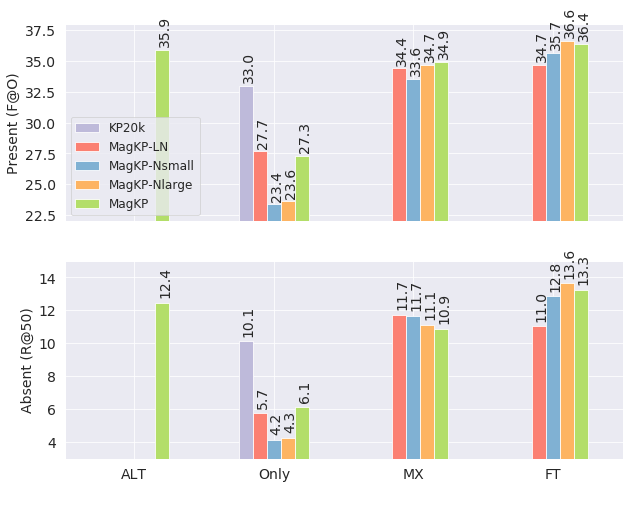

In [355]:
short2long = {
'MagKP - ALT': 'magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

'KP20k - Only': 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'MagKP-LN - Only': 'kpgen-meng17-MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'MagKP-LN - MX': 'kpgen-meng17-kp20k+MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'MagKP-LN - FT': 'kpgen-meng17-MagKP_LN+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

'MagKP-Nsmall - Only': 'kpgen-meng17-MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'MagKP-Nsmall - MX': 'kpgen-meng17-kp20k+MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue', 
'MagKP-Nsmall - FT': 'kpgen-meng17-MagKP_Nsmall+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

'MagKP-Nlarge - Only': 'kpgen-meng17-MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'MagKP-Nlarge - MX': 'kpgen-meng17-kp20k+MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'MagKP-Nlarge - FT': 'kpgen-meng17-MagKP_Nlarge+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

'MagKP - Only': 'kpgen-meng17-magkp-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'MagKP - MX': 'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'MagKP - FT': 'kpgen-meng17-magkp+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
}

long2short = {long: short for short, long in short2long.items()}
mode_names = ['ALT', 'Only', 'MX', 'FT']
traindata_names = ['KP20k', 'MagKP-LN', 'MagKP-Nsmall', 'MagKP-Nlarge', 'MagKP']

kp_df = all_eval_df.loc[all_eval_df['exp_name'].isin(long2short)]
kp_df = kp_df.loc[(kp_df.step % 10000 == 6000) | (kp_df.step % 5000 == 0)]
kp_df = kp_df.sort_values(by='step', ascending=True)
kp_df = kp_df.loc[(kp_df.beam_width == '50') | (kp_df.beam_width == '200')]
kp_df = kp_df.loc[kp_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
kp_df = kp_df.loc[kp_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating

# for exp_name in kp_df['exp_name'].unique():
#     print(exp_name, kp_df.loc[kp_df.exp_name == exp_name].shape)
for index_label, row_series in kp_df.iterrows():
    kp_df.at[index_label , 'exp_name'] = long2short[kp_df.at[index_label , 'exp_name']]
# for exp_name in kp_df['exp_name'].unique():
#     print(exp_name, kp_df.loc[kp_df.exp_name == exp_name].shape)
    
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@k')
metric_names = ['present_exact_f_score@k']

datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {exp_name: [] for exp_name in exp_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values[row_series.exp_name].append(float(bar_value))

datamode_names = bar_values.keys()
avg_bar_values = {dname: [0.0] * len(mode_names) for dname in traindata_names}

# compute average scores over all datasets except for KP20k_valid2k
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for datamode_name, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
#     print(datamode_name)
#     print(_v)
    data_name, mode_name = datamode_name.split(' - ')
    avg_bar_values[data_name][mode_names.index(mode_name)] = np.mean(_v)
datasets = np.append(datasets, 'Average')
present_df = pd.DataFrame(avg_bar_values, index=mode_names)

print(avg_bar_values)
display(present_df)
# ax = present_df.plot.bar(figsize=(20,9), rot=0)
# for p in ax.patches:
#     ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


###### Absent 
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='absent_exact_recall@50')
print('absent')
print(valid_kp_df.shape)
metric_names = ['absent_exact_recall@50']

datasets = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {exp_name: [] for exp_name in exp_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values[row_series.exp_name].append(float(bar_value))

datamode_names = bar_values.keys()
avg_bar_values = {dname: [0.0] * len(mode_names) for dname in traindata_names}

# compute average scores over all datasets except for KP20k_valid2k
kp20k_valid2k_idx = datasets.tolist().index('kp20k_valid2k')
for datamode_name, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    data_name, mode_name = datamode_name.split(' - ')
    avg_bar_values[data_name][mode_names.index(mode_name)] = np.mean(_v)
datasets = np.append(datasets, 'Average')

# print(avg_bar_values)
    
absent_df = pd.DataFrame(avg_bar_values, index=mode_names)
# ax = df.plot.bar(figsize=(20,9), rot=0)
# for p in ax.patches:
#     ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   


# Set up the matplotlib figure

sns.set_context("paper", rc={"font.size": 14,
                             "axes.titlesize": 14,
                             "axes.labelsize": 14,
                             "xtick.labelsize": 14,
                             "ytick.labelsize": 14,
                             "legend.fontsize": 12})

_set2 = sns.color_palette("Set3").as_hex()
sns.set_palette(_set2[2:])

present_df = present_df * 100.0
absent_df = absent_df * 100.0
# present_df = present_df.replace(0.0, np.NaN)
# display(present_df)
f, axes = plt.subplots(2, 1, figsize=(10, 8), sharex=True)
g = present_df.plot.bar(ax=axes[0], legend=True, rot=0)
for p in axes[0].patches:
    axes[0].annotate('%.1f' % (p.get_height()), (p.get_x() + 0.02, p.get_height() + 0.5), rotation=90)   
axes[0].set_ylabel("Present (F@O)")
axes[0].legend(loc='lower left')
g.set_ylim(22, 38)

g = absent_df.plot.bar(ax=axes[1], legend=False, rot=0)
for p in axes[1].patches:
    axes[1].annotate('%.1f' % (p.get_height()), (p.get_x() + 0.02, p.get_height() + 0.5), rotation=90)    
axes[1].set_ylabel("Absent (R@50)") 
g.set_ylim(3, 15)



## Add Recall@M, see whether models are able to recall all possible phrases

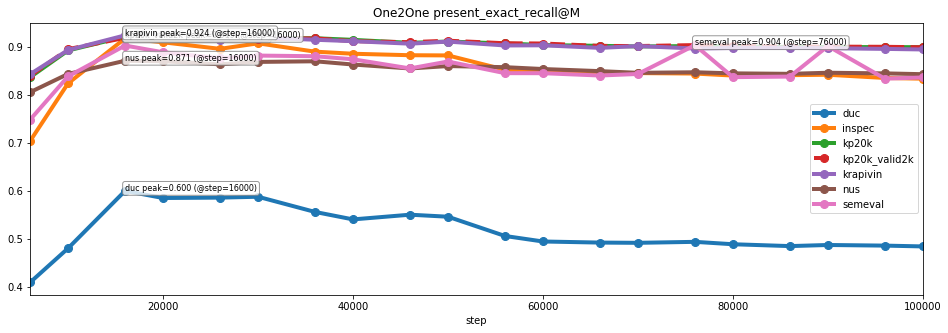

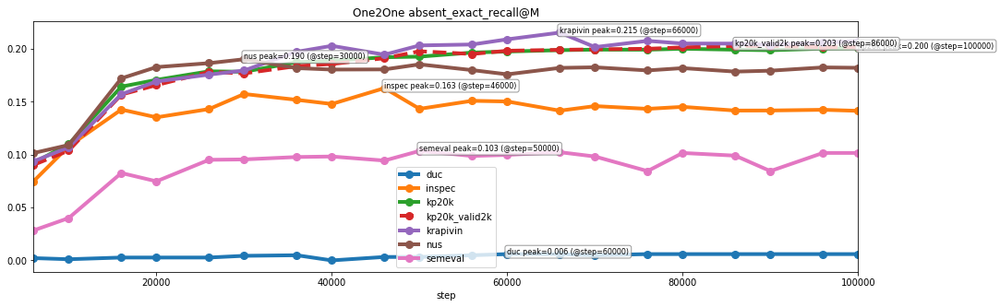

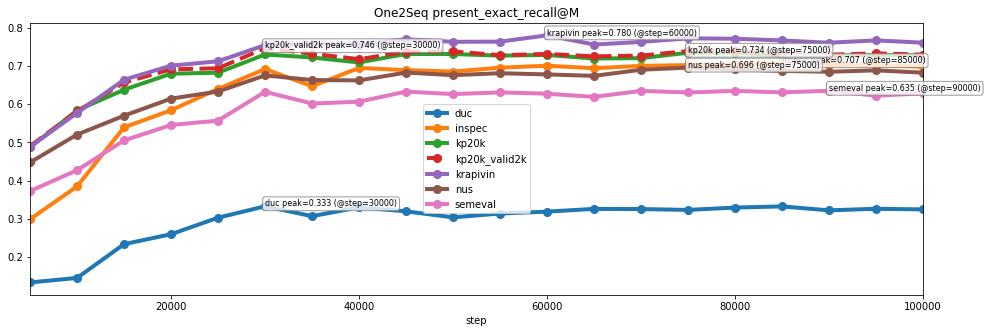

/ihome/hdaqing/rum20/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in double_scalars


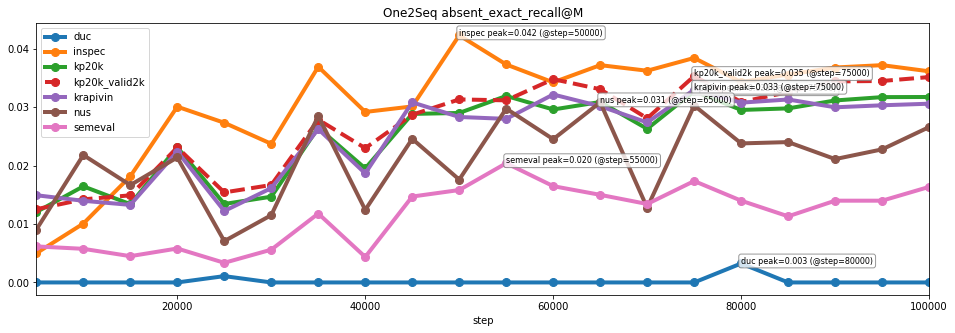

29     /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
203    /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
30     /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
204    /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
31     /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
207    /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
34     /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
206    /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
33     /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
208    /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
32     /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
205    /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
28     /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
209    /zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output...
Name: path, dtype: object

/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2one/meng17-one2one-kp20k/meng17-one2one-fullbeam/meng17-one2one-beam200-maxlen6/eval/kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1_step_26000-duc-exhaustive.json
/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-topmodels/meng17-one2seq-fullbeam/meng17-one2seq-beam50-maxlen40/eval/kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1_step_50000-duc-exhaustive.json
/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2one/meng17-one2one-kp20k/meng17-one2one-fullbeam/meng17-one2one-beam200-maxlen6/eval/kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1_step_26000-inspec-exhaustive.json
/zfs1/pbrusilovsky/rum20/kp/OpenNMT-kpg/output/keyphrase/meng17-one2seq/meng17-one2seq-kp20k-topmodels/meng17-

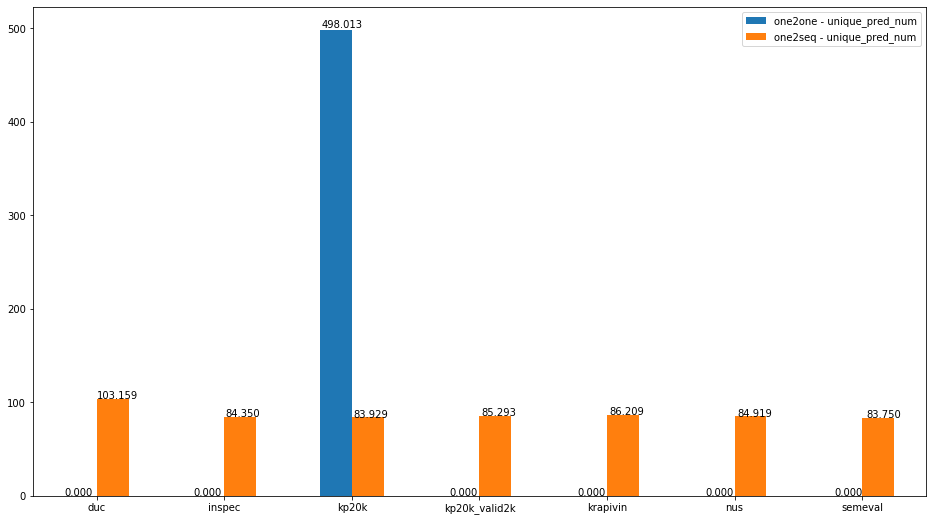

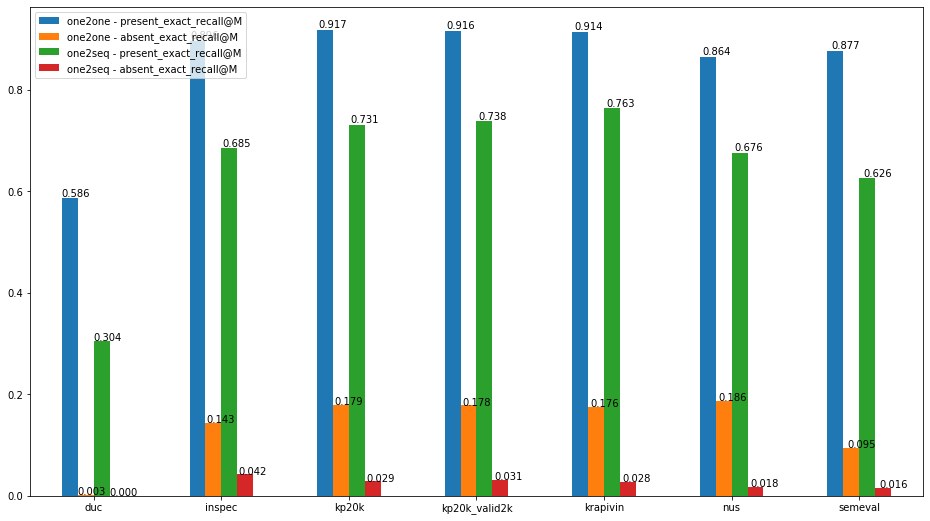

In [22]:
# prepare for one2one data
one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1']
# one2one_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue']
one2one_df = one2one_df.sort_values(by='step', ascending=True)
one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000
one2one_df = one2one_df.loc[one2one_df.beam_width == '200']
kp20k_one2one_df = one2one_df[one2one_df.test_dataset.str.startswith('kp20k')]

for index_label, row_series in kp20k_one2one_df.iterrows():
     kp20k_one2one_df.at[index_label, 'test_dataset'] = 'one2one - ' + kp20k_one2one_df.at[index_label, 'test_dataset']
    
# prepare one2seq data
one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1']
# one2seq_df = all_eval_df.loc[all_eval_df['exp_name'] == 'kp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue']
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
one2seq_df = one2seq_df.loc[one2seq_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating


kp20k_one2seq_df = one2seq_df[one2seq_df.test_dataset.str.startswith('kp20k')]
for index_label, row_series in kp20k_one2seq_df.iterrows():
     kp20k_one2seq_df.at[index_label, 'test_dataset'] = 'one2seq - ' + kp20k_one2seq_df.at[index_label, 'test_dataset']

# combine both and plot
combined_kp20k_df = kp20k_one2one_df.append(kp20k_one2seq_df, ignore_index=True)
combined_df = one2one_df.append(one2seq_df, ignore_index=True)




plot_testing_curve(one2one_df, y_index='present_exact_recall@M', plot_valid_peak=False, title='One2One present_exact_recall@M')
plot_testing_curve(one2one_df, y_index='absent_exact_recall@M', plot_valid_peak=False, title='One2One absent_exact_recall@M')
plot_testing_curve(one2seq_df, y_index='present_exact_recall@M', plot_valid_peak=False, title='One2Seq present_exact_recall@M')
plot_testing_curve(one2seq_df, y_index='absent_exact_recall@M', plot_valid_peak=False, title='One2Seq absent_exact_recall@M')









str_summary_df, self_peak_summary_df, valid_peak_summary_df = brief_eval_results(combined_df, base_metric='present_exact_f_score_hard@10')

# ensure the dataframe is sorted first
# display(valid_peak_summary_df)
metric_names = ['unique_pred_num']

datasets = valid_peak_summary_df.test_dataset.unique()
modes = valid_peak_summary_df.train_mode.unique()
bar_values = {'%s - %s' % (mode, metric_name): [] for mode in modes for metric_name in metric_names}

# metric_name = 'present_exact_f_score_hard@10'

for index_label, row_series in valid_peak_summary_df.iterrows():
    train_mode = row_series.train_mode
    
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (train_mode, metric_name)].append(float(bar_value))

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
    
    
    


str_summary_df, self_peak_summary_df, valid_peak_summary_df = brief_eval_results(combined_df, base_metric='present_exact_f_score_hard@10')

# ensure the dataframe is sorted first
display(valid_peak_summary_df.path)
metric_names = ['present_exact_recall@M', 'absent_exact_recall@M']

datasets = valid_peak_summary_df.test_dataset.unique()
modes = valid_peak_summary_df.train_mode.unique()
bar_values = {'%s - %s' % (mode, metric_name): [] for mode in modes for metric_name in metric_names}

# metric_name = 'present_exact_f_score_hard@10'

for index_label, row_series in valid_peak_summary_df.iterrows():
    train_mode = row_series.train_mode
    
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (train_mode, metric_name)].append(float(bar_value))

df = pd.DataFrame(bar_values, index=datasets)
ax = df.plot.bar(figsize=(16,9), rot=0)

for p in ax.patches:
    ax.annotate('%.3f' % (p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))   
    
# display(valid_peak_summary_df.path)

for index_label, row_series in valid_peak_summary_df.iterrows():
    print(row_series.path)
    
    
    

#### POS-tag based NP extraction

I put the code in `OpenNMT-kpg/onmt/keyphrase/extract_np.py`

It runs super slow since it needs to run spacy to parse every doc.

##### NP
- duc, #(dp)=308, #(present_dp)=308, avgnum_present_pred=7.8604, avgnum_absent_pred=1.6579, avgnum_NP=538.2013, **recall=0.9372**
- inspec, #(dp)=500, #(present_dp)=497, avgnum_present_pred=7.7606, avgnum_absent_pred=2.7789, avgnum_NP=122.2480, **recall=0.8980**
- krapivin, #(dp)=460, #(present_dp)=437, avgnum_present_pred=3.3982, avgnum_absent_pred=2.7722, avgnum_NP=144.3957, **recall=0.9105**
- nus, #(dp)=211, #(present_dp)=207, avgnum_present_pred=6.0918, avgnum_absent_pred=6.1538, avgnum_NP=149.4502, **recall=0.8475**
- semeval, #(dp)=100, #(present_dp)=100, avgnum_present_pred=6.7100, avgnum_absent_pred=8.4444, avgnum_NP=160.5000, **recall=0.8705**
- kp20k_valid2k, #(dp)=2000, #(present_dp)=1901, avgnum_present_pred=3.5066, avgnum_absent_pred=2.3504, avgnum_NP=151.2730, **recall=0.9191**
- kp20k, #(dp)=19987, #(present_dp)=19049, avgnum_present_pred=3.4997, avgnum_absent_pred=2.3564, avgnum_NP=151.6832, **recall=0.9214**




##### One2One
- duc, #(dp)=308, #(tgt)=8.0649, #(pred)=499.8474, 
num_present_doc=308, avgnum_present_tgt=7.8604, avgnum_present_pred=78.0357, **present_recall=0.5493**, 
num_absent_doc=38, avgnum_absent_tgt=1.6579, avgnum_absent_pred=412.8084, **absent_recall=0.0263**

- inspec, #(dp)=500, #(tgt)=9.8260, #(pred)=498.9860, 
num_present_doc=497, avgnum_present_tgt=7.7606, avgnum_present_pred=51.0920, **present_recall=0.8848**, 
num_absent_doc=380, avgnum_absent_tgt=2.7789, avgnum_absent_pred=411.4960, **absent_recall=0.1885**

- krapivin, #(dp)=460, #(tgt)=5.7413, #(pred)=499.2674, 
num_present_doc=437, avgnum_present_tgt=3.3982, avgnum_present_pred=47.1826, **present_recall=0.9441**, 
num_absent_doc=417, avgnum_absent_tgt=2.7722, avgnum_absent_pred=402.7239, **absent_recall=0.2260**

- nus, #(dp)=211, #(tgt)=11.6635, #(pred)=499.9384, 
num_present_doc=207, avgnum_present_tgt=6.0918, avgnum_present_pred=57.8720, **present_recall=0.8787**, 
num_absent_doc=195, avgnum_absent_tgt=6.1538, avgnum_absent_pred=399.7630, **absent_recall=0.1998**

- semeval, #(dp)=100, #(tgt)=15.0700, #(pred)=499.7100, 
num_present_doc=100, avgnum_present_tgt=6.7100, avgnum_present_pred=63.0800, **present_recall=0.8890**, 
num_absent_doc=99, avgnum_absent_tgt=8.4444, avgnum_absent_pred=391.5300, **absent_recall=0.0755**

- kp20k_valid2k, #(dp)=2000, #(tgt)=5.2650, #(pred)=497.9980, 
num_present_doc=1901, avgnum_present_tgt=3.5066, avgnum_present_pred=59.1775, **present_recall=0.9631**, 
num_absent_doc=1644, avgnum_absent_tgt=2.3504, avgnum_absent_pred=397.8405, **absent_recall=0.2159**

- kp20k, #(dp)=19987, #(tgt)=5.2625, #(pred)=499.1349, 
num_present_doc=19049, avgnum_present_tgt=3.4997, avgnum_present_pred=59.4981, **present_recall=0.9626**, 
num_absent_doc=16345, avgnum_absent_tgt=2.3564, avgnum_absent_pred=393.6672, **absent_recall=0.2290**



##### One2Seq
- duc, #(dp)=308, #(tgt)=8.0649, #(pred)=115.5260, 
num_present_doc=308, avgnum_present_tgt=7.8604, avgnum_present_pred=27.2175, **present_recall=0.3237**, 
num_absent_doc=38, avgnum_absent_tgt=1.6579, avgnum_absent_pred=87.4383, **absent_recall=0.0000**

- inspec, #(dp)=500, #(tgt)=9.8260, #(pred)=51.0320, 
num_present_doc=497, avgnum_present_tgt=7.7606, avgnum_present_pred=20.6500, **present_recall=0.6409**, 
num_absent_doc=380, avgnum_absent_tgt=2.7789, avgnum_absent_pred=29.3640, **absent_recall=0.0357**

- krapivin, #(dp)=460, #(tgt)=5.7413, #(pred)=88.7065, 
num_present_doc=437, avgnum_present_tgt=3.3982, avgnum_present_pred=24.8739, **present_recall=0.8101**, 
num_absent_doc=417, avgnum_absent_tgt=2.7722, avgnum_absent_pred=59.4457, **absent_recall=0.0340**

- nus, #(dp)=211, #(tgt)=11.6635, #(pred)=91.0900, 
num_present_doc=207, avgnum_present_tgt=6.0918, avgnum_present_pred=24.1232, **present_recall=0.6956**, 
num_absent_doc=195, avgnum_absent_tgt=6.1538, avgnum_absent_pred=62.6777, **absent_recall=0.0268**

- semeval, #(dp)=100, #(tgt)=15.0700, #(pred)=91.6500, 
num_present_doc=100, avgnum_present_tgt=6.7100, avgnum_present_pred=23.6700, **present_recall=0.6308**, 
num_absent_doc=99, avgnum_absent_tgt=8.4444, avgnum_absent_pred=62.6700, **absent_recall=0.0206**

- kp20k_valid2k, #(dp)=2000, #(tgt)=5.2650, #(pred)=85.2925, 
num_present_doc=1901, avgnum_present_tgt=3.5066, avgnum_present_pred=24.6360, **present_recall=0.7759**, 
num_absent_doc=1644, avgnum_absent_tgt=2.3504, avgnum_absent_pred=56.8030, **absent_recall=0.0380**

- kp20k, #(dp)=19987, #(tgt)=5.2625, #(pred)=93.0384, 
num_present_doc=19049, avgnum_present_tgt=3.4997, avgnum_present_pred=25.5575, **present_recall=0.7705**, 
num_absent_doc=16345, avgnum_absent_tgt=2.3564, avgnum_absent_pred=63.3739, **absent_recall=0.0401**


## Export to Latex format

### Export selected experiments

In [391]:
# 2. Compare different architecture variants
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
pd.options.display.float_format = '{:,.1f}'.format

ordered_datasets = ['average', 'kp20k', 'krapivin', 'inspec', 'nus', 'semeval', 'duc']
metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k', 'present_exact_f_score@M']
# metric_names = ['present_exact_f_score@5', 'present_exact_f_score@10']
# metric_names = ['present_exact_f_score@k']

short2long = {
# One2One
# 'RNN-O2O-KP20k': 'kp20k-meng17-one2one-rnn-BS128-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue-Contboth-IF1',
# 'RNN-O2O-KP20k-nocopy': 'kp20k-meng17-one2one-BS128-LR0.05-L1-D150-E100-DO0.0-Copyfalse-Covfalse',
# 'RNN-O2O-KP20k+MagKP-ALT': 'magkp20k-meng17-one2one-BS128-LR0.05-L1-H-D150-E100-DO0.0-Copytrue',

# 'BIGRNN-O2O-KP20k': 'kp20k-meng17-one2one-BS128-LR0.05-L1-H8-D512-E128-DO0.1-Copytrue',
# 'BIGRNN-O2O-magkp20k-ALT': 'magkp20k-meng17-one2one-BS128-LR0.05-L1-D512-E128-DO0.1-Copytrue',

# 'TF-O2O-KP20k': 'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'TF-O2O-KP20k-nocopy': 'kpgen-meng17-kp20k-one2one-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',
# 'TF-O2O-KP20k+MagKP-ALT': 'magkp20k-meng17-one2one-transformer-BS4096-LR0.05-L6-H8-D512-E512-DO0.1-Copytrue',

    
# One2Seq
# 'RNN-O2S-KP20k': 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1',
# 'RNN-O2S-KP20k-nocopy': 'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copyfalse',
# 'RNN-O2S+KP20k+MagKP-ALT': 'magkp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',

# 'BIGRNN-O2S-KP20k': 'kp20k-meng17-verbatim_append-rnn-BS64-OPTadagrad-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue',
# 'BIGRNN-O2S-KP20k+MagKP-ALT': 'magkp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim512-Emb128-Dropout0.1-Copytrue-Covtrue',
    
# 'TF-O2S-KP20k': 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'TF-O2S-KP20k-nocopy': 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copyfalse-Covfalse',
# 'TF-O2S-KP20k+MagKP-ALT': 'magkp20k-meng17-verbatim_append-transformer-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',


# +MagKP FT
# 'MagKP-LN-Only': 'kpgen-meng17-MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'MagKP-Nsmall-Only': 'kpgen-meng17-MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'MagKP-Nlarge-Only': 'kpgen-meng17-MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'MagKP-Only': 'kpgen-meng17-magkp-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

# 'MagKP-LN-MX': 'kpgen-meng17-kp20k+MagKP_LN-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'MagKP-Nsmall-MX': 'kpgen-meng17-kp20k+MagKP_Nsmall-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue', 
# 'MagKP-Nlarge-MX': 'kpgen-meng17-kp20k+MagKP_Nlarge-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'MagKP-MX': 'kpgen-meng17-magkp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

# 'MagKP-LN-FT': 'kpgen-meng17-MagKP_LN+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'MagKP-Nsmall-FT': 'kpgen-meng17-MagKP_Nsmall+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'MagKP-Nlarge-FT': 'kpgen-meng17-MagKP_Nlarge+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
# 'MagKP-FT': 'kpgen-meng17-magkp+kp20kFT-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

    
# Order matters
'rnn+random': 'kp20k-meng17-random-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
'rnn+alphab': 'kp20k-meng17-alphabetical-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
'rnn+alpharev': 'kpgen-meng17-kp20k-alphabetical_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
'rnn+stol': 'kp20k-meng17-length-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
'rnn+ltos': 'kpgen-meng17-kp20k-length_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
'rnn+ori': 'kp20k-meng17-no_sort-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 
'rnn+orirev': 'kpgen-meng17-kp20k-no_sort_reverse-rnn-Dim150-Emb100-Dropout0.0-Copytrue-Covtrue',
'rnn+presabs': 'kp20k-meng17-verbatim_append-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1',
'rnn+abspres': 'kp20k-meng17-verbatim_prepend-rnn-BS64-LR0.05-Layer1-Dim150-Emb100-Dropout0.0-Copytrue-Reusetrue-Covtrue-PEfalse-Contboth-IF1', 

    
    
'transformer+random': 'kpgen-meng17-kp20k-random-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',    
'transformer+alphab': 'kpgen-meng17-kp20k-alphabetical-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'transformer+alpharev': 'kpgen-meng17-kp20k-alphabetical_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'transformer+stol': 'kpgen-meng17-kp20k-length-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'transformer+ltos': 'kpgen-meng17-kp20k-length_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'transformer+ori': 'kpgen-meng17-kp20k-no_sort-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'transformer+orirev': 'kpgen-meng17-kp20k-no_sort_reverse-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',
'transformer+presabs': 'kpgen-meng17-kp20k-verbatim_append-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',   
'transformer+abspres': 'kpgen-meng17-kp20k-verbatim_prepend-transformer-L6H8-BS4096-LR0.05-L6-H8-Dim512-Emb512-Dropout0.1-Copytrue-Covtrue',

}
long2short = {long: short for short, long in short2long.items()}

kp_df = all_eval_df.loc[all_eval_df['exp_name'].isin(long2short)]
kp_df = kp_df.loc[(kp_df.step % 10000 == 6000) | (kp_df.step % 5000 == 0)]
kp_df = kp_df.sort_values(by='step', ascending=True)
kp_df = kp_df.loc[kp_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam
# beam search
kp_df = kp_df.loc[(kp_df.beam_width == '50') | (kp_df.beam_width == '200')]
kp_df = kp_df.loc[kp_df.decoding_method == 'exhaustive'] # exhaustive/selfterminating
# greedy
# kp_df = kp_df.loc[(kp_df.beam_width == '1')]
# kp_df = kp_df.loc[kp_df.decoding_method == 'selfterminating'] # exhaustive/selfterminating

for index_label, row_series in kp_df.iterrows():
    kp_df.at[index_label , 'exp_name'] = long2short[kp_df.at[index_label , 'exp_name']]

_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='present_exact_f_score@k')
# display(valid_kp_df)

df_dataset_list = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in short2long.keys() for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = df_dataset_list.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))

# print(bar_values)
df_dataset_list = np.append(df_dataset_list, 'average').tolist()

transposed_dict = {'%s - %s' % (dataset_name, metric_name): [0.0] * len(short2long) for dataset_name in ordered_datasets for metric_name in metric_names}
for exp_metric_name, scores in bar_values.items():
    exp_shortname, metric_name = exp_metric_name.split(' - ')
    for dataset_name in ordered_datasets:
        dataset_idx_in_scores = df_dataset_list.index(dataset_name)
        score = scores[dataset_idx_in_scores]
        exp_idx = list(short2long.keys()).index(exp_shortname)
        transposed_dict[dataset_name+' - '+metric_name][exp_idx] = score

present_df = pd.DataFrame(transposed_dict, index=short2long.keys()) * 100.0       
        
pd.options.display.float_format = '{:,.1f}'.format
with pd.option_context('display.max_colwidth', -1, 'display.max_rows', None):
    print(present_df.to_latex(index=True))
#     display(present_df)
    
    
    
############## absent
metric_names = ['absent_exact_recall@10', 'absent_exact_recall@50', 'absent_exact_recall@M']
_, _, valid_kp_df, _ = brief_eval_results(kp_df, base_metric='absent_exact_recall@50')
# display(valid_kp_df)

df_dataset_list = valid_kp_df.test_dataset.unique()
exp_names = valid_kp_df.exp_name.unique()

bar_values = {'%s - %s' % (exp_name, metric_name): [] for exp_name in short2long.keys() for metric_name in metric_names}
for index_label, row_series in valid_kp_df.iterrows():   
    for metric_name in metric_names:
        bar_value = row_series[metric_name]
        bar_values['%s - %s' % (row_series.exp_name, metric_name)].append(float(bar_value))

kp20k_valid2k_idx = df_dataset_list.tolist().index('kp20k_valid2k')
for k, v in bar_values.items():
    _v = [e for i,e in enumerate(v) if i != kp20k_valid2k_idx]
    bar_values[k].append(np.mean(_v))

# print(bar_values)
df_dataset_list = np.append(df_dataset_list, 'average').tolist()

transposed_dict = {'%s - %s' % (dataset_name, metric_name): [0.0] * len(short2long) for dataset_name in ordered_datasets for metric_name in metric_names}
for exp_metric_name, scores in bar_values.items():
    exp_shortname, metric_name = exp_metric_name.split(' - ')
    for dataset_name in ordered_datasets:
        dataset_idx_in_scores = df_dataset_list.index(dataset_name)
        score = scores[dataset_idx_in_scores]
        exp_idx = list(short2long.keys()).index(exp_shortname)
        transposed_dict[dataset_name+' - '+metric_name][exp_idx] = score

present_df = pd.DataFrame(transposed_dict, index=short2long.keys()) * 100.0       
        
pd.options.display.float_format = '{:,.1f}'.format
with pd.option_context('display.max_colwidth', -1, 'display.max_rows', None):
    print(present_df.to_latex(index=True))
#     display(present_df)

\begin{tabular}{lrrrrrrrrrrrrrrrrrrrrrrrrrrrr}
\toprule
{} &  average - present\_exact\_f\_score@5 &  average - present\_exact\_f\_score@10 &  average - present\_exact\_f\_score@k &  average - present\_exact\_f\_score@M &  kp20k - present\_exact\_f\_score@5 &  kp20k - present\_exact\_f\_score@10 &  kp20k - present\_exact\_f\_score@k &  kp20k - present\_exact\_f\_score@M &  krapivin - present\_exact\_f\_score@5 &  krapivin - present\_exact\_f\_score@10 &  krapivin - present\_exact\_f\_score@k &  krapivin - present\_exact\_f\_score@M &  inspec - present\_exact\_f\_score@5 &  inspec - present\_exact\_f\_score@10 &  inspec - present\_exact\_f\_score@k &  inspec - present\_exact\_f\_score@M &  nus - present\_exact\_f\_score@5 &  nus - present\_exact\_f\_score@10 &  nus - present\_exact\_f\_score@k &  nus - present\_exact\_f\_score@M &  semeval - present\_exact\_f\_score@5 &  semeval - present\_exact\_f\_score@10 &  semeval - present\_exact\_f\_score@k &  semeval - present\_exact\_f\_score@M

### Export all (deprecated)

In [ ]:
testset_name = 'inspec'

# prepare for one2one data
one2one_df = all_eval_df.loc[(all_eval_df['train_mode'] == 'one2one') & (all_eval_df['beam_width'] == '200') & (all_eval_df['test_dataset'] == testset_name)]
one2one_df = one2one_df.sort_values(by='step', ascending=True)
# one2one_df = one2one_df.loc[(one2one_df.step % 10000 == 6000) | (one2one_df.step % 5000 == 0)] # keep % 10000 and 5000

_, peak_one2one_df, valid_one2one_df = brief_eval_results(one2one_df, base_metric='present_exact_f_score_hard@10', ignore_valid=True)

with pd.option_context('display.max_colwidth', 100, 'display.max_rows', None):
    tmp_df = valid_one2one_df[['exp_name', 'model_base', 'test_dataset',
                             'present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k', 
                             'present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 
                             'present_exact_recall@5', 'present_exact_recall@10', 'present_exact_recall@k', 
                             'present_exact_advanced_auc', 'present_exact_advanced_sadr']]
    tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
    display(tmp_df)
    

    tmp_df = valid_one2one_df[['exp_name', 'model_base', 'test_dataset',
                             'absent_exact_recall@10', 'absent_exact_recall@50', 
                             'absent_exact_advanced_auc', 'absent_exact_advanced_sadr']]
    tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
    display(tmp_df)
    
# print(tmp_df.to_latex(index=False))






# prepare for one2seq data
one2seq_df = all_eval_df.loc[(all_eval_df['train_mode'] == 'one2seq') & (all_eval_df['beam_width'] == '50') & (all_eval_df['test_dataset'] == testset_name)]
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)

_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_f_score_hard@10', ignore_valid=True)

with pd.option_context('display.max_colwidth', 100, 'display.max_rows', None):
    tmp_df = valid_one2seq_df[['exp_name', 'model_base', 'test_dataset',
                             'present_exact_f_score@5', 'present_exact_f_score@10', 'present_exact_f_score@k', 
                             'present_exact_f_score_hard@5', 'present_exact_f_score_hard@10', 'present_exact_f_score_hard@k', 
                             'present_exact_recall@5', 'present_exact_recall@10', 'present_exact_recall@k', 
                             'present_exact_advanced_auc', 'present_exact_advanced_sadr']]
    tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
    display(tmp_df)
    

    tmp_df = valid_one2seq_df[['exp_name', 'model_base', 'test_dataset',
                             'absent_exact_recall@10', 'absent_exact_recall@50', 
                             'absent_exact_advanced_auc', 'absent_exact_advanced_sadr']]
    tmp_df.columns = [' '.join(c.split('_')) for c in tmp_df.columns]
    display(tmp_df)
    
# print(tmp_df.to_latex(index=False))


In [ ]:
# prepare one2seq data
one2seq_df = all_eval_df.loc[(all_eval_df['train_mode'] == 'one2seq') & (all_eval_df['test_dataset'] == 'kp20k')]
one2seq_df = one2seq_df.sort_values(by=['exp_name', 'step'], ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.step % 5000 == 0] # keep % 10000 and 5000
one2seq_df = one2seq_df.sort_values(by='step', ascending=True)
one2seq_df = one2seq_df.loc[one2seq_df.beam_width == '50']
one2seq_df = one2seq_df.loc[one2seq_df.order == 'verbatim_append']
one2seq_df = one2seq_df.loc[one2seq_df.decoding_terminate == 'fullbeam'] # topbeamends/fullbeam

_, peak_one2seq_df, valid_one2seq_df = brief_eval_results(one2seq_df, base_metric='present_exact_f_score_hard@10', ignore_valid=True)

display(peak_one2seq_df)
